<a href="https://colab.research.google.com/github/SaraKovaci/Pharma/blob/main/Pharma_testing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

GOLDEN: EVERYTHING BELOW HERE WORKS!!! SHAP INCLUDED
Correct!!


<ipython-input-2-c8aeb0f52715>:24: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].mode()[0], inplace=True)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 12s 18ms/step - accuracy: 0.7692 - loss: 0.5477 - val_accuracy: 0.8177 - val_loss: 0.3978
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 20ms/step - accuracy: 0.8209 - loss: 0.4062 - val_accuracy: 0.8378 - val_loss: 0.3626
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.8421 - loss: 0.3624 - val_accuracy: 0.8646 - val_loss: 0.3157
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.8679 - loss: 0.3042 - val_accuracy: 0.8700 - val_loss: 0.2837
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.8758 - loss: 0.2915 - val_accuracy: 0.8894 - val_loss: 0.2633
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.8768 - loss: 0.2718 - val_accuracy: 0.8874 - val_loss: 0.2530
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.8976 - loss: 0.2456 - val_accuracy: 0.9048 - val_loss: 0.2190
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9007 - loss: 0.2352 - val_accuracy: 0.9135 - 

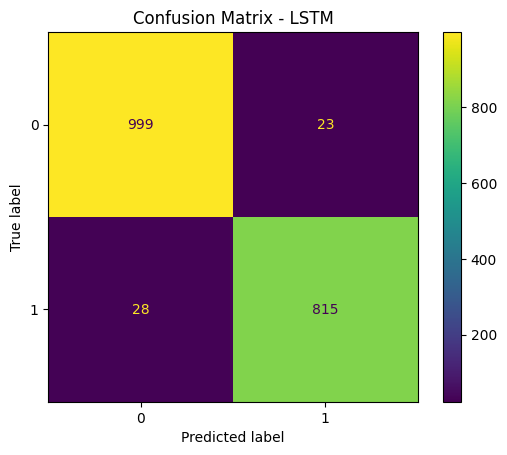

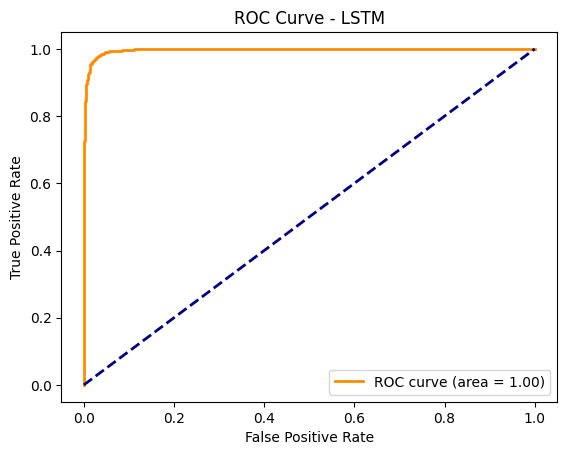

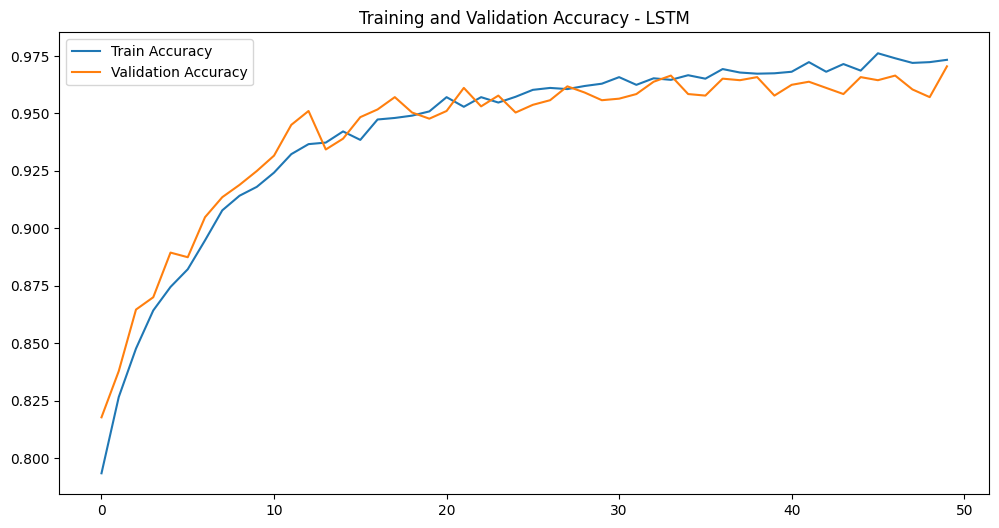

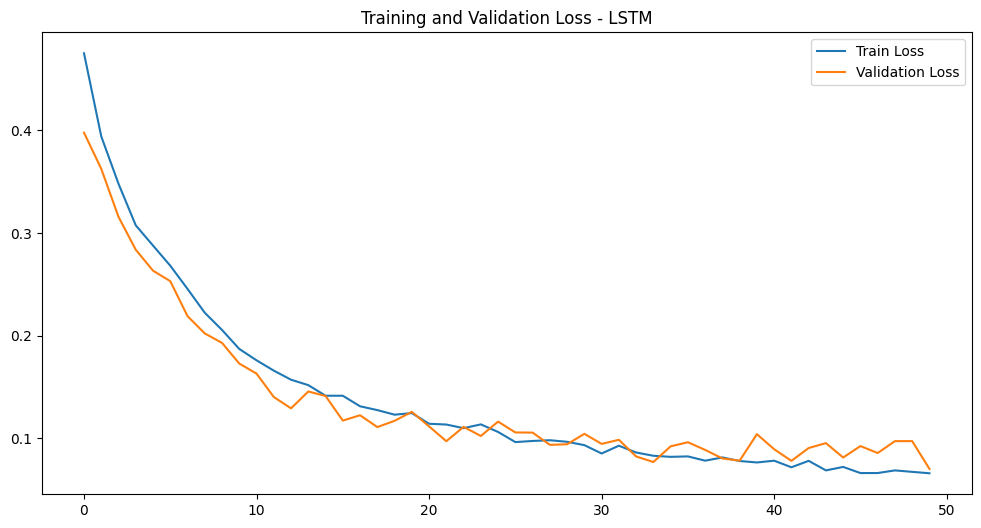

In [ ]:

# Full LSTM Code
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt

# Results directory
results_dir = "results/LSTM"
os.makedirs(results_dir, exist_ok=True)

# Load and preprocess dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col].fillna(data[col].mode()[0], inplace=True)

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

target_column = "QT"
X = data.drop(columns=[target_column])
y = data[target_column]
scaler = StandardScaler()
X = scaler.fit_transform(X)

threshold = y.mean()
y = (y > threshold).astype(int)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train_reshaped = np.expand_dims(X_train, axis=2)
X_test_reshaped = np.expand_dims(X_test, axis=2)

# LSTM Model
model = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], 1)),
    Dropout(0.3),
    LSTM(32),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
history = model.fit(X_train_reshaped, y_train, epochs=50, batch_size=64, validation_split=0.2, verbose=1)

# Predictions
y_pred_prob = model.predict(X_test_reshaped).flatten()
y_pred = (y_pred_prob > 0.5).astype(int)

# Classification report
classification_report_dict = classification_report(y_test, y_pred, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
classification_report_df.to_csv(f"{results_dir}/classification_report.csv", index=True)
print(f"\nLSTM Classification Report:\n")
print(classification_report_df)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Confusion Matrix - LSTM")
plt.savefig(f"{results_dir}/confusion_matrix.png")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - LSTM')
plt.legend(loc="lower right")
plt.savefig(f"{results_dir}/roc_curve.png")
plt.show()

# Accuracy and Loss Plots
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy - LSTM')
plt.legend()
plt.savefig(f"{results_dir}/accuracy_plot.png")
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss - LSTM')
plt.legend()
plt.savefig(f"{results_dir}/loss_plot.png")
plt.show()

# Save the model
model.save(f"{results_dir}/lstm_model.h5")


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
313/313 ━━━━━━

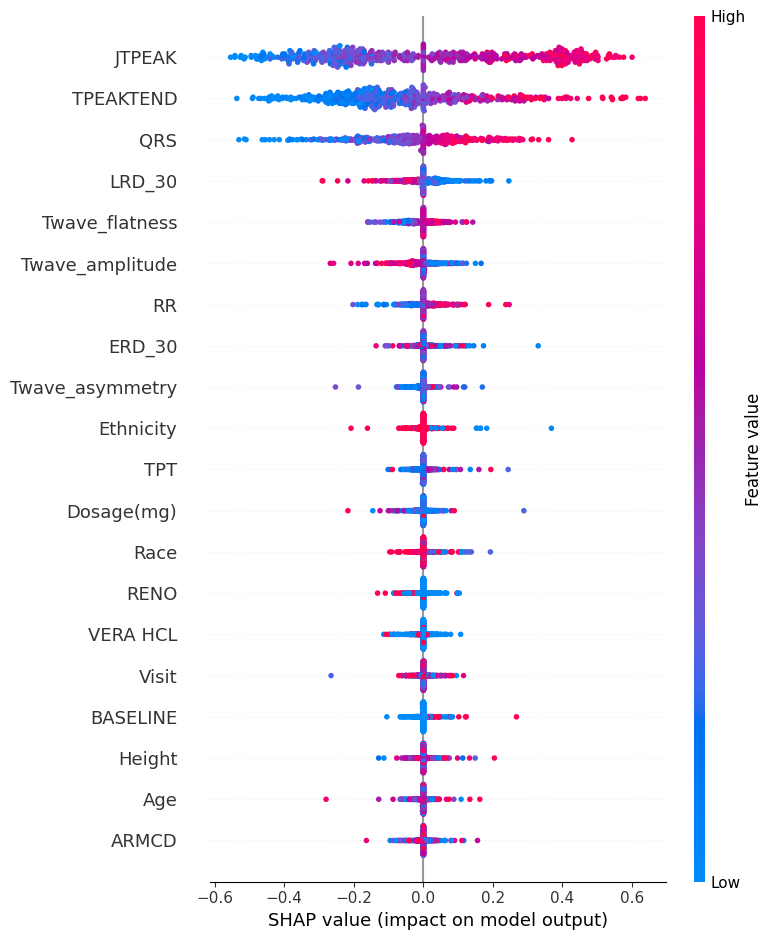

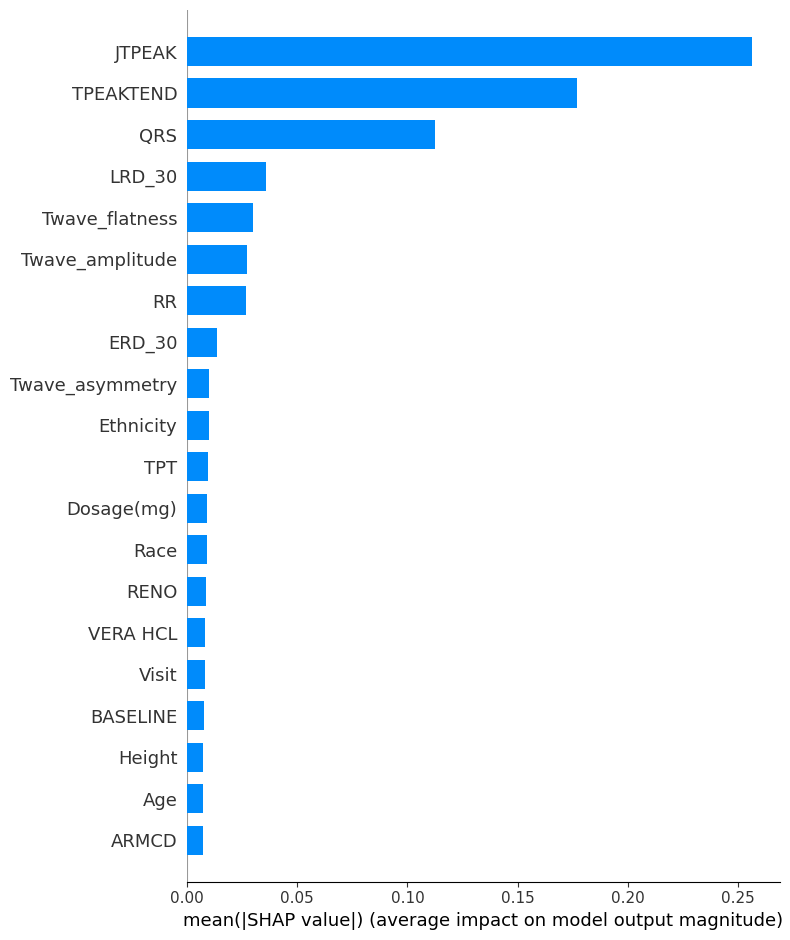

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

# Load the dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Preprocessing
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

target_column = "QT"
X = data.drop(columns=[target_column])
y = data[target_column]

scaler = StandardScaler()
X = scaler.fit_transform(X)

threshold = y.mean()
y = (y > threshold).astype(int)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Load the trained model
model_path = "results/LSTM/lstm_model.h5"
model = tf.keras.models.load_model(model_path)

# Define a model prediction function for KernelExplainer
def model_function(data):
    return model.predict(np.expand_dims(data, axis=2)).flatten()

# Use a smaller subset of the training data as the background dataset
background = X_train[:100]  # Use first 100 samples for background

# Create SHAP KernelExplainer
explainer = shap.KernelExplainer(model_function, background)

# Use a smaller subset of the test data for efficiency
X_test_sample = X_test[:500]  # Use first 500 rows for faster computation

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_sample, nsamples=100)  # Adjust `nsamples` as needed for speed

# Visualize SHAP values
# 1. Summary Plot: Overview of feature contributions
shap.summary_plot(shap_values, X_test_sample, feature_names=data.drop(columns=["QT"]).columns)

# 2. Bar Plot: Mean absolute SHAP value per feature
shap.summary_plot(shap_values, X_test_sample, feature_names=data.drop(columns=["QT"]).columns, plot_type="bar")


Epoch 1/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - accuracy: 0.6915 - loss: 0.5605 - val_accuracy: 0.8224 - val_loss: 0.3908 - learning_rate: 0.0010
Epoch 2/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.8302 - loss: 0.3731 - val_accuracy: 0.8371 - val_loss: 0.3598 - learning_rate: 0.0010
Epoch 3/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.8465 - loss: 0.3578 - val_accuracy: 0.8338 - val_loss: 0.3673 - learning_rate: 0.0010
Epoch 4/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - accuracy: 0.8502 - loss: 0.3435 - val_accuracy: 0.8733 - val_loss: 0.2913 - learning_rate: 0.0010
Epoch 5/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - accuracy: 0.8731 - loss: 0.2994 - val_accuracy: 0.8747 - val_loss: 0.2945 - learning_rate: 0.0010
Epoch 6/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.8743 - loss: 0.2825 - val_accuracy: 0.9042 - val_loss: 0.2385 - learning_rate: 0.0010
Epoch 7/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.9041 - loss: 0.

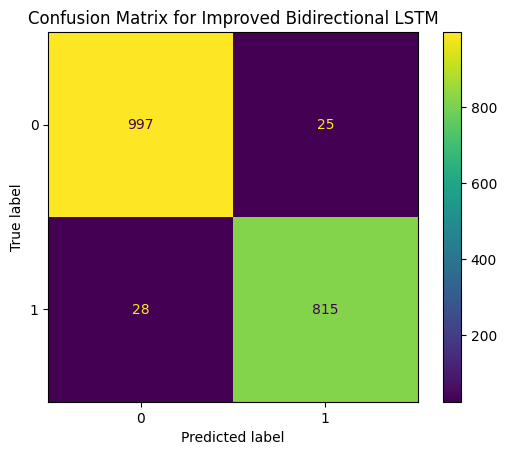

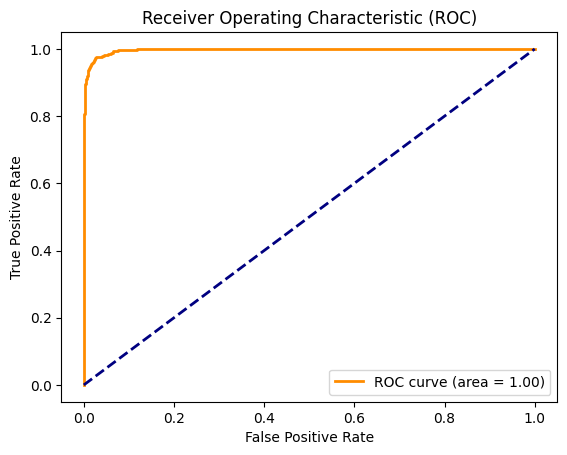

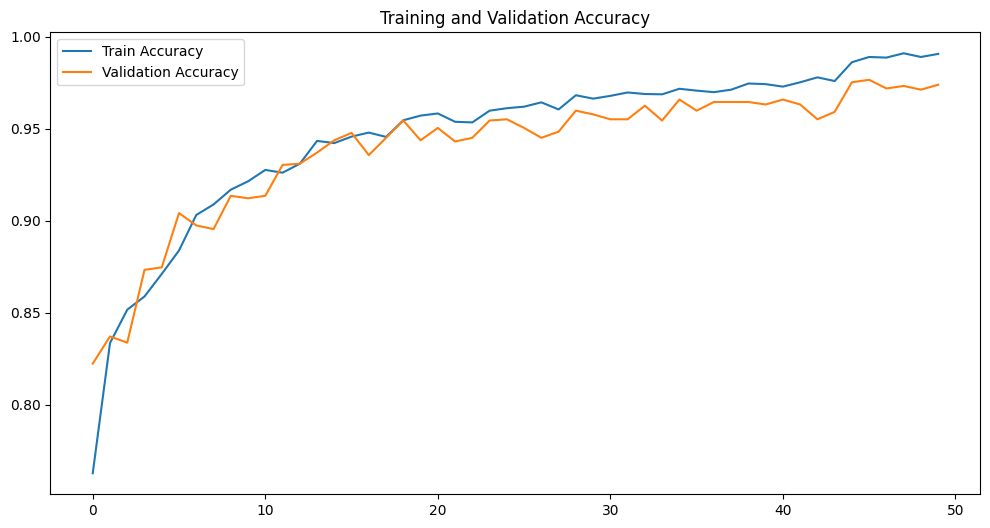

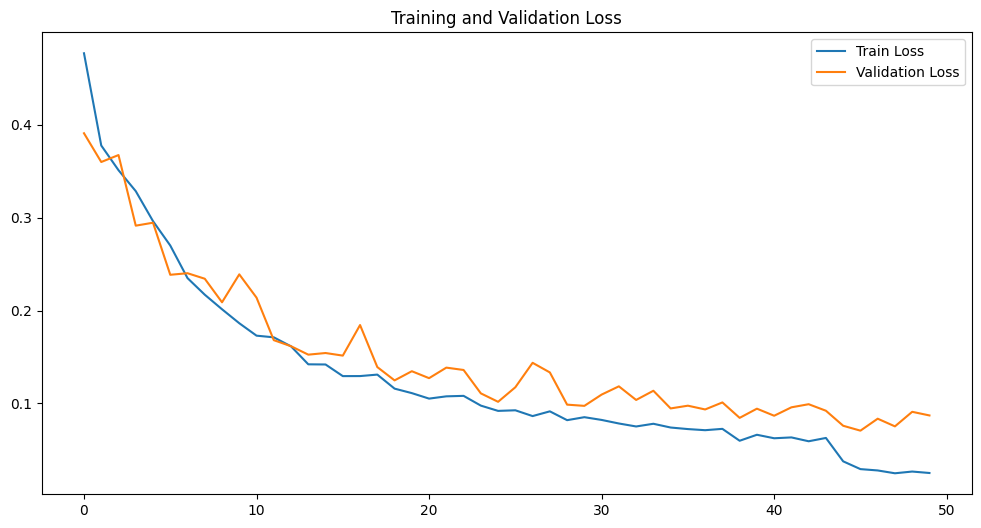

In [ ]:
# BiLSTM QT Prolongation

import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Bidirectional, LSTM, Dropout, Conv1D, AdditiveAttention, Input, Flatten
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Create directories to save results
results_dir = "results/Improved_BiLSTM"
os.makedirs(results_dir, exist_ok=True)

# Load and process the dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')  # Update with the correct path if different

# Handle missing values
categorical_cols = data.select_dtypes(include=['object']).columns
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns

# Fill missing values
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

for col in numerical_cols:
    data[col] = data[col].fillna(data[col].mean())

# Feature encoding for categorical variables
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Define target column
target_column = 'QT'  # Replace with the correct target if it's not 'QT'

# Feature-target split
X = data.drop(columns=[target_column])
y = data[target_column]

# Normalize features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Convert target to binary (e.g., QT prolongation > threshold)
threshold = y.mean()  # Adjust based on domain knowledge
y = (y > threshold).astype(int)

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape inputs for LSTM
X_train = np.expand_dims(X_train, axis=2)
X_test = np.expand_dims(X_test, axis=2)

# Define the improved Bidirectional LSTM model with AdditiveAttention
input_layer = Input(shape=(X_train.shape[1], 1))
conv_layer = Conv1D(filters=32, kernel_size=3, activation='relu')(input_layer)
lstm_layer1 = Bidirectional(LSTM(64, return_sequences=True))(conv_layer)
attention_output = AdditiveAttention()([lstm_layer1, lstm_layer1])  # Attention layer
lstm_layer2 = Bidirectional(LSTM(32))(attention_output)
dropout_layer = Dropout(0.3)(lstm_layer2)
dense_layer = Dense(64, activation='relu')(dropout_layer)
output_layer = Dense(1, activation='sigmoid')(dense_layer)

model = Model(inputs=input_layer, outputs=output_layer)

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5)

# Train the model
history = model.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Evaluate the model
y_pred_prob = model.predict(X_test).flatten()
y_pred = (y_pred_prob > 0.5).astype(int)

# Metrics calculation
metrics = {
    "classification_report": classification_report(y_test, y_pred, output_dict=True),
    "roc_auc": roc_auc_score(y_test, y_pred_prob),
}

# Save the classification report as a CSV file
classification_report_df = pd.DataFrame(metrics["classification_report"]).transpose()
classification_report_df.to_csv(f"{results_dir}/classification_report.csv", index=True)

# Print and display results
print("\nImproved Bidirectional LSTM Classification Report:\n", classification_report_df)

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Confusion Matrix for Improved Bidirectional LSTM")
plt.savefig(f"{results_dir}/confusion_matrix.png")
plt.show()

# ROC Curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc="lower right")
plt.savefig(f"{results_dir}/roc_curve.png")
plt.show()

# Accuracy and loss plots
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.savefig(f"{results_dir}/accuracy_plot.png")
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.savefig(f"{results_dir}/loss_plot.png")
plt.show()

# Save the model
model.save(f"{results_dir}/improved_bidirectional_lstm_model.h5")

4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 476ms/step


  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step

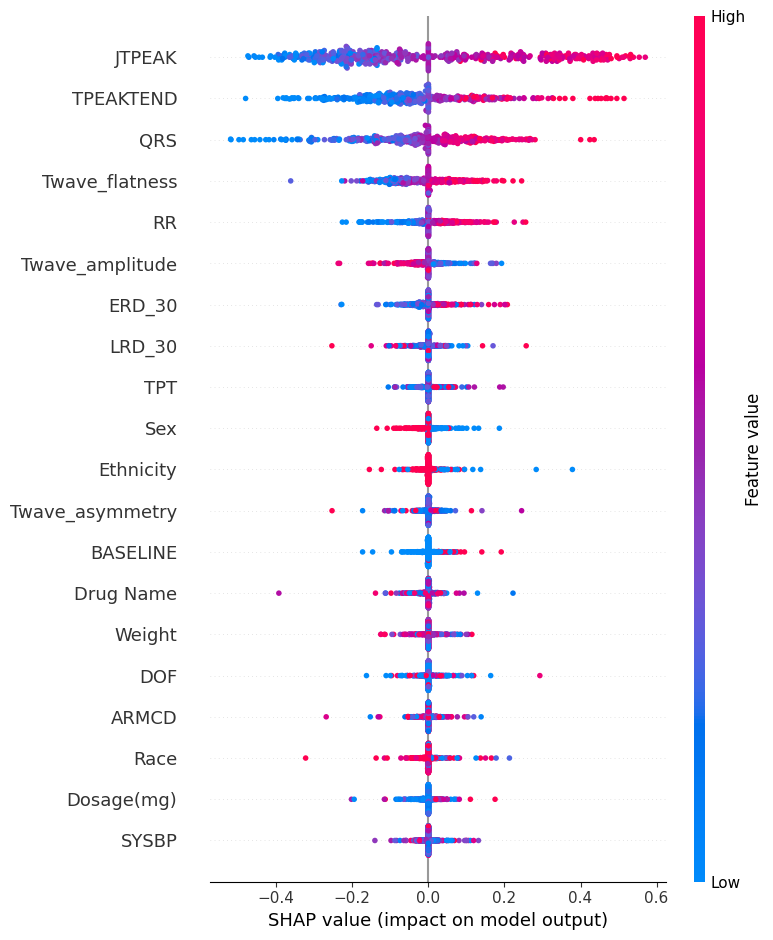

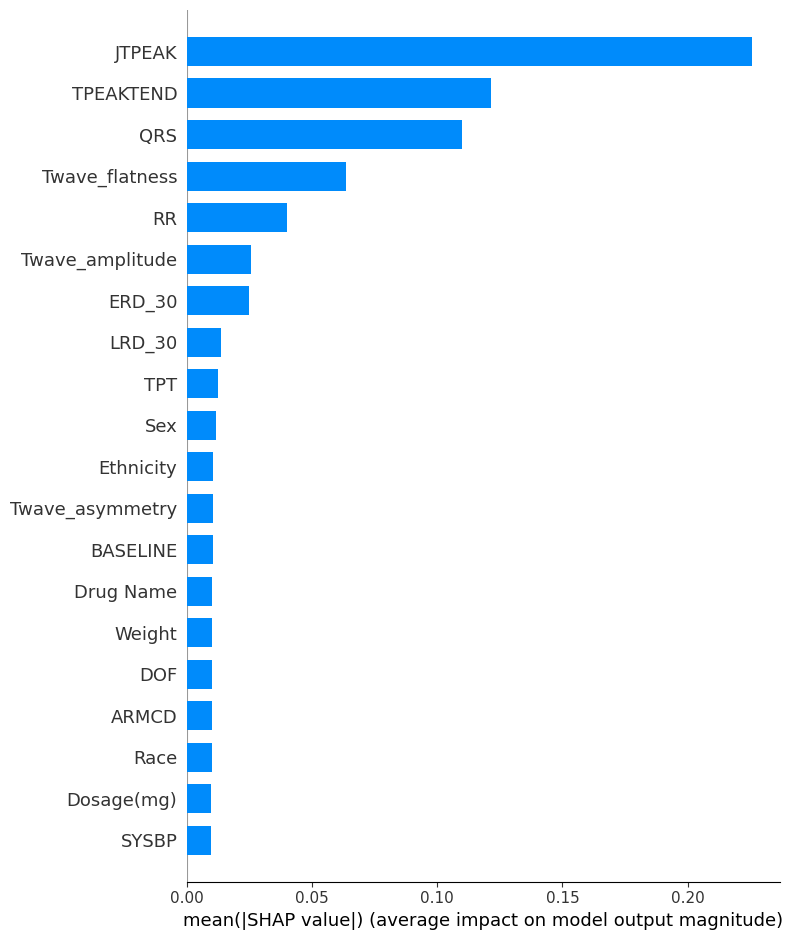

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

# Load the dataset
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# Handle missing values
categorical_cols = data.select_dtypes(include=['object']).columns
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns

for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

for col in numerical_cols:
    data[col] = data[col].fillna(data[col].mean())

# Encode categorical variables
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Define target column for QT prolongation
target_column = "QT"
X = data.drop(columns=[target_column])
y = data[target_column]

# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Convert target to binary (QT prolongation)
threshold = y.mean()  # Adjust based on domain knowledge
y = (y > threshold).astype(int)

# **Corrected Reshape for BiLSTM** (samples, timesteps, features)
timesteps = X_scaled.shape[1]  # Set timesteps equal to the number of features
X_scaled_reshaped = X_scaled.reshape(X_scaled.shape[0], timesteps, 1)  # Now (samples, 36, 1)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled_reshaped, y, test_size=0.2, random_state=42)

# Fix NaN values
X_train = np.nan_to_num(X_train)
X_test = np.nan_to_num(X_test)

# Load the trained BiLSTM model
model_path = "results/Improved_BiLSTM/improved_bidirectional_lstm_model.h5"
model = tf.keras.models.load_model(model_path)

# Define a model prediction function for SHAP (Ensure correct reshaping)
def model_function(data):
    data_reshaped = data.reshape(data.shape[0], timesteps, 1)  # Ensure correct shape for BiLSTM
    return model.predict(data_reshaped).flatten()

# Use a smaller subset of the training data as the background dataset
background = X_train[:100]  # First 100 samples for background

# Use a smaller subset of the test data for SHAP calculation
X_test_sample = X_test[:500]  # First 500 rows for faster computation

# **Flatten background and test data for SHAP**
background_flat = background.reshape(background.shape[0], timesteps)
X_test_sample_flat = X_test_sample.reshape(X_test_sample.shape[0], timesteps)

# Create SHAP KernelExplainer
explainer = shap.KernelExplainer(model_function, background_flat)

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_sample_flat, nsamples=100)  # Adjust `nsamples` as needed

# Visualize SHAP values
# 1. Summary Plot: Overview of feature contributions
shap.summary_plot(shap_values, X_test_sample_flat, feature_names=X.columns)

# 2. Bar Plot: Mean absolute SHAP value per feature
shap.summary_plot(shap_values, X_test_sample_flat, feature_names=X.columns, plot_type="bar")


Epoch 1/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 17s 45ms/step - accuracy: 0.6127 - loss: 0.6448 - val_accuracy: 0.8231 - val_loss: 0.4165 - learning_rate: 0.0010
Epoch 2/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.7935 - loss: 0.4535 - val_accuracy: 0.8123 - val_loss: 0.4147 - learning_rate: 0.0010
Epoch 3/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - accuracy: 0.8409 - loss: 0.3721 - val_accuracy: 0.8458 - val_loss: 0.3427 - learning_rate: 0.0010
Epoch 4/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - accuracy: 0.8433 - loss: 0.3594 - val_accuracy: 0.8539 - val_loss: 0.3377 - learning_rate: 0.0010
Epoch 5/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 10s 31ms/step - accuracy: 0.8651 - loss: 0.3273 - val_accuracy: 0.8660 - val_loss: 0.3072 - learning_rate: 0.0010
Epoch 6/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - accuracy: 0.8740 - loss: 0.3004 - val_accuracy: 0.8753 - val_loss: 0.2797 - learning_rate: 0.0010
Epoch 7/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.8760 - loss:

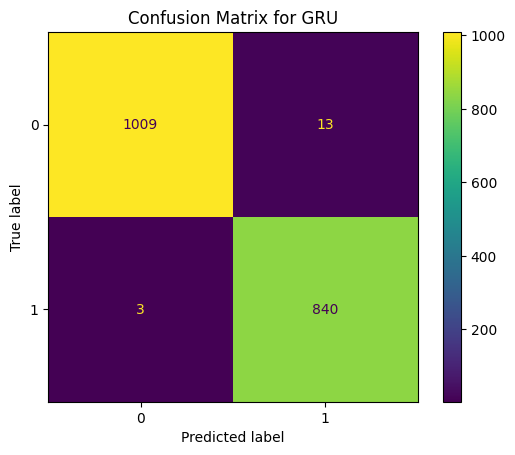

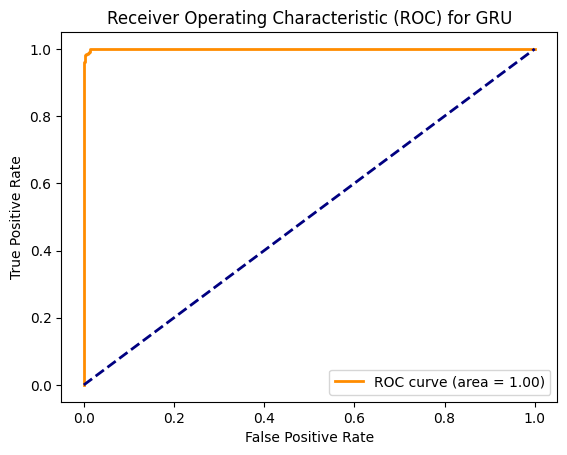

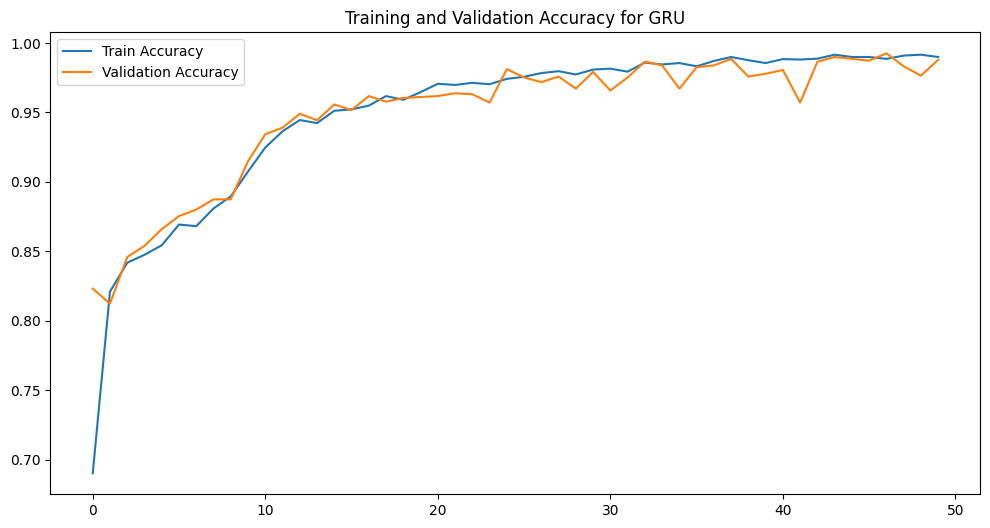

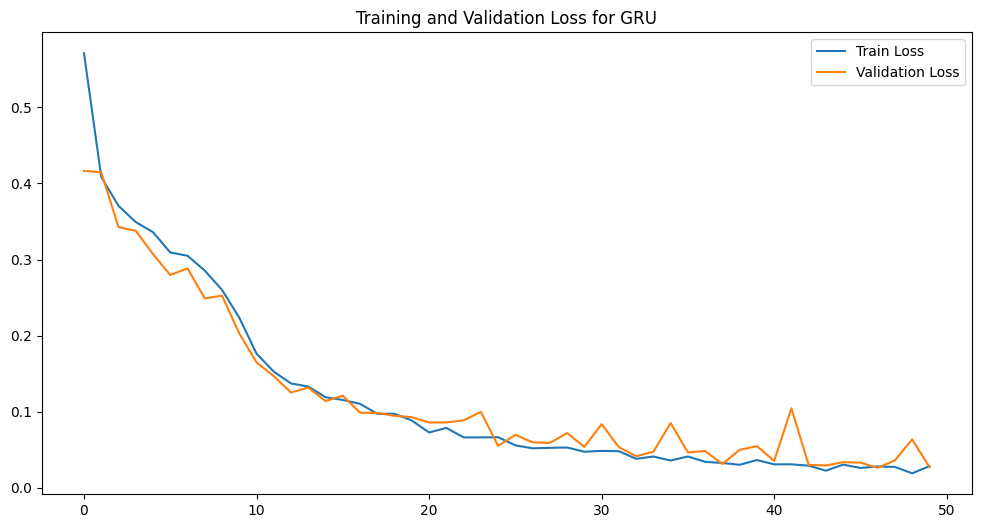

In [ ]:
# GRU

import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Bidirectional, GRU, Dropout, Conv1D, AdditiveAttention, Input, Flatten
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt

# Create directories to save results
results_dir = "results/GRU"
os.makedirs(results_dir, exist_ok=True)

# Load and process the dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')  # Update with the correct path if different

# Handle missing values
categorical_cols = data.select_dtypes(include=['object']).columns
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns

# Fill missing values
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

for col in numerical_cols:
    data[col] = data[col].fillna(data[col].mean())

# Feature encoding for categorical variables
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Define target column
target_column = 'QT'  # Replace with the correct target if it's not 'QT'

# Feature-target split
X = data.drop(columns=[target_column])
y = data[target_column]

# Normalize features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Convert target to binary (e.g., QT prolongation > threshold)
threshold = y.mean()  # Adjust based on domain knowledge
y = (y > threshold).astype(int)

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape inputs for GRU
X_train = np.expand_dims(X_train, axis=2)
X_test = np.expand_dims(X_test, axis=2)

# Define the GRU-based model
input_layer = Input(shape=(X_train.shape[1], 1))
conv_layer = Conv1D(filters=32, kernel_size=3, activation='relu')(input_layer)
gru_layer1 = Bidirectional(GRU(64, return_sequences=True))(conv_layer)
attention_output = AdditiveAttention()([gru_layer1, gru_layer1])  # Attention layer
gru_layer2 = Bidirectional(GRU(32))(attention_output)
dropout_layer = Dropout(0.3)(gru_layer2)
dense_layer = Dense(64, activation='relu')(dropout_layer)
output_layer = Dense(1, activation='sigmoid')(dense_layer)

model_gru = Model(inputs=input_layer, outputs=output_layer)

# Compile the GRU model
model_gru.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5)

# Train the GRU model
history_gru = model_gru.fit(
    X_train, y_train,
    epochs=50,
    batch_size=32,
    validation_split=0.2,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Evaluate the GRU model
y_pred_prob_gru = model_gru.predict(X_test).flatten()
y_pred_gru = (y_pred_prob_gru > 0.5).astype(int)

# Metrics calculation
metrics_gru = {
    "classification_report": classification_report(y_test, y_pred_gru, output_dict=True),
    "roc_auc": roc_auc_score(y_test, y_pred_prob_gru),
}

# Save the classification report as a CSV file
classification_report_df = pd.DataFrame(metrics_gru["classification_report"]).transpose()
classification_report_df.to_csv(f"{results_dir}/classification_report_gru.csv", index=True)

# Print and display results
print("\nGRU Classification Report:\n", classification_report_df)

# Confusion matrix
cm_gru = confusion_matrix(y_test, y_pred_gru)
disp_gru = ConfusionMatrixDisplay(confusion_matrix=cm_gru)
disp_gru.plot()
plt.title("Confusion Matrix for GRU")
plt.savefig(f"{results_dir}/gru_confusion_matrix.png")
plt.show()

# ROC Curve for GRU
fpr_gru, tpr_gru, thresholds_gru = roc_curve(y_test, y_pred_prob_gru)
roc_auc_gru = auc(fpr_gru, tpr_gru)

plt.figure()
plt.plot(fpr_gru, tpr_gru, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc_gru:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) for GRU')
plt.legend(loc="lower right")
plt.savefig(f"{results_dir}/gru_roc_curve.png")
plt.show()

# Accuracy and loss plots for GRU
plt.figure(figsize=(12, 6))
plt.plot(history_gru.history['accuracy'], label='Train Accuracy')
plt.plot(history_gru.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy for GRU')
plt.legend()
plt.savefig(f"{results_dir}/gru_accuracy_plot.png")
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history_gru.history['loss'], label='Train Loss')
plt.plot(history_gru.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss for GRU')
plt.legend()
plt.savefig(f"{results_dir}/gru_loss_plot.png")
plt.show()

# Save the GRU model
model_gru.save(f"{results_dir}/gru_model.h5")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step


  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
313/313 ━━━━━

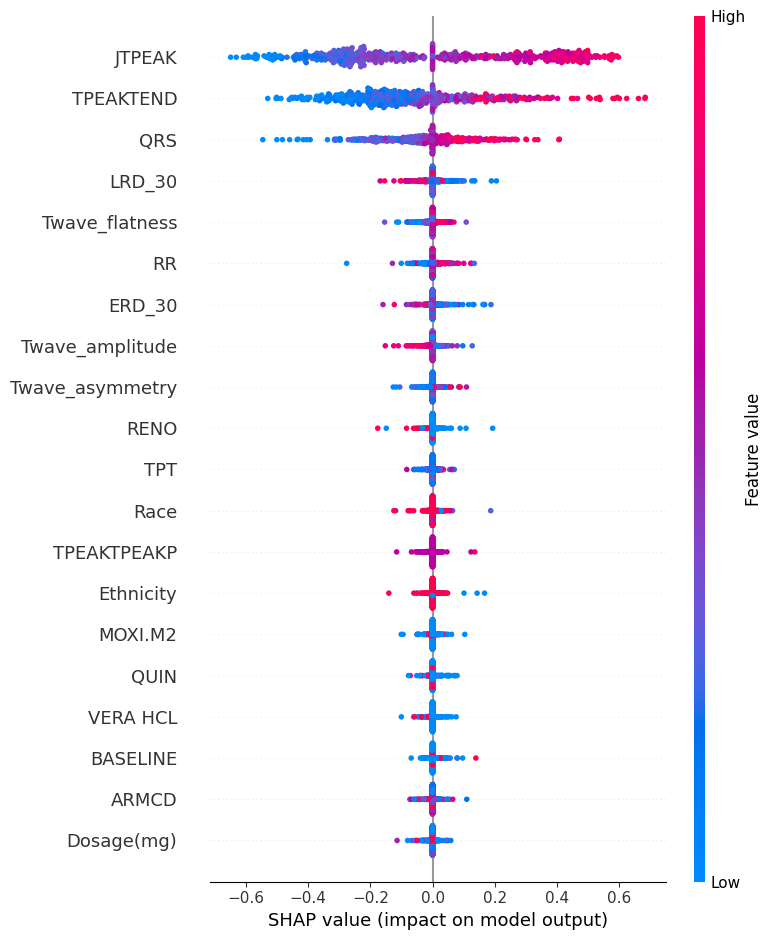

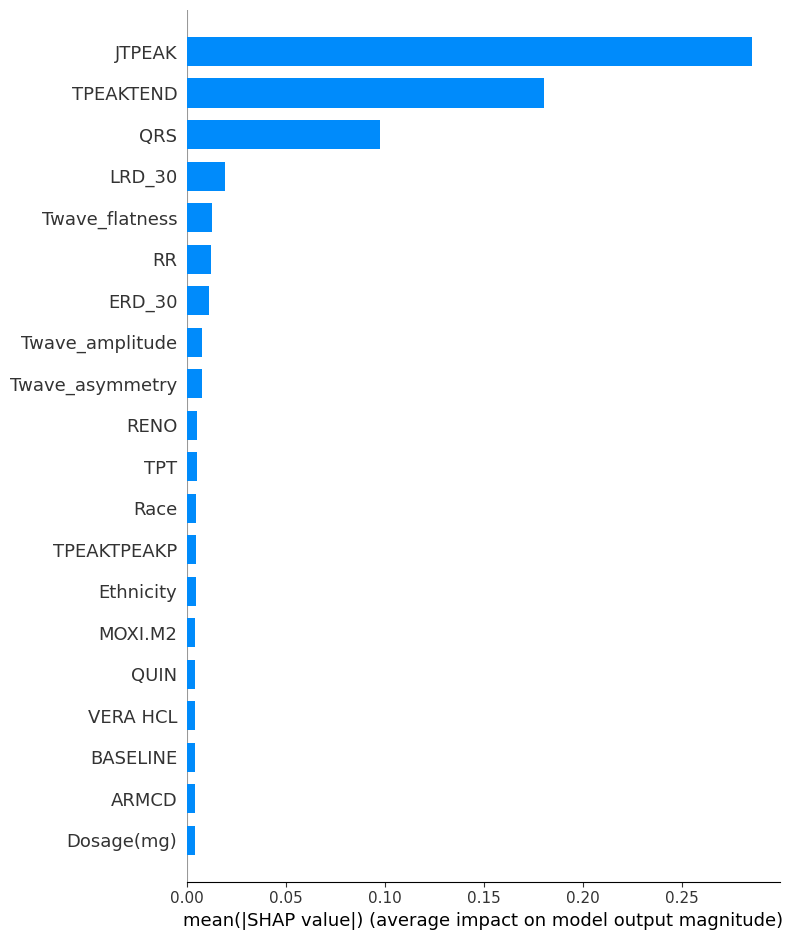

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

# Load the dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Preprocessing
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

target_column = "QT"
X = data.drop(columns=[target_column])
y = data[target_column]

scaler = StandardScaler()
X = scaler.fit_transform(X)

threshold = y.mean()
y = (y > threshold).astype(int)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Load the trained GRU model
model_path = "results/GRU/gru_model.h5"
model = tf.keras.models.load_model(model_path)

# Define a model prediction function for KernelExplainer
def model_function(data):
    return model.predict(np.expand_dims(data, axis=2)).flatten()

# Use a smaller subset of the training data as the background dataset
background = X_train[:100]  # Use first 100 samples for background

# Create SHAP KernelExplainer
explainer = shap.KernelExplainer(model_function, background)

# Use a smaller subset of the test data for efficiency
X_test_sample = X_test[:500]  # Use first 500 rows for faster computation

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_sample, nsamples=100)  # Adjust `nsamples` as needed for speed

# Visualize SHAP values
# 1. Summary Plot: Overview of feature contributions
shap.summary_plot(shap_values, X_test_sample, feature_names=data.drop(columns=["QT"]).columns)

# 2. Bar Plot: Mean absolute SHAP value per feature
shap.summary_plot(shap_values, X_test_sample, feature_names=data.drop(columns=["QT"]).columns, plot_type="bar")


Epoch 1/50


<ipython-input-5-7b22d535498a>:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].mode()[0], inplace=True)


94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - accuracy: 0.8293 - loss: 0.3532 - val_accuracy: 0.9611 - val_loss: 0.1006
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9478 - loss: 0.1209 - val_accuracy: 0.9618 - val_loss: 0.1012
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9633 - loss: 0.0923 - val_accuracy: 0.9678 - val_loss: 0.0861
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9685 - loss: 0.0749 - val_accuracy: 0.9772 - val_loss: 0.0642
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9586 - loss: 0.1055 - val_accuracy: 0.9725 - val_loss: 0.0952
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9745 - loss: 0.0728 - val_accuracy: 0.9779 - val_loss: 0.0532
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9774 - loss: 0.0668 - val_accuracy: 0.9792 - val_loss: 0.0597
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9736 - loss: 0.0655 - val_accuracy: 0.9853 - val_loss: 0.0400
Ep

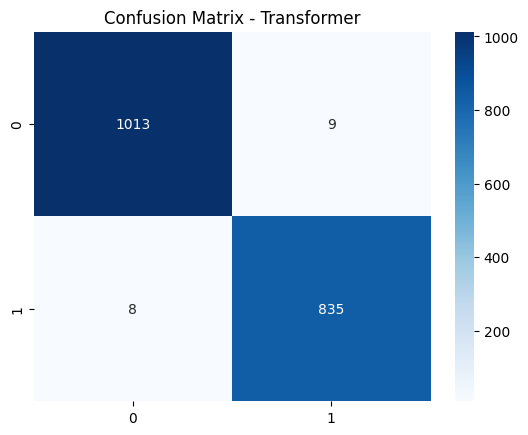

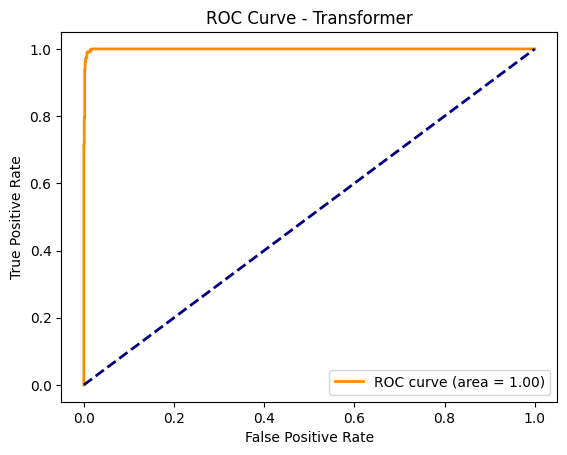

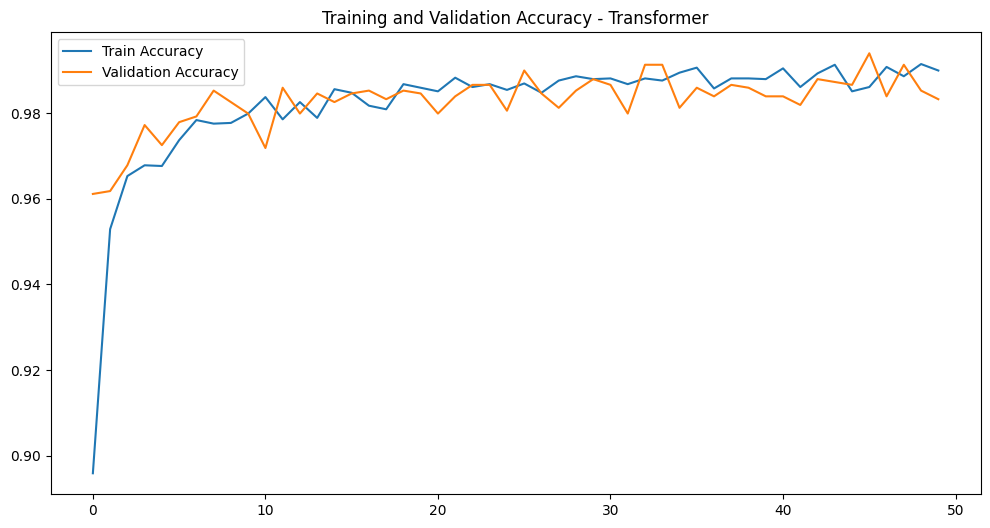

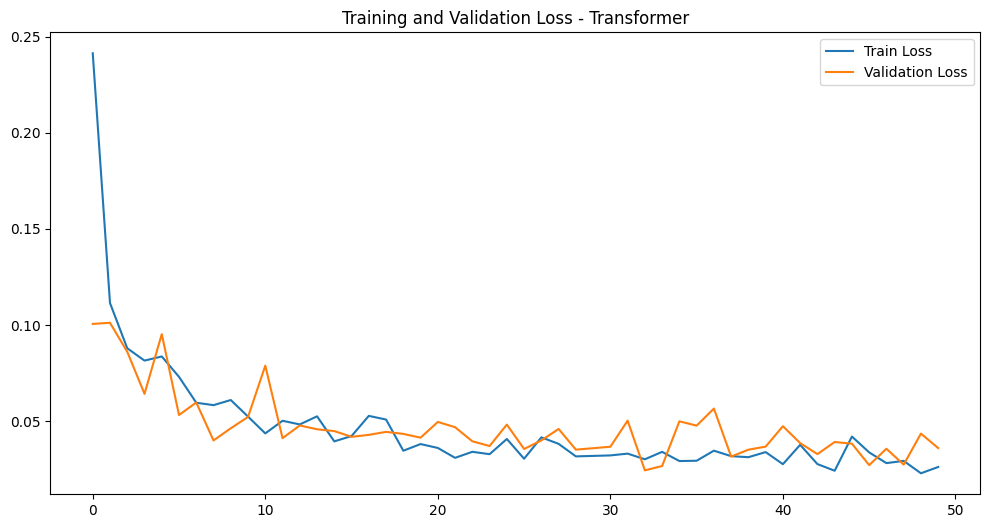

In [ ]:
#TRANFORMERS
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, MultiHeadAttention, LayerNormalization, Input, Reshape, Flatten
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# Results directory
results_dir = "results/Transformer_Anomaly_Detection"
os.makedirs(results_dir, exist_ok=True)

# Load and preprocess dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Handle missing values
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col].fillna(data[col].mode()[0], inplace=True)

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Define target column
target_column = "QT"
X = data.drop(columns=[target_column])
y = data[target_column]

# Normalize features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Binarize target based on a threshold
threshold = y.mean()
y = (y > threshold).astype(int)

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define Transformer model
def build_transformer(input_shape):
    inputs = Input(shape=input_shape)
    x = Reshape((1, input_shape[0]))(inputs)  # Add sequence length of 1
    x = MultiHeadAttention(num_heads=4, key_dim=64)(x, x)
    x = LayerNormalization()(x)
    x = Flatten()(x)  # Flatten back to 2D
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

# Compile model
model = build_transformer((X_train.shape[1],))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=50,
    batch_size=64,
    verbose=1
)

# Predictions
y_pred_prob = model.predict(X_test).flatten()
y_pred = (y_pred_prob > 0.5).astype(int)

# Classification report
classification_report_dict = classification_report(y_test, y_pred, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
classification_report_df.to_csv(f"{results_dir}/classification_report.csv", index=True)
print(f"\nTransformer Classification Report:\n")
print(classification_report_df)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure()
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Transformer")
plt.savefig(f"{results_dir}/confusion_matrix.png")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Transformer')
plt.legend(loc="lower right")
plt.savefig(f"{results_dir}/roc_curve.png")
plt.show()

# Accuracy and Loss Plots
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy - Transformer')
plt.legend()
plt.savefig(f"{results_dir}/accuracy_plot.png")
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss - Transformer')
plt.legend()
plt.savefig(f"{results_dir}/loss_plot.png")
plt.show()

# Save the model
model.save(f"{results_dir}/transformer_model.h5")

4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 178ms/step


  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 326ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
313/313 ━━━━━

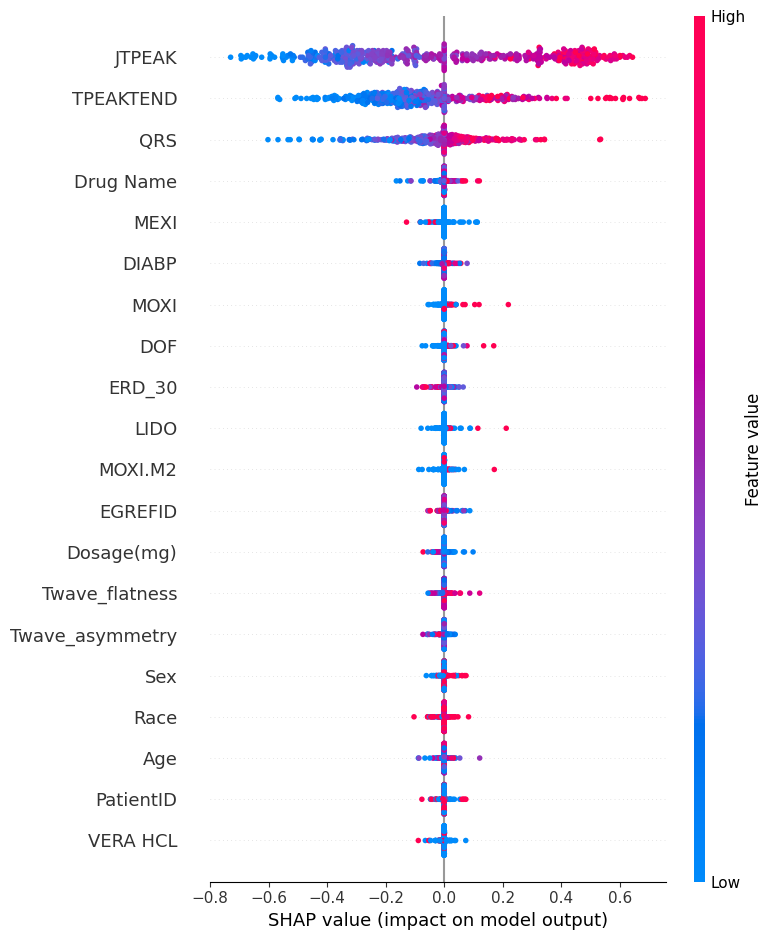

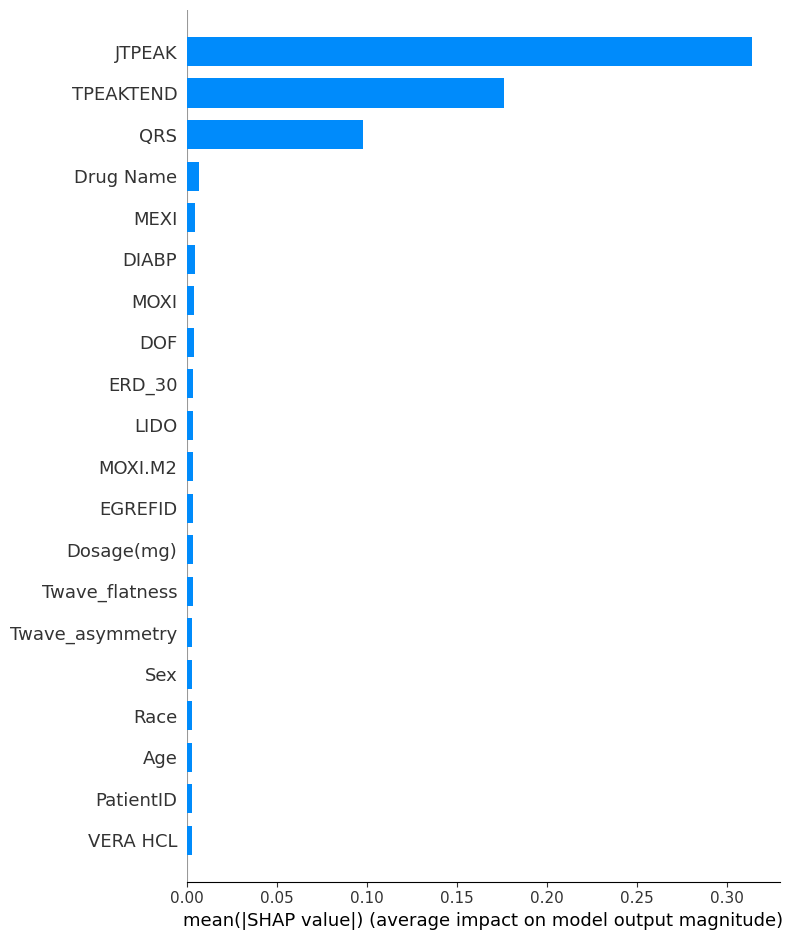

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

# Load the dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Preprocessing
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

target_column = "QT"
X = data.drop(columns=[target_column])
y = data[target_column]

scaler = StandardScaler()
X = scaler.fit_transform(X)

threshold = y.mean()
y = (y > threshold).astype(int)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Load the trained Transformer model
model_path = "results/Transformer_Anomaly_Detection/transformer_model.h5"
model = tf.keras.models.load_model(model_path)

# Define a model prediction function for KernelExplainer
def model_function(data):
    return model.predict(data).flatten()  # No need to reshape, Transformers use 2D input

# Use a smaller subset of the training data as the background dataset
background = X_train[:100]  # Use first 100 samples for background

# Create SHAP KernelExplainer
explainer = shap.KernelExplainer(model_function, background)

# Use a smaller subset of the test data for efficiency
X_test_sample = X_test[:500]  # Use first 500 rows for faster computation

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_sample, nsamples=100)  # Adjust `nsamples` as needed for speed

# Visualize SHAP values
# 1. Summary Plot: Overview of feature contributions
shap.summary_plot(shap_values, X_test_sample, feature_names=data.drop(columns=["QT"]).columns)

# 2. Bar Plot: Mean absolute SHAP value per feature
shap.summary_plot(shap_values, X_test_sample, feature_names=data.drop(columns=["QT"]).columns, plot_type="bar")


**ECG**

<ipython-input-1-fecc214c5d38>:24: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].mode()[0], inplace=True)
<ipython-input-1-fecc214c5d38>:26: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try u

Epoch 1/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 8s 16ms/step - accuracy: 0.8738 - loss: 0.3893 - val_accuracy: 0.9068 - val_loss: 0.2098 - learning_rate: 0.0010
Epoch 2/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 7s 9ms/step - accuracy: 0.9127 - loss: 0.2057 - val_accuracy: 0.9189 - val_loss: 0.2097 - learning_rate: 0.0010
Epoch 3/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - accuracy: 0.9200 - loss: 0.2085 - val_accuracy: 0.9243 - val_loss: 0.1893 - learning_rate: 0.0010
Epoch 4/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.9247 - loss: 0.1819 - val_accuracy: 0.9330 - val_loss: 0.1584 - learning_rate: 0.0010
Epoch 5/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.9384 - loss: 0.1507 - val_accuracy: 0.9658 - val_loss: 0.0921 - learning_rate: 0.0010
Epoch 6/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.9636 - loss: 0.0953 - val_accuracy: 0.9692 - val_loss: 0.0763 - learning_rate: 0.0010
Epoch 7/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.9636 - loss: 0.101

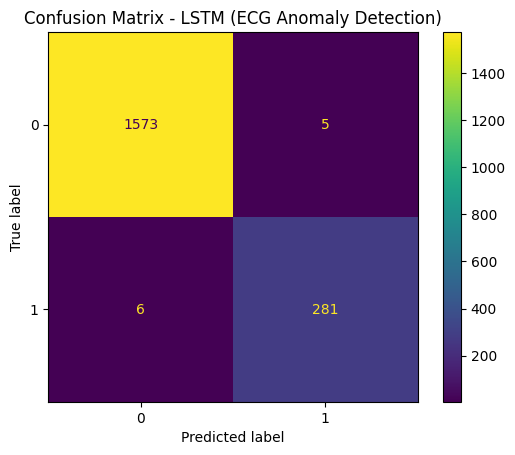

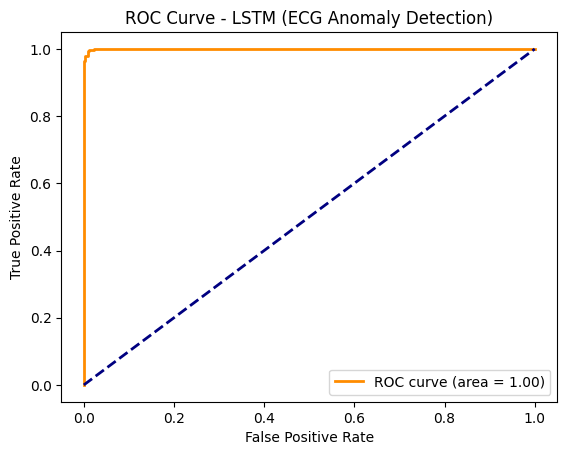

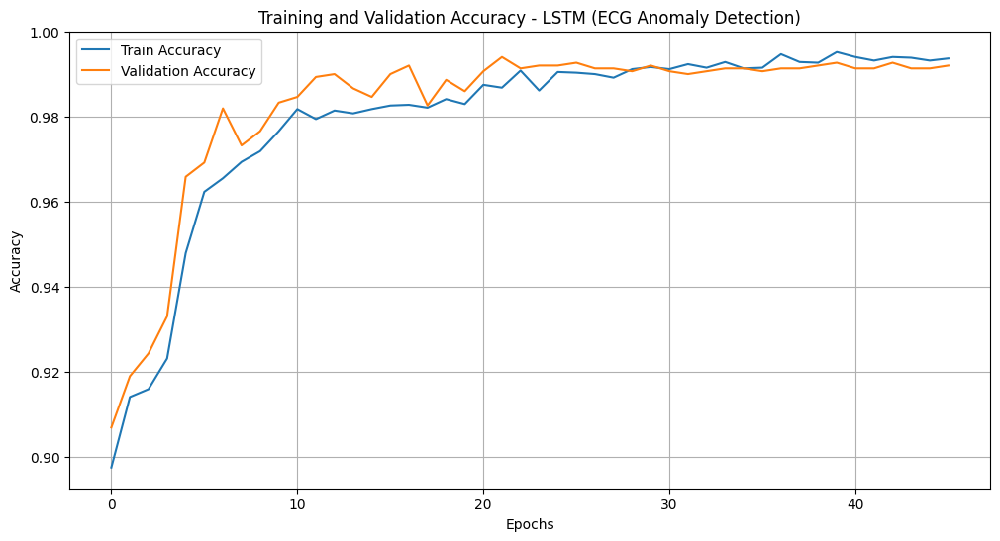

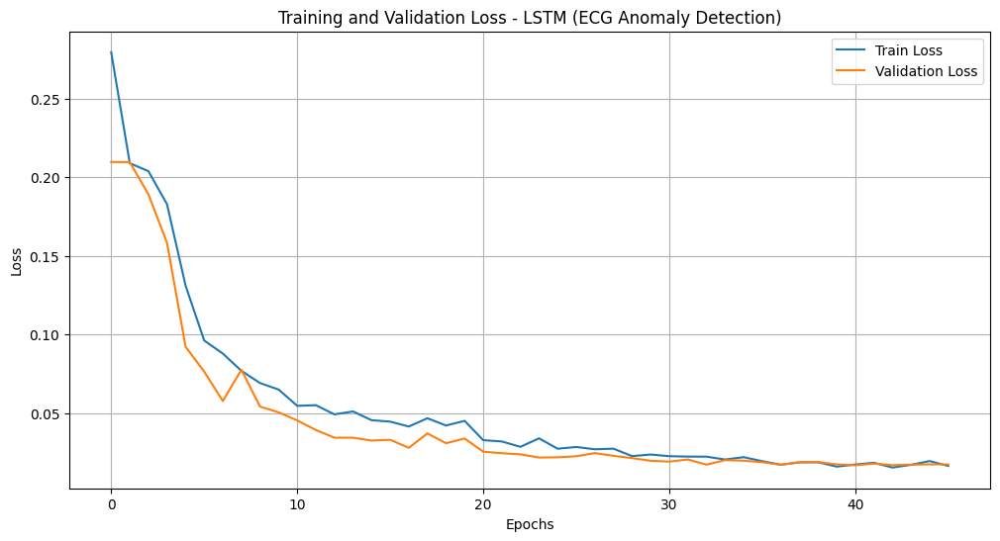

All results saved in 'results/LSTM_ECG'.


In [ ]:
# Import necessary libraries
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Step 1: Load dataset
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# Step 2: Handle missing values
categorical_cols = data.select_dtypes(include=["object"]).columns
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns

for col in categorical_cols:
    data[col].fillna(data[col].mode()[0], inplace=True)
for col in numerical_cols:
    data[col].fillna(data[col].mean(), inplace=True)

# Step 3: Encode categorical variables
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Step 4: Define ECG Anomaly Label (Using Multiple ECG Features)
data["ECG_Anomaly"] = (
    (data["QRS"] > 120) |   # Prolonged QRS (>120 ms)
    (data["RR"] < 600) |    # Short RR interval (<600 ms)
    (data["Twave_flatness"] > 0.5) | # Abnormal Twave_flatness
    (data["JTPEAK"] > 300)  # Long JTPEAK
).astype(int)

# Step 5: Define Features and Target Variable
target_column = "ECG_Anomaly"
X = data.drop(columns=[target_column])
y = data[target_column]

# Step 6: Normalize features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Step 7: Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape for LSTM
X_train_reshaped = np.expand_dims(X_train, axis=2)
X_test_reshaped = np.expand_dims(X_test, axis=2)

# Step 8: Define LSTM Model
model = Sequential([
    LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], 1)),
    Dropout(0.3),
    LSTM(32),
    Dropout(0.3),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(1, activation='sigmoid')
])

# Compile model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Step 9: Define Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)

# Step 10: Train Model
history = model.fit(
    X_train_reshaped, y_train,
    validation_split=0.2,
    epochs=50,
    batch_size=32,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Step 11: Make Predictions
y_pred_prob = model.predict(X_test_reshaped).flatten()
y_pred = (y_pred_prob > 0.5).astype(int)  # Adjust threshold if needed

# Step 12: Generate Classification Report
classification_report_dict = classification_report(y_test, y_pred, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()

# Step 13: Create Results Directory
results_dir = "results/LSTM_ECG"
os.makedirs(results_dir, exist_ok=True)

# Save classification report
classification_report_df.to_csv(f"{results_dir}/classification_report.csv", index=True)

# Step 14: Print Classification Report
print("\nLSTM Classification Report (ECG Anomaly Detection):\n")
print(classification_report_df)

# Step 15: Display Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title("Confusion Matrix - LSTM (ECG Anomaly Detection)")
plt.savefig(f"{results_dir}/confusion_matrix.png")
plt.show()

# Step 16: Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - LSTM (ECG Anomaly Detection)')
plt.legend(loc="lower right")
plt.savefig(f"{results_dir}/roc_curve.png")
plt.show()

# Step 17: Plot Accuracy and Loss Curves
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy - LSTM (ECG Anomaly Detection)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.savefig(f"{results_dir}/accuracy_plot.png")
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss - LSTM (ECG Anomaly Detection)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.savefig(f"{results_dir}/loss_plot.png")
plt.show()

# Step 18: Save Model
model.save(f"{results_dir}/lstm_ecg_anomaly_model.h5")

print(f"All results saved in '{results_dir}'.")


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 129ms/step


  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
313/313 ━━━━━━

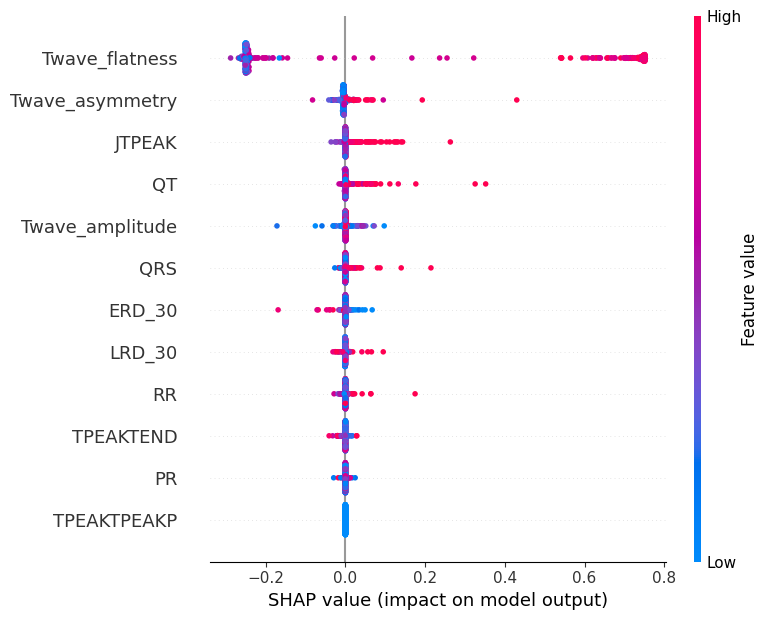

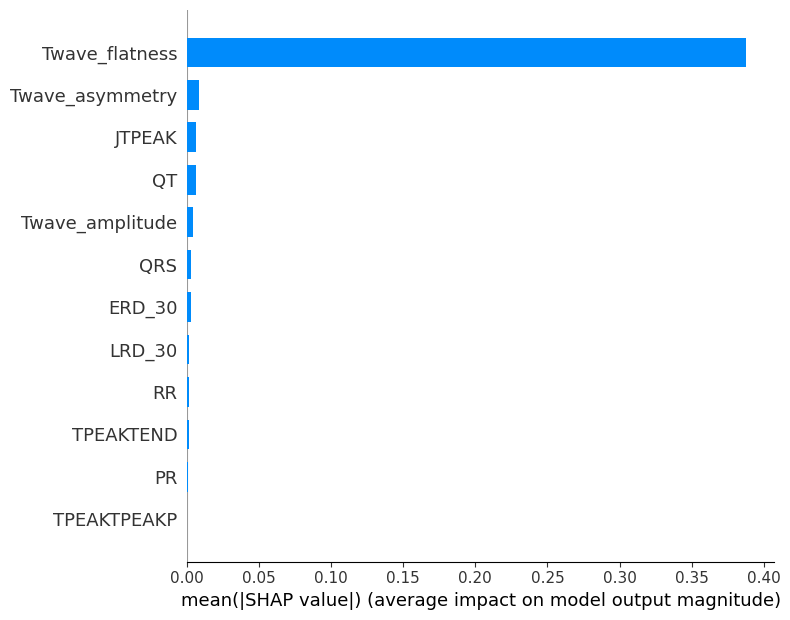

SHAP analysis completed.


In [ ]:
# Import required libraries
import os
import shap
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Step 1: Load the trained model
model_path = "results/LSTM_ECG/lstm_ecg_anomaly_model.h5"
model = load_model(model_path)

# Step 2: Load the dataset
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# Step 3: Preprocess the dataset
numerical_cols = ["RR", "PR", "QT", "QRS", "JTPEAK", "TPEAKTEND", "TPEAKTPEAKP",
                  "ERD_30", "LRD_30", "Twave_amplitude", "Twave_asymmetry", "Twave_flatness"]
categorical_cols = ["Sex", "Race", "Ethnicity", "Drug Name"]

# Handle missing values
data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

# Encode categorical variables
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Step 4: Extract input features (excluding target)
X = data[numerical_cols]

# Normalize numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reshape for LSTM model
X_scaled_reshaped = np.expand_dims(X_scaled, axis=2)  # Shape: (samples, timesteps, features)

# Step 5: Select a subset for SHAP analysis
X_sample = X_scaled_reshaped[:500]  # Use the first 500 samples

# Step 6: Define a model prediction function for SHAP
def model_function(data):
    return model.predict(np.expand_dims(data, axis=2)).flatten()

# Step 7: Create SHAP KernelExplainer
background = X_scaled[:100]  # Background dataset (first 100 samples)
explainer = shap.KernelExplainer(model_function, background)

# Step 8: Compute SHAP values
X_sample_reshaped = X_sample.squeeze(axis=2)  # Convert 3D -> 2D for SHAP
shap_values = explainer.shap_values(X_sample_reshaped, nsamples=100)

# Step 9: Generate SHAP Visualizations
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_sample_reshaped, feature_names=numerical_cols)

plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_sample_reshaped, feature_names=numerical_cols, plot_type="bar")

print("SHAP analysis completed.")


4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 285ms/step


  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
313/31

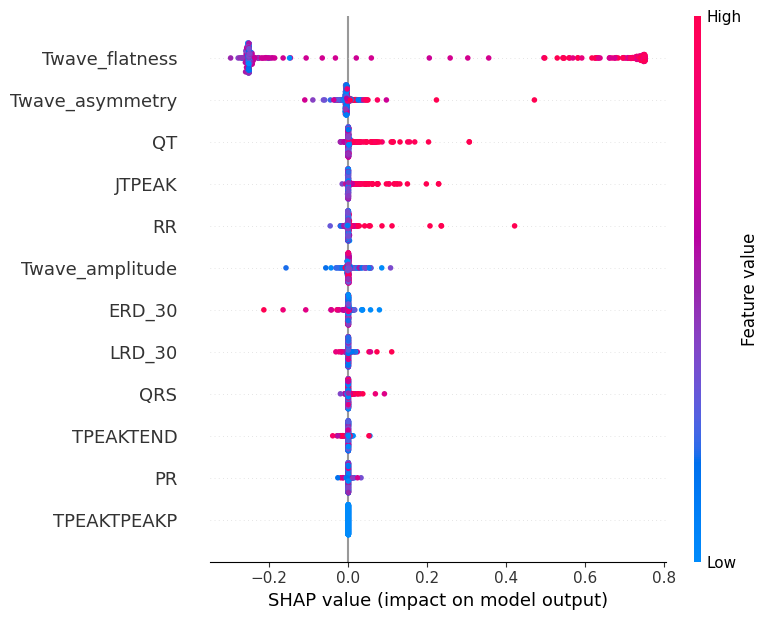

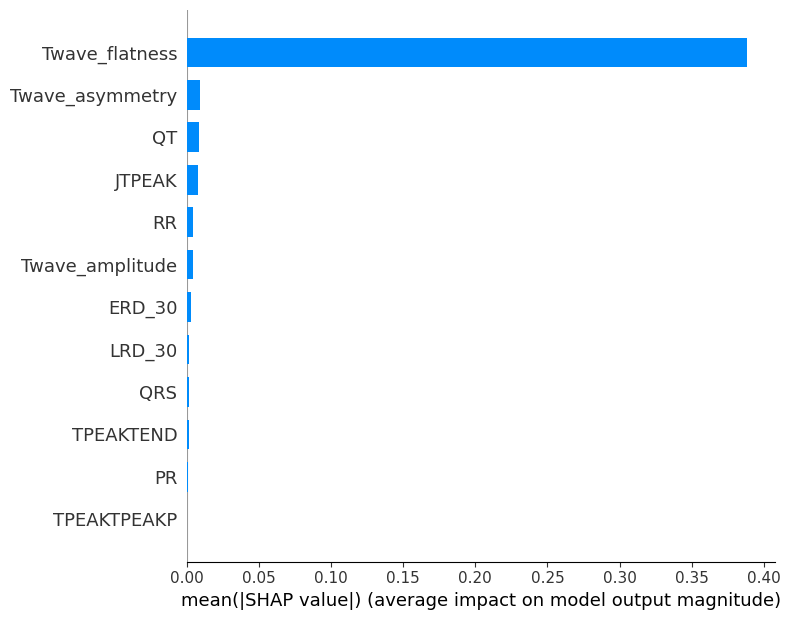

In [ ]:
import shap
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

# Load the trained model
model_path = "results/LSTM_ECG/lstm_ecg_anomaly_model.h5"
model = load_model(model_path)

# Load the dataset
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# Select numerical ECG-related features
ecg_features = [
    "QRS", "RR", "QT", "PR", "JTPEAK", "TPEAKTEND", "TPEAKTPEAKP",
    "ERD_30", "LRD_30", "Twave_amplitude", "Twave_asymmetry", "Twave_flatness"
]

# Ensure all features exist
missing_features = [col for col in ecg_features if col not in data.columns]
if missing_features:
    raise ValueError(f"Missing features in dataset: {missing_features}")

# Extract input features
X = data[ecg_features]

# **Step 1: Handle missing values properly**
X = X.fillna(X.mean())  # Fill missing values with mean of each column

# **Step 2: Normalize the features**
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# **Step 3: Ensure there are no NaNs in the final dataset**
if np.isnan(X_scaled).any():
    raise ValueError("NaN values detected after scaling. Please check the data preprocessing.")

# **Step 4: Use a smaller subset of data for SHAP due to computational cost**
X_sample = X_scaled[:500]  # Use first 500 samples

# **Step 5: Define a model prediction function**
def model_function(data):
    reshaped_data = np.expand_dims(data, axis=2)  # Reshape back to 3D for LSTM
    return model.predict(reshaped_data).flatten()

# **Step 6: Use a subset of training data as background**
background = X_scaled[:100]  # Use first 100 samples

# **Step 7: Create SHAP KernelExplainer**
explainer = shap.KernelExplainer(model_function, background)

# **Step 8: Compute SHAP values**
shap_values = explainer.shap_values(X_sample, nsamples=100)  # Adjust `nsamples` for accuracy vs speed

# **Step 9: Generate SHAP Visualizations**
# Summary Plot: Feature impact on model prediction
shap.summary_plot(shap_values, X_sample, feature_names=ecg_features)

# Bar Plot: Mean absolute SHAP value per feature
shap.summary_plot(shap_values, X_sample, feature_names=ecg_features, plot_type="bar")


TESTING THE SCHOLAR CODE

In [ ]:
!pip install imbalanced-learn tensorflow


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Bidirectional, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, roc_auc_score

# Load dataset
file_path = "/content/Merged dataset Sara.csv"  # Update with actual upload path
df = pd.read_csv(file_path)

# Define features and target
features = ['Age', 'Height', 'Weight', 'SYSBP', 'DIABP', 'Dosage(mg)', 'RR', 'PR', 'QT', 'QRS', 'JTPEAK', 'TPEAKTEND']
df['QT_Prolonged'] = ((df['Sex'] == 'M') & (df['QT'] >= 450)) | ((df['Sex'] == 'F') & (df['QT'] >= 460))
df['QT_Prolonged'] = df['QT_Prolonged'].astype(int)

# Drop missing values
df_clean = df[features + ['QT_Prolonged']].dropna()

# Split features and target
X = df_clean[features].values
y = df_clean['QT_Prolonged'].values

# Handle class imbalance using SMOTE
smote = SMOTE(sampling_strategy=0.5, random_state=42)  # Balance to 50%
X_resampled, y_resampled = smote.fit_resample(X, y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Reshape data for sequential models
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Function to build models
def build_model(model_type='LSTM', input_shape=(1, len(features))):
    model = Sequential()
    if model_type == 'LSTM':
        model.add(LSTM(64, return_sequences=True, input_shape=input_shape))
        model.add(LSTM(32))
    elif model_type == 'BiLSTM':
        model.add(Bidirectional(LSTM(64, return_sequences=True), input_shape=input_shape))
        model.add(Bidirectional(LSTM(32)))
    elif model_type == 'GRU':
        model.add(GRU(64, return_sequences=True, input_shape=input_shape))
        model.add(GRU(32))

    model.add(Dropout(0.3))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
    return model

# Train models
models = {}
history = {}

for model_type in ['LSTM', 'BiLSTM', 'GRU']:
    print(f"Training {model_type}...")
    model = build_model(model_type)
    history[model_type] = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test), verbose=1)
    models[model_type] = model

# Evaluate models
performance = {}
for model_type, model in models.items():
    y_pred = (model.predict(X_test) > 0.5).astype(int)
    auc_score = roc_auc_score(y_test, model.predict(X_test))
    report = classification_report(y_test, y_pred, output_dict=True)
    performance[model_type] = {'AUC-ROC': auc_score, 'Precision': report['1']['precision'], 'Recall': report['1']['recall'], 'F1-Score': report['1']['f1-score']}

# Convert results to a DataFrame
performance_df = pd.DataFrame(performance).T

# Display results
print("Model Performance Metrics:")
print(performance_df)


Training LSTM...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 14s 19ms/step - accuracy: 0.8842 - loss: 0.3593 - val_accuracy: 0.9933 - val_loss: 0.0198
Epoch 2/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9958 - loss: 0.0161 - val_accuracy: 0.9974 - val_loss: 0.0112
Epoch 3/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9960 - loss: 0.0143 - val_accuracy: 0.9951 - val_loss: 0.0107
Epoch 4/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9953 - loss: 0.0132 - val_accuracy: 0.9981 - val_loss: 0.0063
Epoch 5/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9966 - loss: 0.0101 - val_accuracy: 0.9978 - val_loss: 0.0071
Epoch 6/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - accuracy: 0.9958 - loss: 0.0109 - val_accuracy: 0.9963 - val_loss: 0.0100
Epoch 7/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9965 - loss: 0.0101 - val_accuracy: 0.9966 - val_loss: 0.0092
Epoch 8/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - accuracy: 0.9973 - loss: 0.0090 - val_accuracy: 

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


335/335 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.9239 - loss: 0.3139 - val_accuracy: 0.9951 - val_loss: 0.0153
Epoch 2/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.9945 - loss: 0.0175 - val_accuracy: 0.9959 - val_loss: 0.0122
Epoch 3/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9954 - loss: 0.0139 - val_accuracy: 0.9966 - val_loss: 0.0106
Epoch 4/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.9950 - loss: 0.0131 - val_accuracy: 0.9963 - val_loss: 0.0128
Epoch 5/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - accuracy: 0.9949 - loss: 0.0127 - val_accuracy: 0.9966 - val_loss: 0.0081
Epoch 6/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - accuracy: 0.9962 - loss: 0.0113 - val_accuracy: 0.9981 - val_loss: 0.0071
Epoch 7/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.9971 - loss: 0.0083 - val_accuracy: 0.9978 - val_loss: 0.0076
Epoch 8/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9982 - loss: 0.0076 - val_accuracy: 0.997

Training LSTM...
Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


335/335 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.9168 - loss: 0.3602 - val_accuracy: 0.9966 - val_loss: 0.0142
Epoch 2/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9959 - loss: 0.0158 - val_accuracy: 0.9966 - val_loss: 0.0098
Epoch 3/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.9962 - loss: 0.0137 - val_accuracy: 0.9974 - val_loss: 0.0097
Epoch 4/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9959 - loss: 0.0143 - val_accuracy: 0.9981 - val_loss: 0.0062
Epoch 5/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9970 - loss: 0.0100 - val_accuracy: 0.9951 - val_loss: 0.0119
Epoch 6/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9967 - loss: 0.0110 - val_accuracy: 0.9974 - val_loss: 0.0082
Epoch 7/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9976 - loss: 0.0077 - val_accuracy: 0.9951 - val_loss: 0.0130
Epoch 8/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9962 - loss: 0.0103 - val_accuracy: 0.9978 - v

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


335/335 ━━━━━━━━━━━━━━━━━━━━ 7s 11ms/step - accuracy: 0.9256 - loss: 0.2964 - val_accuracy: 0.9940 - val_loss: 0.0154
Epoch 2/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.9949 - loss: 0.0165 - val_accuracy: 0.9970 - val_loss: 0.0112
Epoch 3/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9948 - loss: 0.0148 - val_accuracy: 0.9966 - val_loss: 0.0126
Epoch 4/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9957 - loss: 0.0143 - val_accuracy: 0.9940 - val_loss: 0.0152
Epoch 5/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.9957 - loss: 0.0123 - val_accuracy: 0.9966 - val_loss: 0.0082
Epoch 6/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.9961 - loss: 0.0119 - val_accuracy: 0.9974 - val_loss: 0.0087
Epoch 7/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9974 - loss: 0.0087 - val_accuracy: 0.9974 - val_loss: 0.0068
Epoch 8/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.9967 - loss: 0.0101 - val_accuracy: 0.9981 - 

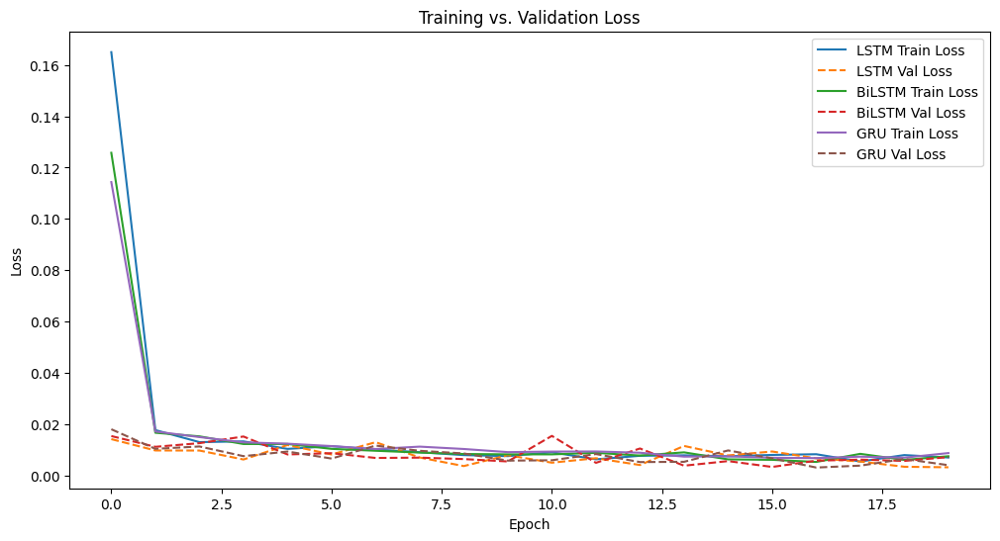

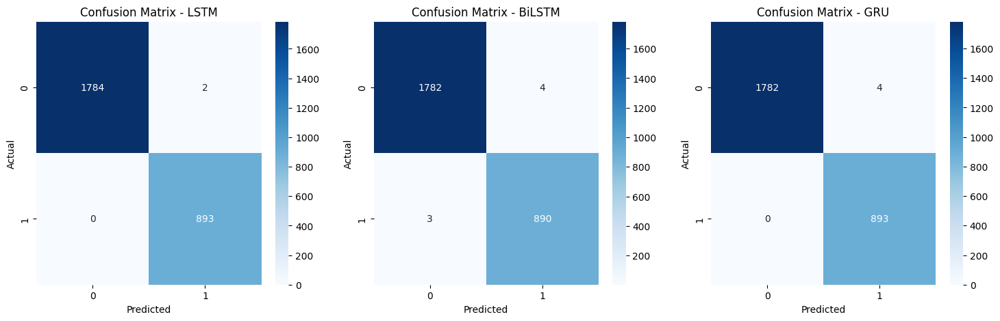

84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


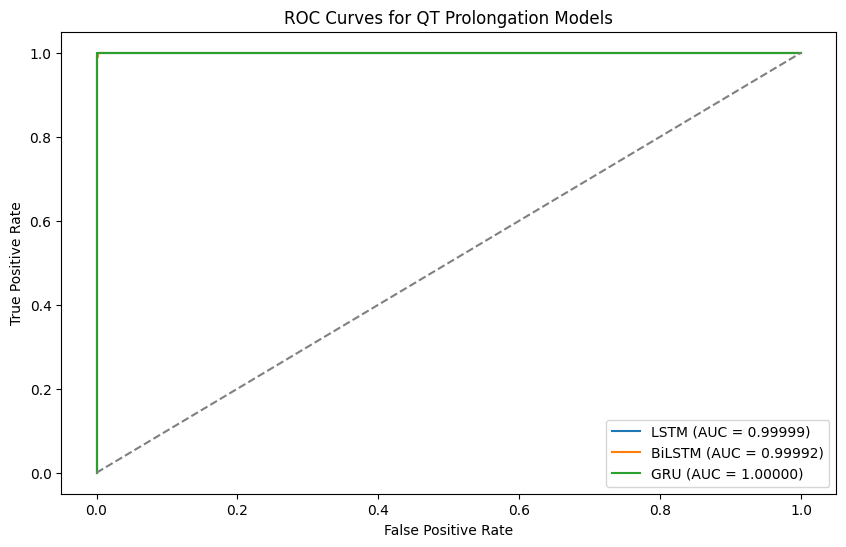

In [ ]:
# Install missing dependencies (Run this only in Google Colab)
!pip install imbalanced-learn tensorflow

# Import necessary libraries
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, roc_curve, auc
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Bidirectional, Dropout
from tensorflow.keras.optimizers import Adam

# --- Load Dataset ---
file_path = "/content/Merged dataset Sara.csv"  # Update with actual upload path
df = pd.read_csv(file_path)

# --- Data Preprocessing ---
features = ['Age', 'Height', 'Weight', 'SYSBP', 'DIABP', 'Dosage(mg)', 'RR', 'PR', 'QT', 'QRS', 'JTPEAK', 'TPEAKTEND']

# Define QT prolongation based on clinical thresholds
df['QT_Prolonged'] = ((df['Sex'] == 'M') & (df['QT'] >= 450)) | ((df['Sex'] == 'F') & (df['QT'] >= 460))
df['QT_Prolonged'] = df['QT_Prolonged'].astype(int)

# Drop missing values
df_clean = df[features + ['QT_Prolonged']].dropna()

# Split features and target
X = df_clean[features].values
y = df_clean['QT_Prolonged'].values

# --- Handle Class Imbalance using SMOTE ---
smote = SMOTE(sampling_strategy=0.5, random_state=42)  # Balance to 50%
X_resampled, y_resampled = smote.fit_resample(X, y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Reshape data for sequential models
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# --- Define Model Function ---
def build_model(model_type='LSTM', input_shape=(1, len(features))):
    model = Sequential()
    if model_type == 'LSTM':
        model.add(LSTM(64, return_sequences=True, input_shape=input_shape))
        model.add(LSTM(32))
    elif model_type == 'BiLSTM':
        model.add(Bidirectional(LSTM(64, return_sequences=True), input_shape=input_shape))
        model.add(Bidirectional(LSTM(32)))
    elif model_type == 'GRU':
        model.add(GRU(64, return_sequences=True, input_shape=input_shape))
        model.add(GRU(32))

    model.add(Dropout(0.3))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
    return model

# --- Train Models ---
models = {}
history = {}
training_times = {}
model_sizes = {}

for model_type in ['LSTM', 'BiLSTM', 'GRU']:
    print(f"Training {model_type}...")
    model = build_model(model_type)

    start_time = time.time()
    history[model_type] = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test), verbose=1)
    end_time = time.time()

    models[model_type] = model
    training_times[model_type] = round(end_time - start_time, 2)  # Training time in seconds
    model_sizes[model_type] = round(model.count_params() * 4 / (1024 * 1024), 2)  # Convert to MB (assuming float32 params)

# --- Evaluate Models ---
performance = {}
conf_matrices = {}

for model_type, model in models.items():
    y_pred_prob = model.predict(X_test)
    y_pred = (y_pred_prob > 0.5).astype(int)

    auc_score = roc_auc_score(y_test, y_pred_prob)
    report = classification_report(y_test, y_pred, output_dict=True)
    cm = confusion_matrix(y_test, y_pred)

    # Store results
    performance[model_type] = {
        "Accuracy": report['accuracy'],
        "Precision (Class 0)": report['0']['precision'],
        "Precision (Class 1)": report['1']['precision'],
        "Recall (Class 0)": report['0']['recall'],
        "Recall (Class 1)": report['1']['recall'],
        "F1-Score (Class 0)": report['0']['f1-score'],
        "F1-Score (Class 1)": report['1']['f1-score'],
        "AUC-ROC": auc_score,
        "Training Time (s)": training_times[model_type],
        "Model Size (MB)": model_sizes[model_type]
    }

    conf_matrices[model_type] = cm

# Convert results to DataFrame
performance_df = pd.DataFrame(performance).T
print("\n🔹 Full Model Performance Metrics 🔹")
print(performance_df)

# --- Visualizations ---

# Plot Loss Curve
plt.figure(figsize=(12, 6))
for model_type, hist in history.items():
    plt.plot(hist.history['loss'], label=f"{model_type} Train Loss")
    plt.plot(hist.history['val_loss'], label=f"{model_type} Val Loss", linestyle="dashed")
plt.title("Training vs. Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plot Confusion Matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, (model_type, cm) in enumerate(conf_matrices.items()):
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes[i])
    axes[i].set_title(f"Confusion Matrix - {model_type}")
    axes[i].set_xlabel("Predicted")
    axes[i].set_ylabel("Actual")
plt.show()

# Plot ROC Curves
plt.figure(figsize=(10, 6))
for model_type, model in models.items():
    y_pred_prob = model.predict(X_test)
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{model_type} (AUC = {roc_auc:.5f})")

plt.plot([0, 1], [0, 1], color='gray', linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for QT Prolongation Models")
plt.legend()
plt.show()


Training LSTM...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 7s 12ms/step - accuracy: 0.8376 - loss: 0.3742 - val_accuracy: 0.9929 - val_loss: 0.0239
Epoch 2/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.9934 - loss: 0.0218 - val_accuracy: 0.9974 - val_loss: 0.0115
Epoch 3/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.9947 - loss: 0.0184 - val_accuracy: 0.9985 - val_loss: 0.0087
Epoch 4/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.9965 - loss: 0.0122 - val_accuracy: 0.9978 - val_loss: 0.0082
Epoch 5/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9958 - loss: 0.0128 - val_accuracy: 0.9978 - val_loss: 0.0063
Epoch 6/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.9978 - val_loss: 0.0087
Epoch 7/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - accuracy: 0.9966 - loss: 0.0110 - val_accuracy: 0.9925 - val_loss: 0.0171
Epoch 8/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step - accuracy: 0.9969 - loss: 0.0110 - val_accura

/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


335/335 ━━━━━━━━━━━━━━━━━━━━ 8s 12ms/step - accuracy: 0.9173 - loss: 0.2968 - val_accuracy: 0.9951 - val_loss: 0.0118
Epoch 2/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step - accuracy: 0.9942 - loss: 0.0175 - val_accuracy: 0.9974 - val_loss: 0.0106
Epoch 3/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.9951 - loss: 0.0154 - val_accuracy: 0.9970 - val_loss: 0.0075
Epoch 4/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - accuracy: 0.9947 - loss: 0.0141 - val_accuracy: 0.9981 - val_loss: 0.0088
Epoch 5/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9953 - loss: 0.0115 - val_accuracy: 0.9978 - val_loss: 0.0082
Epoch 6/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.9975 - loss: 0.0089 - val_accuracy: 0.9966 - val_loss: 0.0077
Epoch 7/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.9974 - loss: 0.0076 - val_accuracy: 0.9974 - val_loss: 0.0091
Epoch 8/20
335/335 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.9971 - loss: 0.0079 - val_accuracy: 0.9974 

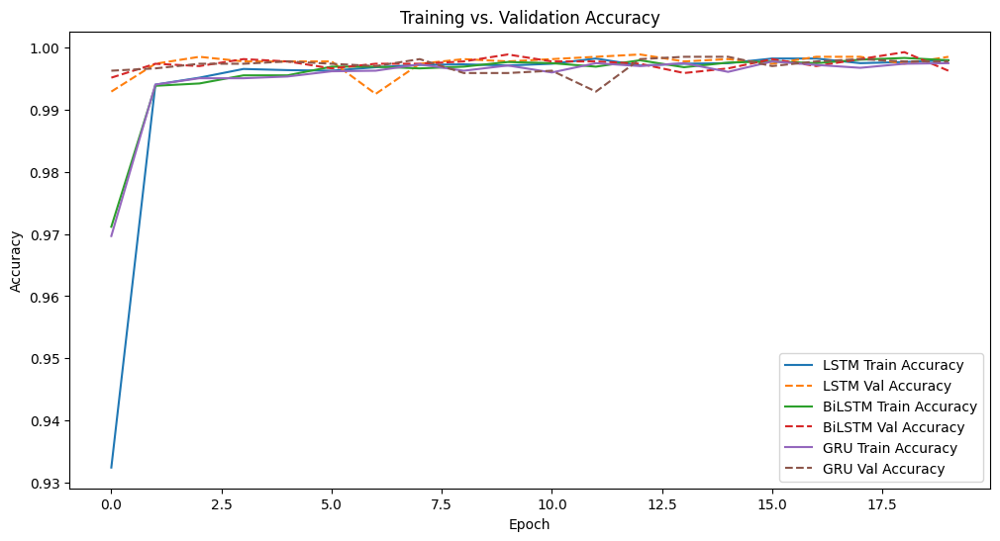

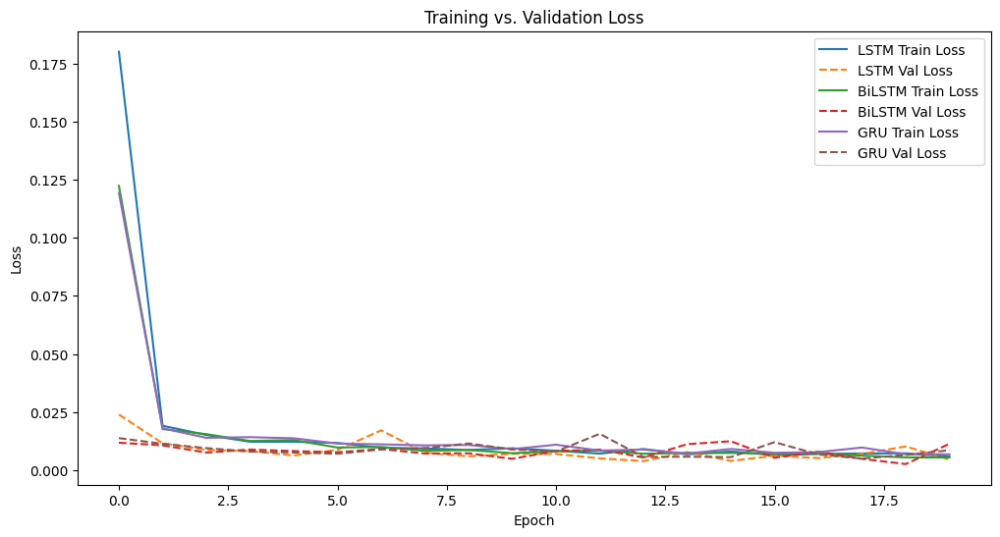

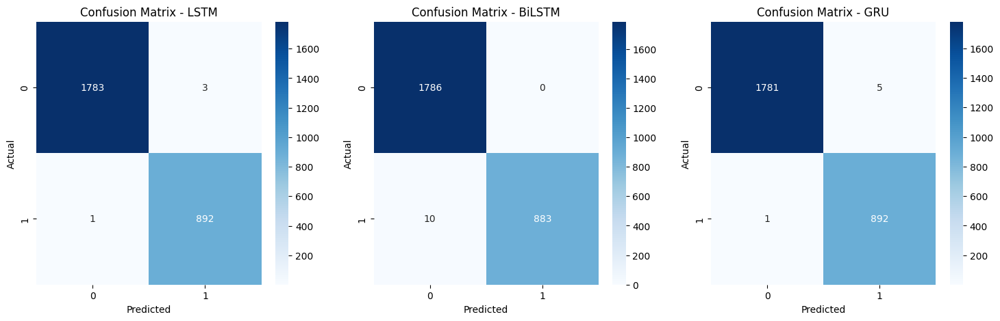

84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
84/84 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


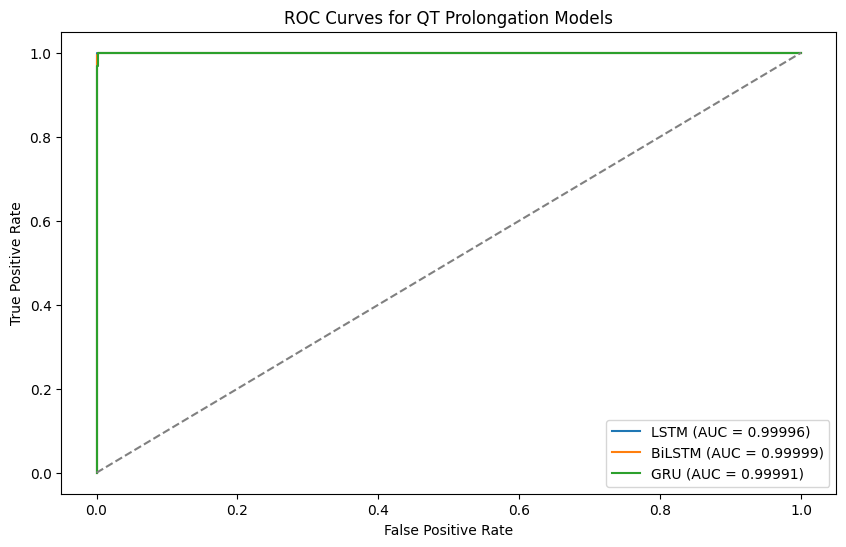

In [ ]:
# Install missing dependencies (Run this only in Google Colab)
!pip install imbalanced-learn tensorflow

# Import necessary libraries
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, roc_curve, auc
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU, Dense, Bidirectional, Dropout
from tensorflow.keras.optimizers import Adam

# --- Load Dataset ---
file_path = "/content/Merged dataset Sara.csv"  # Update with actual upload path
df = pd.read_csv(file_path)

# --- Data Preprocessing ---
features = ['Age', 'Height', 'Weight', 'SYSBP', 'DIABP', 'Dosage(mg)', 'RR', 'PR', 'QT', 'QRS', 'JTPEAK', 'TPEAKTEND']

# Define QT prolongation based on clinical thresholds
df['QT_Prolonged'] = ((df['Sex'] == 'M') & (df['QT'] >= 450)) | ((df['Sex'] == 'F') & (df['QT'] >= 460))
df['QT_Prolonged'] = df['QT_Prolonged'].astype(int)

# Drop missing values
df_clean = df[features + ['QT_Prolonged']].dropna()

# Split features and target
X = df_clean[features].values
y = df_clean['QT_Prolonged'].values

# --- Handle Class Imbalance using SMOTE ---
smote = SMOTE(sampling_strategy=0.5, random_state=42)  # Balance to 50%
X_resampled, y_resampled = smote.fit_resample(X, y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled)

# Standardize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Reshape data for sequential models
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# --- Define Model Function ---
def build_model(model_type='LSTM', input_shape=(1, len(features))):
    model = Sequential()
    if model_type == 'LSTM':
        model.add(LSTM(64, return_sequences=True, input_shape=input_shape))
        model.add(LSTM(32))
    elif model_type == 'BiLSTM':
        model.add(Bidirectional(LSTM(64, return_sequences=True), input_shape=input_shape))
        model.add(Bidirectional(LSTM(32)))
    elif model_type == 'GRU':
        model.add(GRU(64, return_sequences=True, input_shape=input_shape))
        model.add(GRU(32))

    model.add(Dropout(0.3))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))

    model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])
    return model

# --- Train Models ---
models = {}
history = {}
training_times = {}
model_sizes = {}

for model_type in ['LSTM', 'BiLSTM', 'GRU']:
    print(f"Training {model_type}...")
    model = build_model(model_type)

    start_time = time.time()
    history[model_type] = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test), verbose=1)
    end_time = time.time()

    models[model_type] = model
    training_times[model_type] = round(end_time - start_time, 2)  # Training time in seconds
    model_sizes[model_type] = round(model.count_params() * 4 / (1024 * 1024), 2)  # Convert to MB (assuming float32 params)

# --- Evaluate Models ---
performance = {}
conf_matrices = {}

for model_type, model in models.items():
    y_pred_prob = model.predict(X_test)
    y_pred = (y_pred_prob > 0.5).astype(int)

    auc_score = roc_auc_score(y_test, y_pred_prob)
    report = classification_report(y_test, y_pred, output_dict=True)
    cm = confusion_matrix(y_test, y_pred)

    # Store results
    performance[model_type] = {
        "Accuracy": report['accuracy'],
        "Precision (Class 0)": report['0']['precision'],
        "Precision (Class 1)": report['1']['precision'],
        "Recall (Class 0)": report['0']['recall'],
        "Recall (Class 1)": report['1']['recall'],
        "F1-Score (Class 0)": report['0']['f1-score'],
        "F1-Score (Class 1)": report['1']['f1-score'],
        "AUC-ROC": auc_score,
        "Training Time (s)": training_times[model_type],
        "Model Size (MB)": model_sizes[model_type]
    }

    conf_matrices[model_type] = cm

# Convert results to DataFrame
performance_df = pd.DataFrame(performance).T
print("\n🔹 Full Model Performance Metrics 🔹")
print(performance_df)

# --- Visualizations ---

# Plot Accuracy Curve
plt.figure(figsize=(12, 6))
for model_type, hist in history.items():
    plt.plot(hist.history['accuracy'], label=f"{model_type} Train Accuracy")
    plt.plot(hist.history['val_accuracy'], label=f"{model_type} Val Accuracy", linestyle="dashed")
plt.title("Training vs. Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

# Plot Loss Curve
plt.figure(figsize=(12, 6))
for model_type, hist in history.items():
    plt.plot(hist.history['loss'], label=f"{model_type} Train Loss")
    plt.plot(hist.history['val_loss'], label=f"{model_type} Val Loss", linestyle="dashed")
plt.title("Training vs. Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plot Confusion Matrices
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, (model_type, cm) in enumerate(conf_matrices.items()):
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", ax=axes[i])
    axes[i].set_title(f"Confusion Matrix - {model_type}")
    axes[i].set_xlabel("Predicted")
    axes[i].set_ylabel("Actual")
plt.show()

# Plot ROC Curves
plt.figure(figsize=(10, 6))
for model_type, model in models.items():
    y_pred_prob = model.predict(X_test)
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"{model_type} (AUC = {roc_auc:.5f})")

plt.plot([0, 1], [0, 1], color='gray', linestyle="--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for QT Prolongation Models")
plt.legend()
plt.show()


Computing SHAP values for LSTM...
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step 


  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
313/313 ━━━━━━

  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
313/313 ━━━━━━

  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
313/313 ━━━━━━

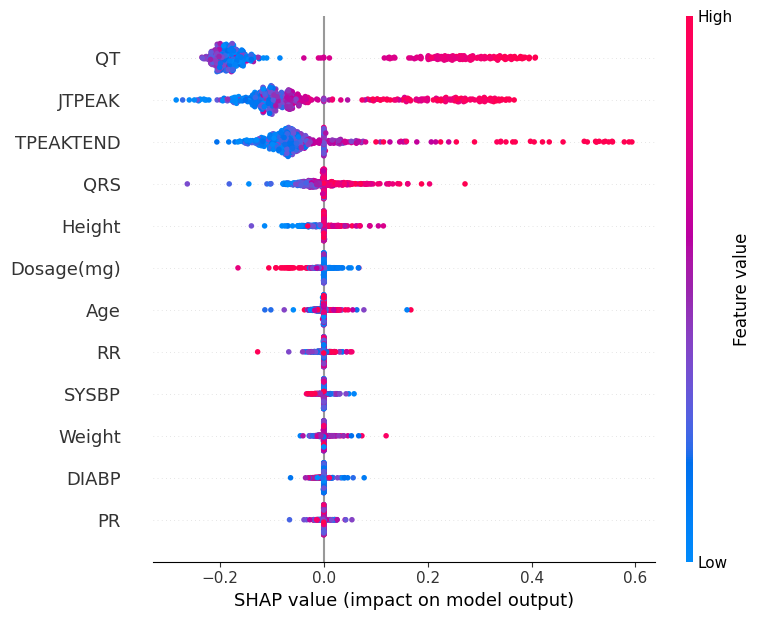

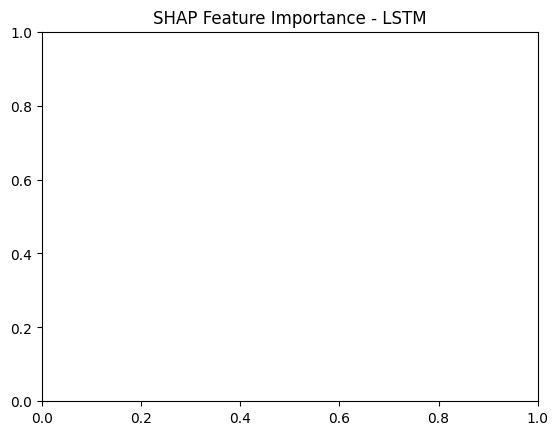

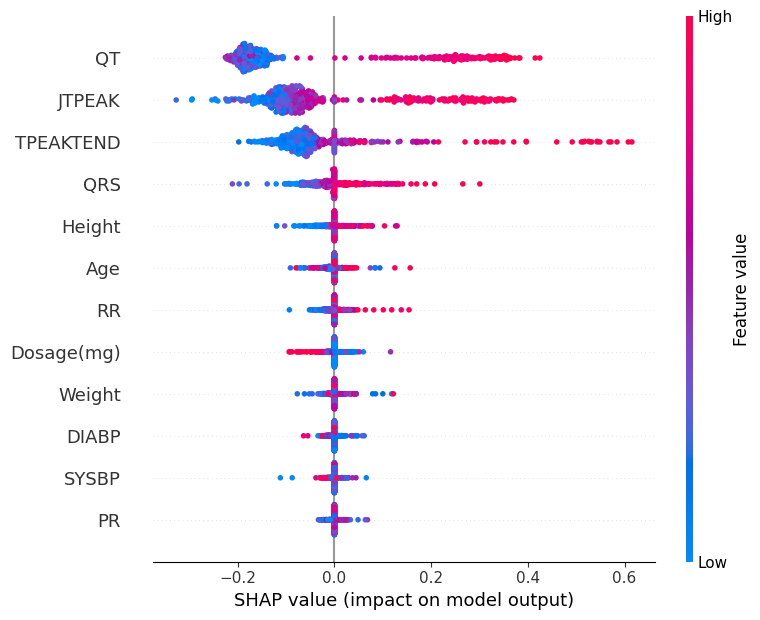

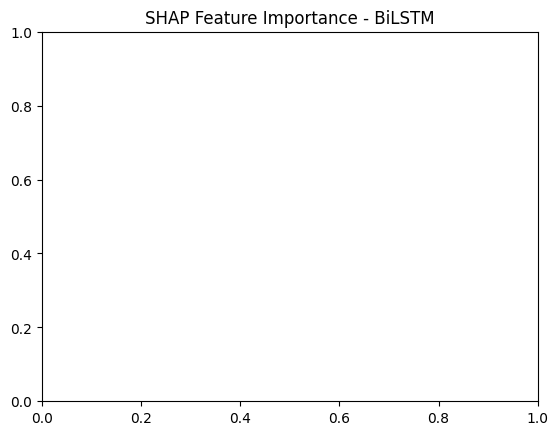

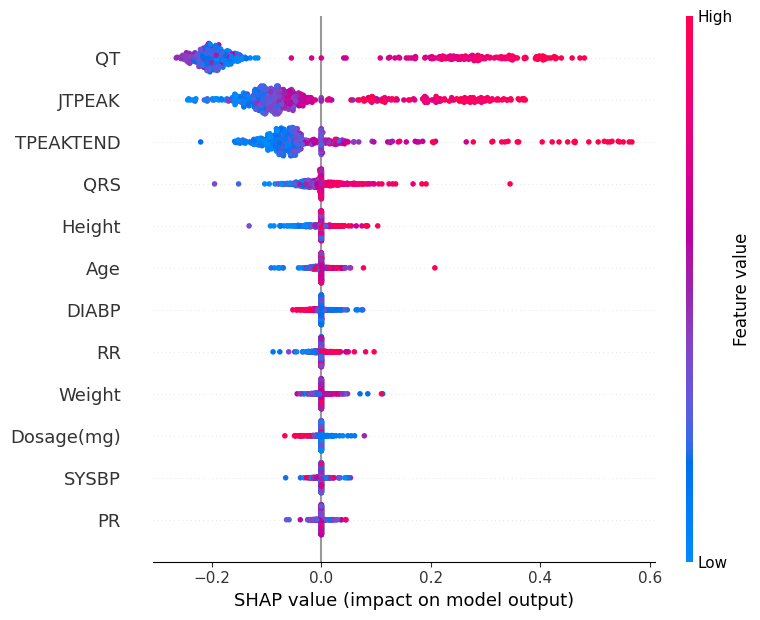

...

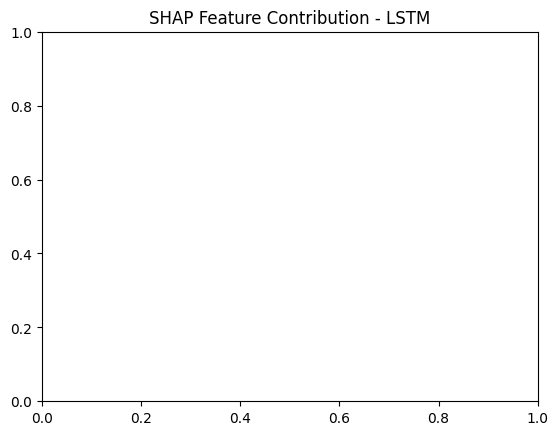

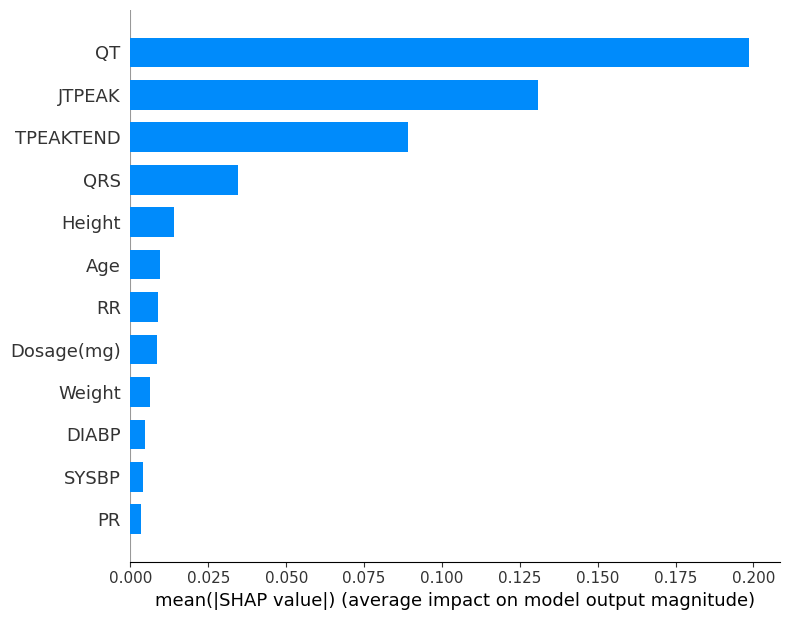

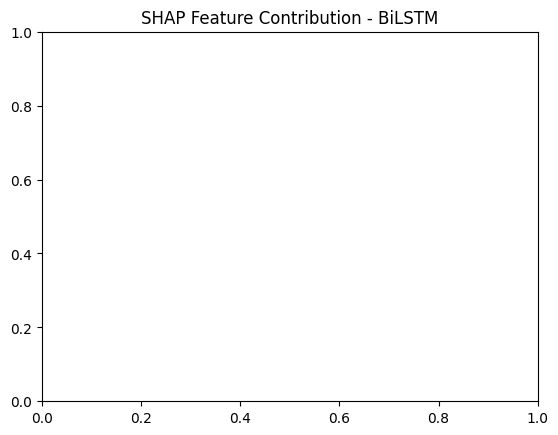

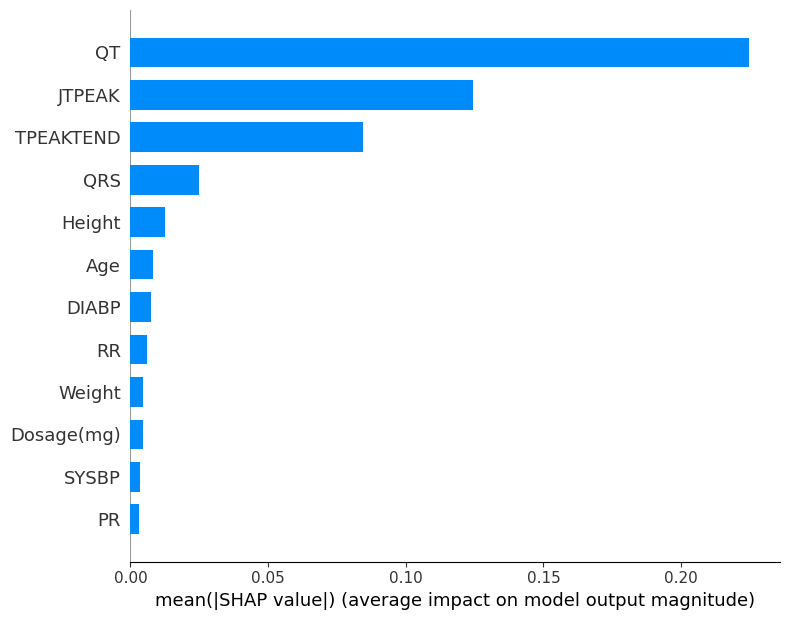

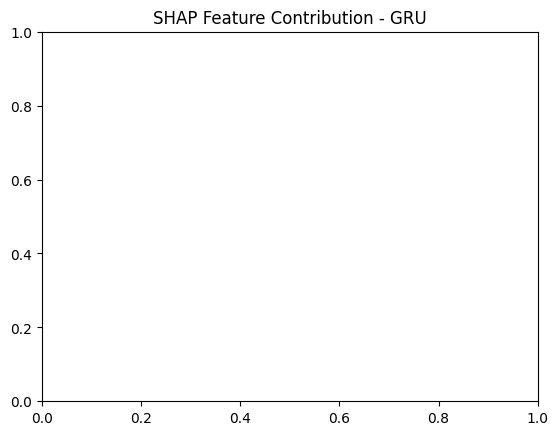

<Figure size 800x500 with 0 Axes>

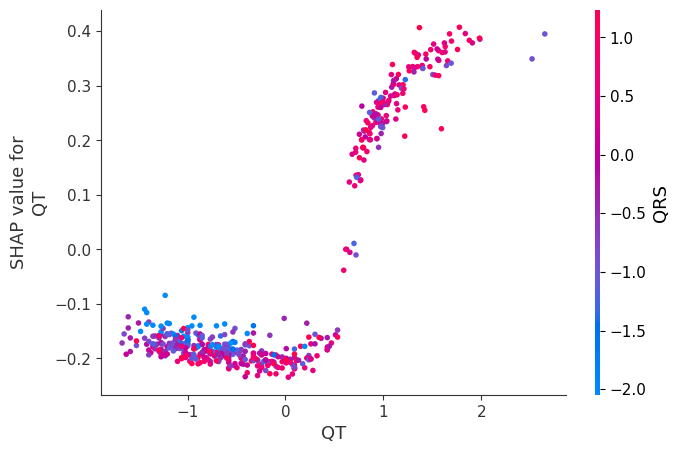

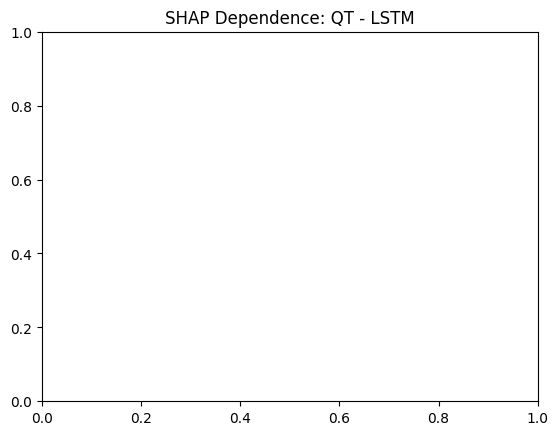

<Figure size 800x500 with 0 Axes>

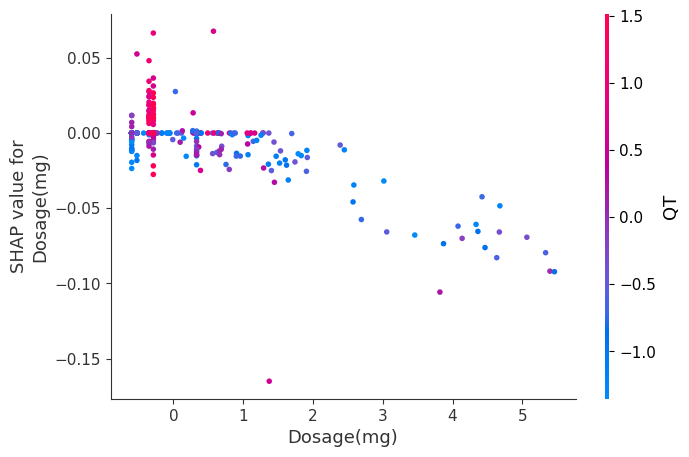

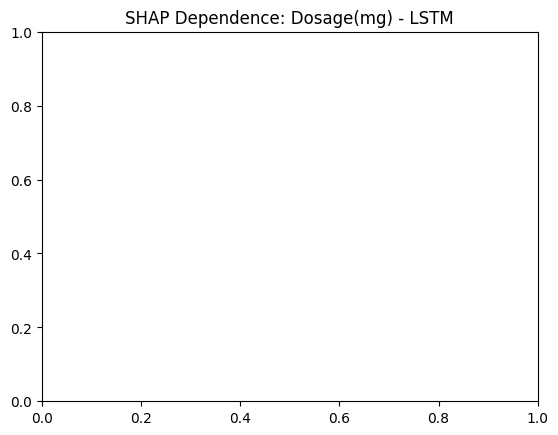

<Figure size 800x500 with 0 Axes>

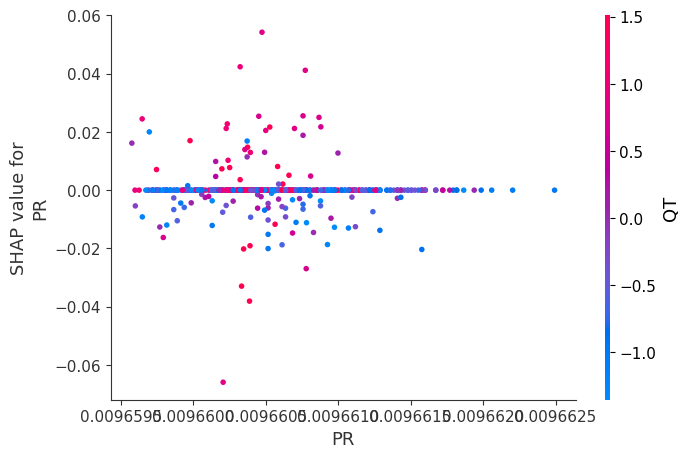

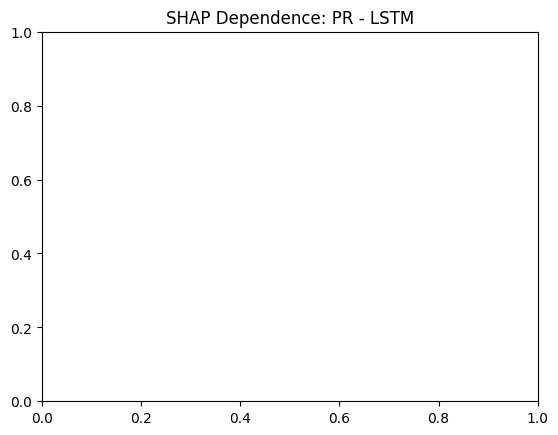

<Figure size 800x500 with 0 Axes>

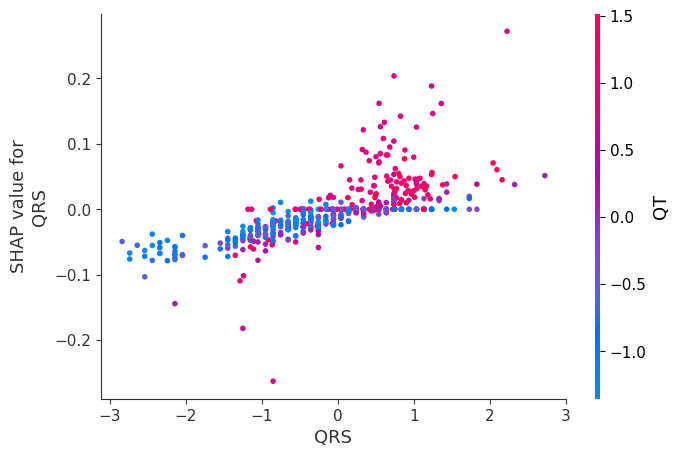

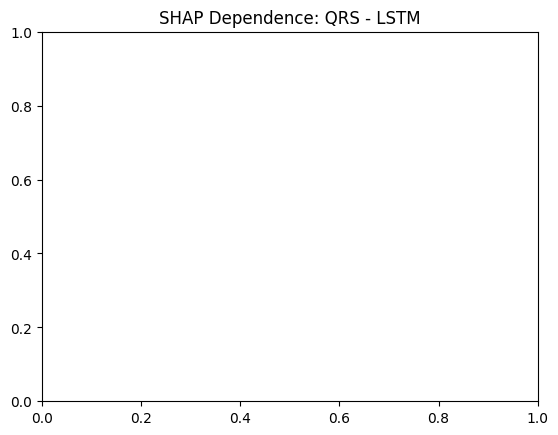

<Figure size 800x500 with 0 Axes>

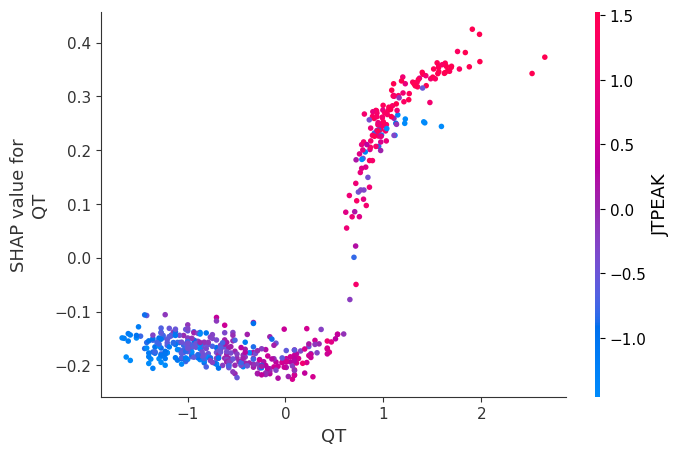

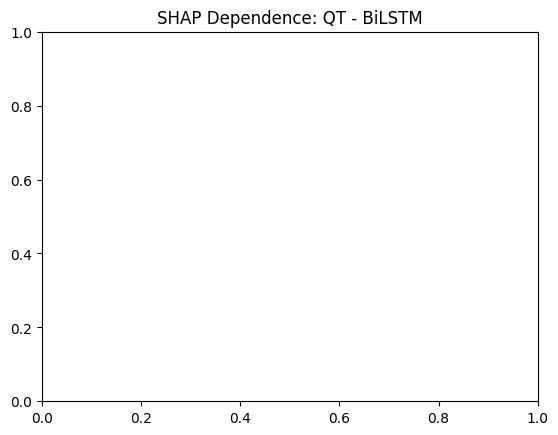

<Figure size 800x500 with 0 Axes>

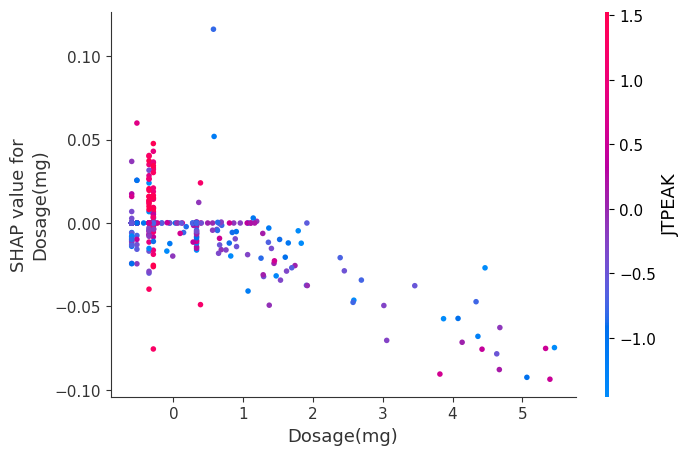

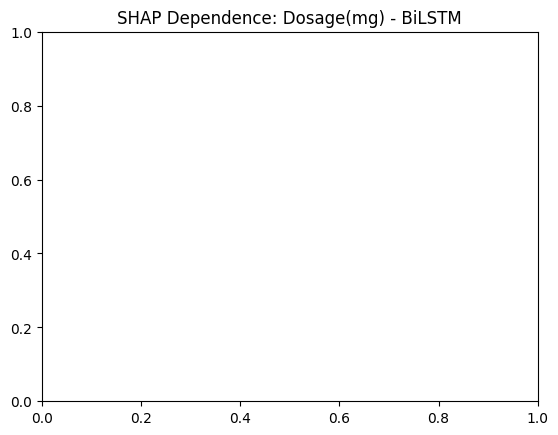

<Figure size 800x500 with 0 Axes>

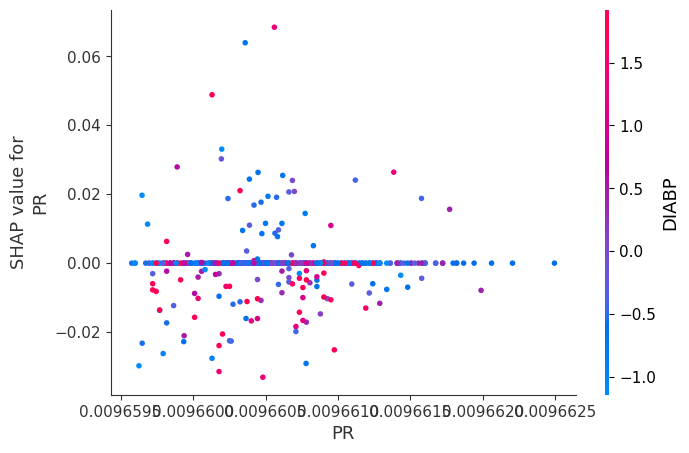

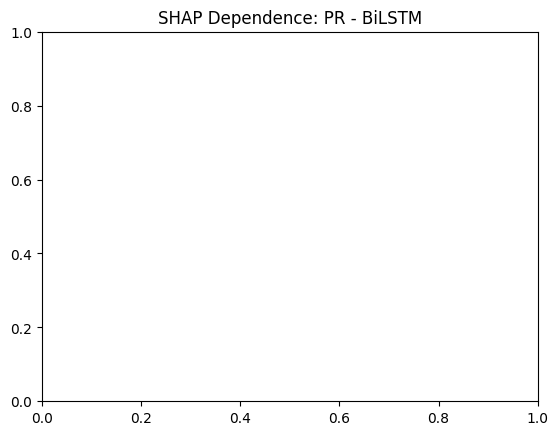

<Figure size 800x500 with 0 Axes>

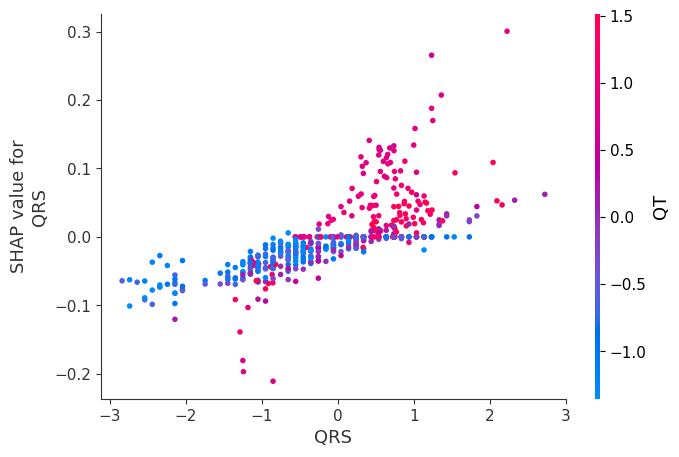

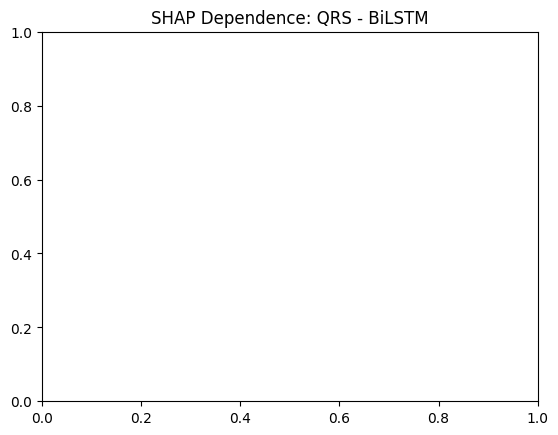

<Figure size 800x500 with 0 Axes>

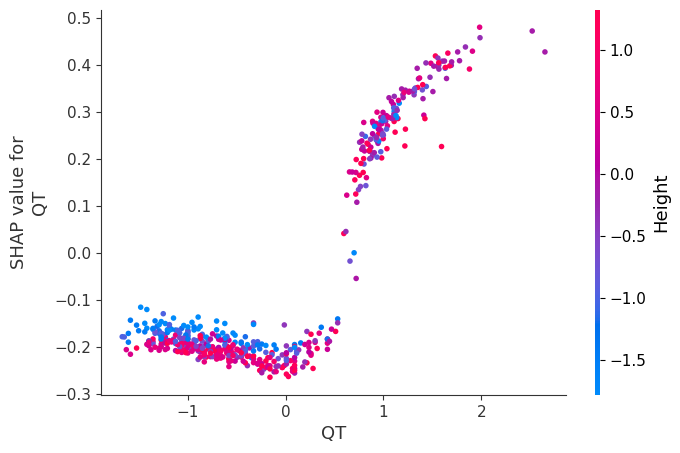

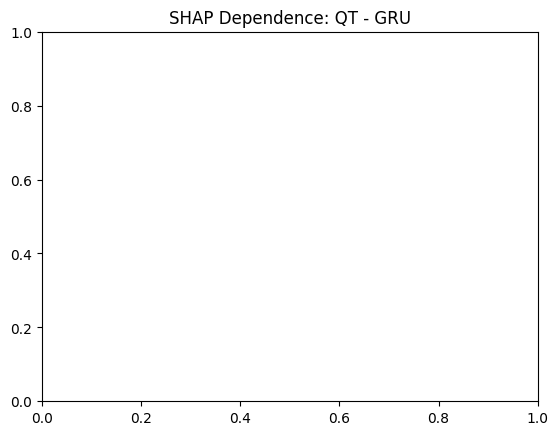

<Figure size 800x500 with 0 Axes>

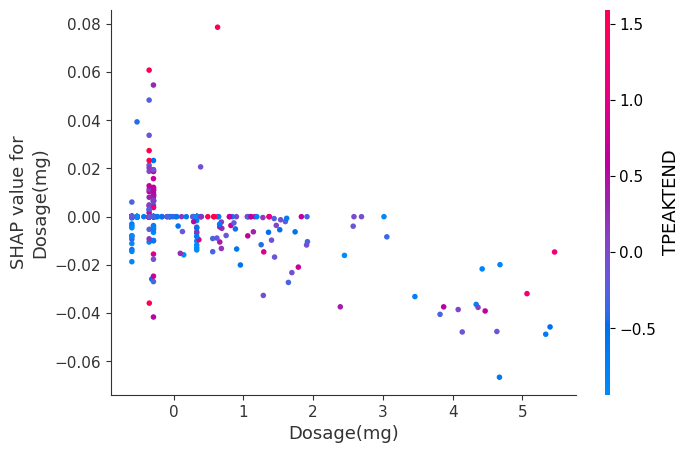

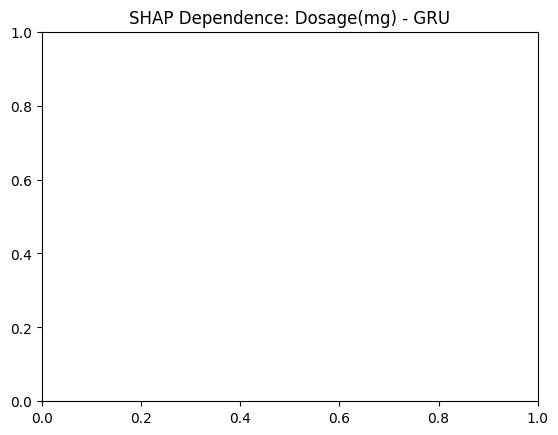

<Figure size 800x500 with 0 Axes>

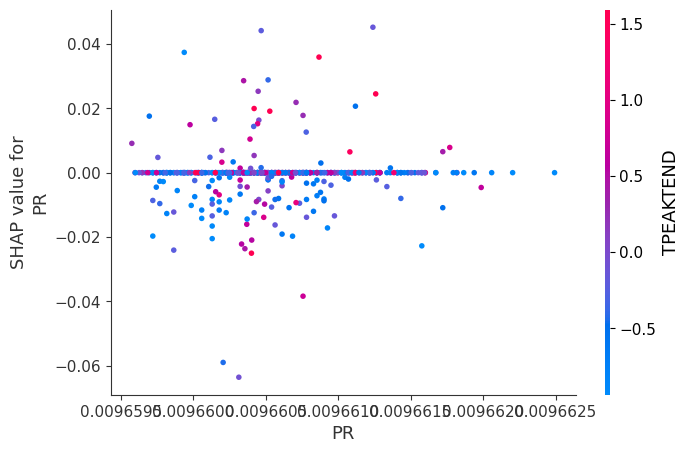

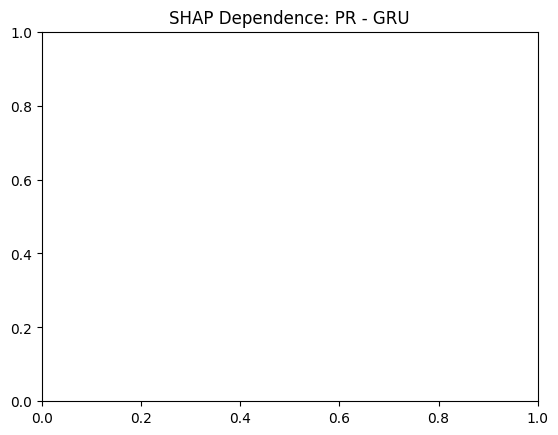

<Figure size 800x500 with 0 Axes>

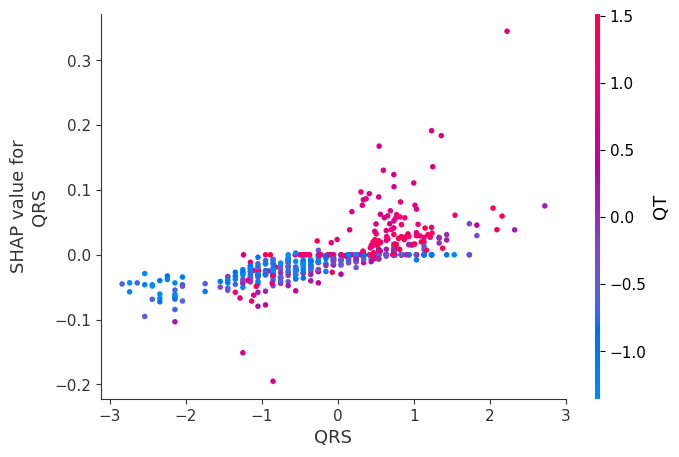

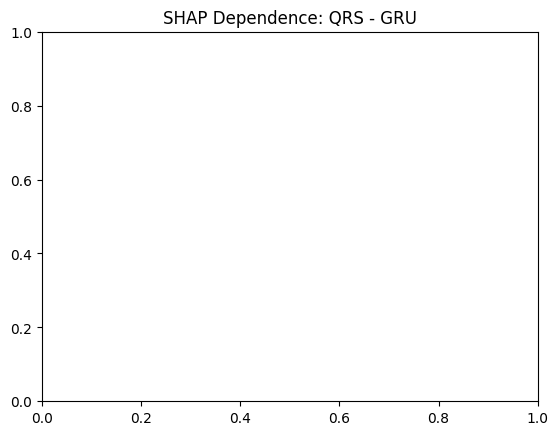

In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# --- Reshape Data for SHAP ---
X_train_2D = X_train.reshape(X_train.shape[0], X_train.shape[2])  # Convert 3D to 2D
X_test_2D = X_test.reshape(X_test.shape[0], X_test.shape[2])

# Define a model prediction function for KernelExplainer (adjusted for LSTMs/GRUs)
def model_function(model, data):
    return model.predict(data.reshape((data.shape[0], 1, data.shape[1]))).flatten()

# Create SHAP KernelExplainer for Each Model
shap_explainers = {}
shap_values = {}

# Reduce dataset size to speed up SHAP calculations
background = X_train_2D[:100]  # Use first 100 samples as background data
X_test_sample = X_test_2D[:500]  # Use first 500 test samples

for model_type, model in models.items():
    print(f"Computing SHAP values for {model_type}...")

    explainer = shap.KernelExplainer(lambda x: model_function(model, x), background)
    shap_values[model_type] = explainer.shap_values(X_test_sample, nsamples=100)  # Adjust nsamples for speed
    shap_explainers[model_type] = explainer

# --- SHAP Summary Plot ---
for model_type in ['LSTM', 'BiLSTM', 'GRU']:
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values[model_type], X_test_sample, feature_names=features)
    plt.title(f"SHAP Feature Importance - {model_type}")
    plt.show()

# --- SHAP Bar Plot ---
for model_type in ['LSTM', 'BiLSTM', 'GRU']:
    plt.figure(figsize=(10, 6))
    shap.summary_plot(shap_values[model_type], X_test_sample, feature_names=features, plot_type="bar")
    plt.title(f"SHAP Feature Contribution - {model_type}")
    plt.show()

# --- SHAP Dependence Plots (for key features) ---
top_features = ['QT', 'Dosage(mg)', 'PR', 'QRS']  # Choose based on summary plot

for model_type in ['LSTM', 'BiLSTM', 'GRU']:
    for feature in top_features:
        plt.figure(figsize=(8, 5))
        shap.dependence_plot(feature, shap_values[model_type], X_test_sample, feature_names=features)
        plt.title(f"SHAP Dependence: {feature} - {model_type}")
        plt.show()


In [ ]:
!pip install pytorch-tabular pytorch-lightning --quiet


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 7.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.8/163.8 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.5/44.5 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 34.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.6/44.6 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 72.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 51.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 842.2 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00


In [ ]:
!pip install torch torchvision torchaudio --quiet


In [ ]:
device = torch.device("cpu")
model.to(device)


TransformerQT(
  (embedding): Linear(in_features=8, out_features=64, bias=True)
  (transformer): TransformerEncoder(
    (layers): ModuleList(
      (0-1): 2 x TransformerEncoderLayer(
        (self_attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=64, out_features=64, bias=True)
        )
        (linear1): Linear(in_features=64, out_features=2048, bias=True)
        (dropout): Dropout(p=0.1, inplace=False)
        (linear2): Linear(in_features=2048, out_features=64, bias=True)
        (norm1): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        (norm2): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        (dropout1): Dropout(p=0.1, inplace=False)
        (dropout2): Dropout(p=0.1, inplace=False)
      )
    )
  )
  (fc): Linear(in_features=64, out_features=1, bias=True)
  (sigmoid): Sigmoid()
)

Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 21s 68ms/step - accuracy: 0.8132 - loss: 0.3956 - val_accuracy: 0.9517 - val_loss: 0.1189
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.9538 - loss: 0.1186 - val_accuracy: 0.9698 - val_loss: 0.0823
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.9704 - loss: 0.0751 - val_accuracy: 0.9712 - val_loss: 0.0748
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9702 - loss: 0.0734 - val_accuracy: 0.9698 - val_loss: 0.0699
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9738 - loss: 0.0608 - val_accuracy: 0.9779 - val_loss: 0.0529
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9784 - loss: 0.0560 - val_accuracy: 0.9819 - val_loss: 0.0478
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9801 - loss: 0.0527 - val_accuracy: 0.9792 - val_loss: 0.0477
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9773 - loss: 0.0588 - val_accuracy: 0.9832 - val_los

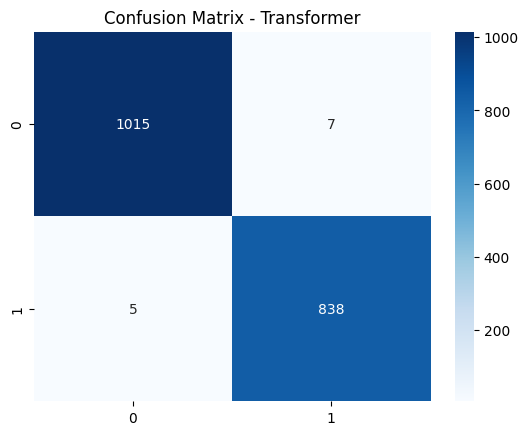

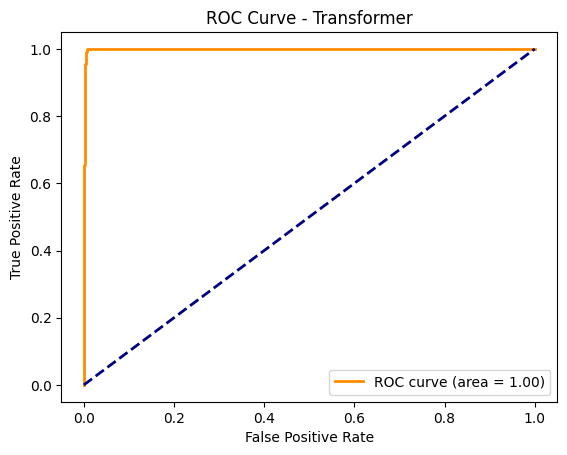

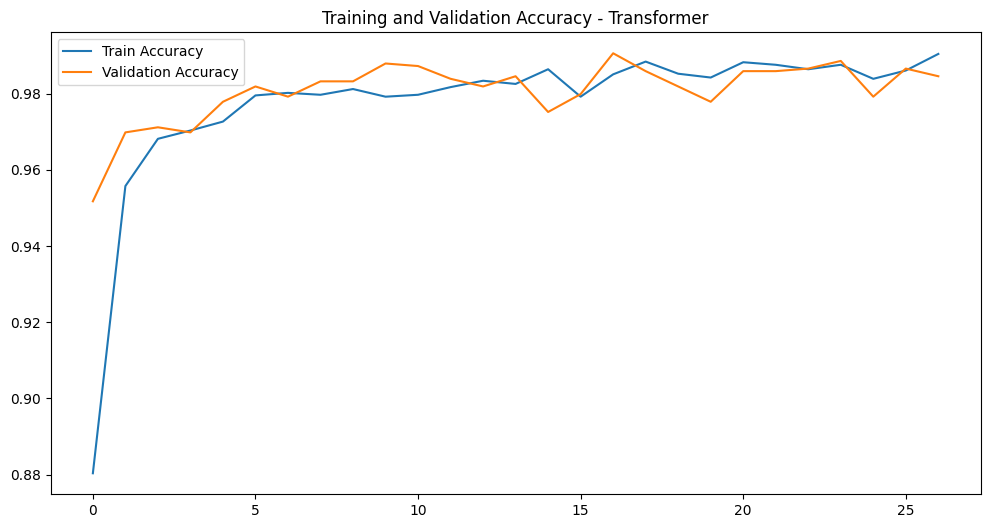

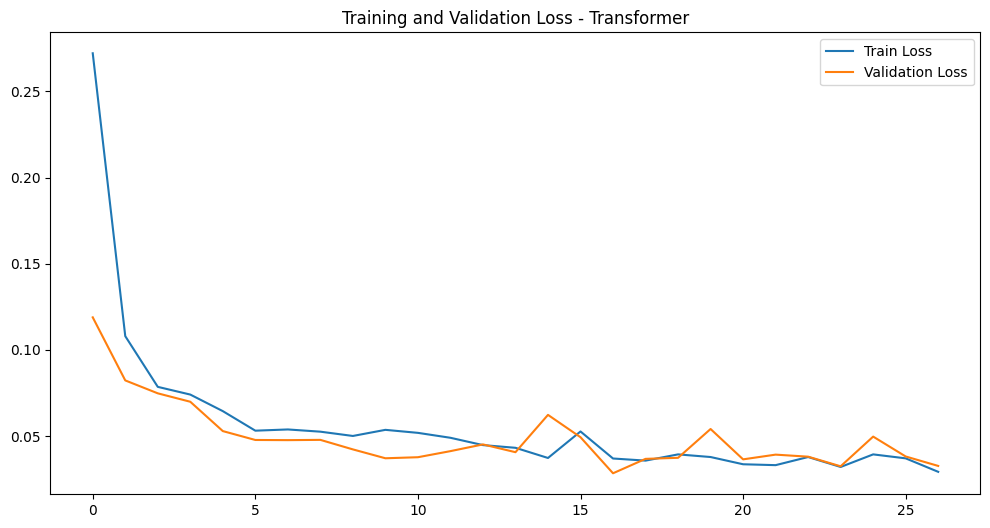

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, MultiHeadAttention, LayerNormalization, Input, Reshape, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# Create results directory
results_dir = "results/Transformer_Final"
os.makedirs(results_dir, exist_ok=True)

# Load dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Handle missing values
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

# Fill missing numerical values
data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())

# Fill missing categorical values
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

# Encode categorical variables
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Define target column
target_column = "QT"
X = data.drop(columns=[target_column])
y = data[target_column]

# Normalize features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Binarize target based on a threshold
threshold = y.mean()
y = (y > threshold).astype(int)

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define Transformer model
def build_transformer(input_shape):
    inputs = Input(shape=input_shape)
    x = Reshape((1, input_shape[0]))(inputs)  # Add sequence length of 1
    x = MultiHeadAttention(num_heads=4, key_dim=64)(x, x)
    x = LayerNormalization()(x)
    x = Flatten()(x)  # Flatten back to 2D
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

# Compile model
model = build_transformer((X_train.shape[1],))
model.compile(optimizer=Adam(learning_rate=0.0005), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model with early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
history = model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=50,
    batch_size=64,
    verbose=1,
    callbacks=[early_stopping]
)

# Predictions
y_pred_prob = model.predict(X_test).flatten()
y_pred = (y_pred_prob > 0.5).astype(int)

# Classification report
classification_report_dict = classification_report(y_test, y_pred, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
classification_report_df.to_csv(f"{results_dir}/classification_report.csv", index=True)
print(f"\nTransformer Classification Report:\n")
print(classification_report_df)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure()
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Transformer")
plt.savefig(f"{results_dir}/confusion_matrix.png")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Transformer')
plt.legend(loc="lower right")
plt.savefig(f"{results_dir}/roc_curve.png")
plt.show()

# Accuracy and Loss Plots
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy - Transformer')
plt.legend()
plt.savefig(f"{results_dir}/accuracy_plot.png")
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss - Transformer')
plt.legend()
plt.savefig(f"{results_dir}/loss_plot.png")
plt.show()

# Save the model
model.save(f"{results_dir}/transformer_model.h5")


<ipython-input-9-f5dc295a5a46>:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data[col].fillna(data[col].mode()[0], inplace=True)
PermutationExplainer explainer: 1866it [04:23,  6.89it/s]


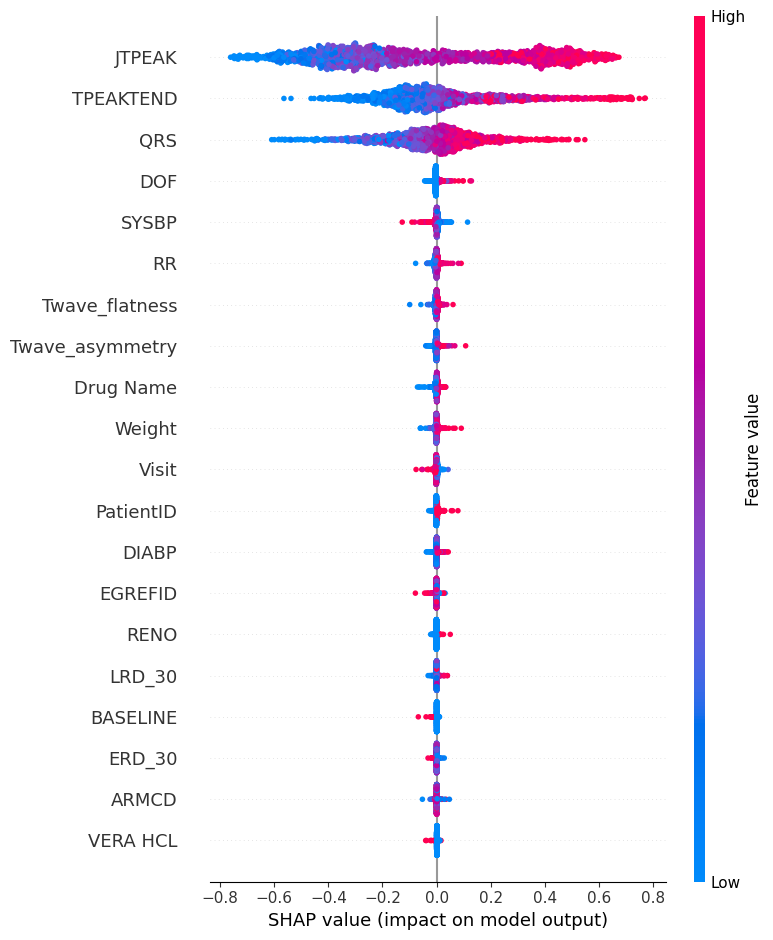

<Figure size 800x500 with 0 Axes>

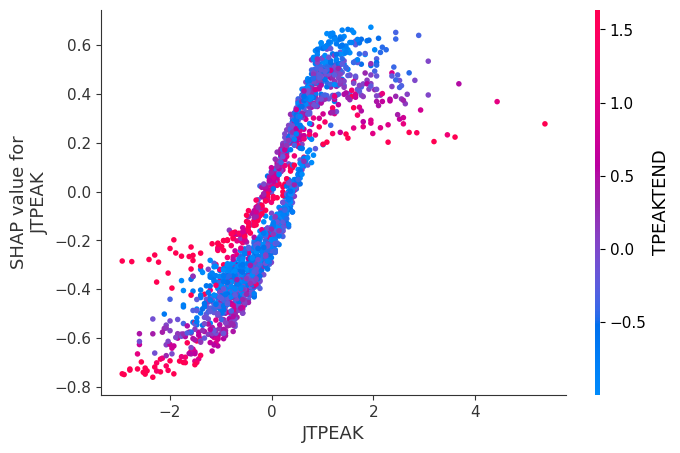

<Figure size 800x500 with 0 Axes>

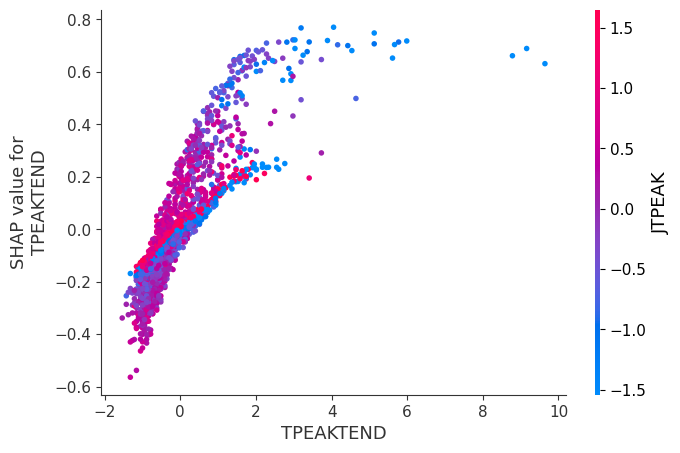

<Figure size 800x500 with 0 Axes>

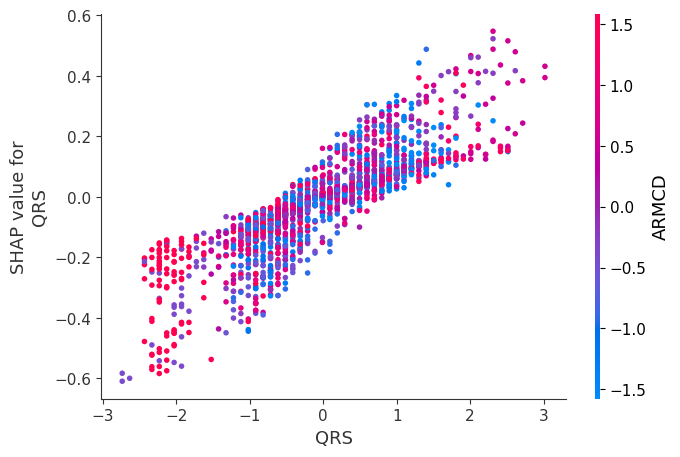

✅ SHAP Analysis Completed - All visualizations generated and saved.


In [ ]:
import shap
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import load_model

# Load the trained Transformer model
model = load_model("results/Transformer_Final/transformer_model.h5")

# Load the dataset again to ensure feature names are available
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Select numerical and categorical columns
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

# Handle missing values
data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col].fillna(data[col].mode()[0], inplace=True)

# Encode categorical variables
from sklearn.preprocessing import LabelEncoder, StandardScaler

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Define the target column
target_column = "QT"
X = data.drop(columns=[target_column])
y = data[target_column]

# Normalize feature values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Convert back to DataFrame to retain feature names
X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)

# Split dataset
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled_df, y, test_size=0.2, random_state=42)

# Initialize the SHAP Explainer
explainer = shap.Explainer(model, X_train)

# Compute SHAP values
shap_values = explainer(X_test)

# Retrieve actual feature names
feature_names = list(X.columns)

# Convert SHAP values to DataFrame with correct column names
shap_df = pd.DataFrame(shap_values.values, columns=feature_names)

# === Visualization 1: SHAP Summary Plot (Beeswarm) ===
plt.figure(figsize=(10, 7))
shap.summary_plot(shap_values, X_test, feature_names=feature_names, show=True)
plt.savefig("shap_summary_transformer.png", bbox_inches='tight')
plt.close()

# === Visualization 2: SHAP Feature Importance (Bar Chart) ===
plt.figure(figsize=(10, 6))
shap.importance_plot = shap_df.abs().mean().sort_values(ascending=False)
shap.importance_plot.plot(kind="bar", color="royalblue")
plt.title("SHAP Feature Importance - Transformer")
plt.xlabel("Feature")
plt.ylabel("Mean Absolute SHAP Value")
plt.xticks(rotation=75)
plt.grid(axis='y', linestyle='--')
plt.savefig("shap_bar_chart_transformer.png", bbox_inches='tight')
plt.close()

# === Visualization 3: SHAP Dependence Plots ===
top_features = shap_df.abs().mean().sort_values(ascending=False).index[:3]  # Select top 3 features
for feature in top_features:
    plt.figure(figsize=(8, 5))
    shap.dependence_plot(feature, shap_values.values, X_test, feature_names=feature_names, show=True)
    plt.title(f"SHAP Dependence Plot - {feature}")
    plt.savefig(f"shap_dependence_{feature}.png", bbox_inches='tight')
    plt.close()

# === Visualization 4: SHAP Heatmap ===
plt.figure(figsize=(12, 8))
shap_values_matrix = np.array(shap_values.values)
shap_abs_mean = np.abs(shap_values_matrix).mean(axis=0)
sorted_idx = np.argsort(shap_abs_mean)[::-1]  # Sort features by importance

# Generate heatmap
plt.imshow(shap_values_matrix[:, sorted_idx].T, aspect="auto", cmap="coolwarm")
plt.colorbar(label="SHAP Value Impact")
plt.yticks(range(len(feature_names)), np.array(feature_names)[sorted_idx])
plt.xlabel("Samples")
plt.ylabel("Feature")
plt.title("SHAP Heatmap - Transformer")
plt.savefig("shap_heatmap_transformer.png", bbox_inches='tight')
plt.close()

print("✅ SHAP Analysis Completed - All visualizations generated and saved.")


In [ ]:
import shap
import numpy as np
import matplotlib.pyplot as plt

# --- Convert DataFrames to NumPy Arrays (Fix for `.reshape()`) ---
X_train_np = X_train.to_numpy()
X_test_np = X_test.to_numpy()

# --- Reshape Data for SHAP ---
X_train_2D = X_train_np.reshape(X_train_np.shape[0], -1)  # Convert to 2D
X_test_2D = X_test_np.reshape(X_test_np.shape[0], -1)

# Define a model prediction function for SHAP KernelExplainer (adjusted for Transformer)
def model_function(model, data):
    return model.predict(data).flatten()  # Ensure proper output format

# Reduce dataset size to speed up SHAP calculations
background = X_train_2D[:100]  # Use first 100 samples as background data
X_test_sample = X_test_2D[:500]  # Use first 500 test samples

# --- Compute SHAP Values ---
print("Computing SHAP values for Transformer...")
explainer = shap.KernelExplainer(lambda x: model_function(model, x), background)
shap_values = explainer.shap_values(X_test_sample, nsamples=100)  # Adjust for performance

# --- SHAP Summary Plot (BeeSwarm) ---
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test_sample, feature_names=numerical_cols)
plt.title("SHAP Feature Importance - Transformer")
plt.show()

# --- SHAP Bar Chart ---
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test_sample, feature_names=numerical_cols, plot_type="bar")
plt.title("SHAP Feature Contribution - Transformer")
plt.show()

# --- SHAP Dependence Plots (for key features) ---
top_features = ['QT', 'Dosage(mg)', 'PR', 'QRS']  # Adjust based on dataset

for feature in top_features:
    plt.figure(figsize=(8, 5))
    shap.dependence_plot(feature, shap_values, X_test_sample, feature_names=numerical_cols)
    plt.title(f"SHAP Dependence: {feature} - Transformer")
    plt.show()


AttributeError: 'numpy.ndarray' object has no attribute 'to_numpy'

4/4 ━━━━━━━━━━━━━━━━━━━━ 3s 803ms/step


  0%|          | 0/500 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 734ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
313/313

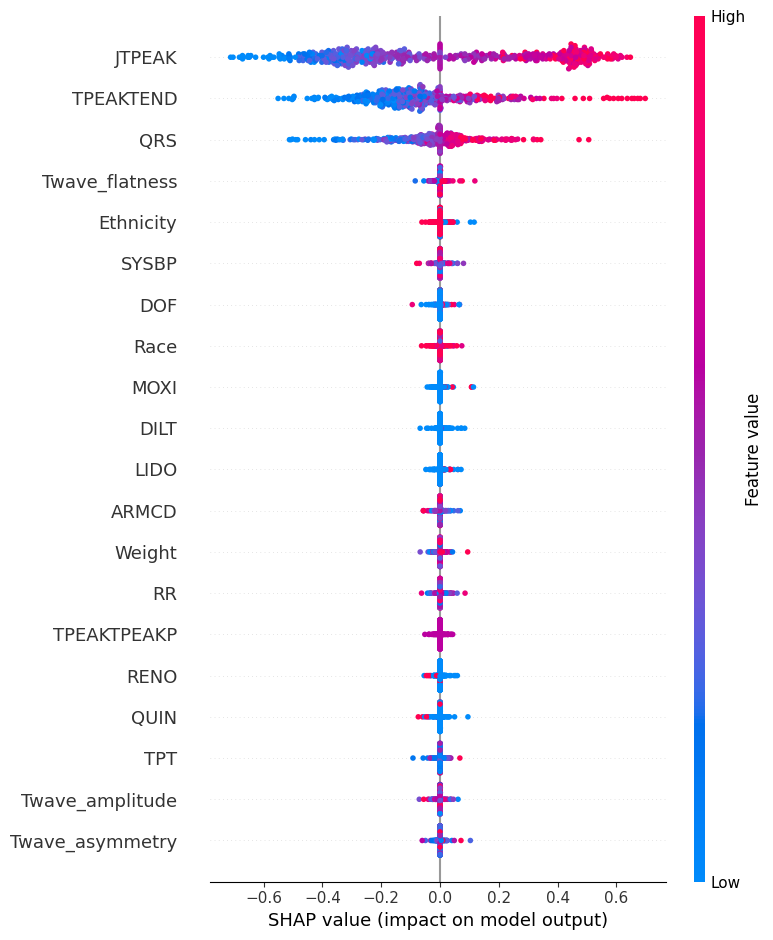

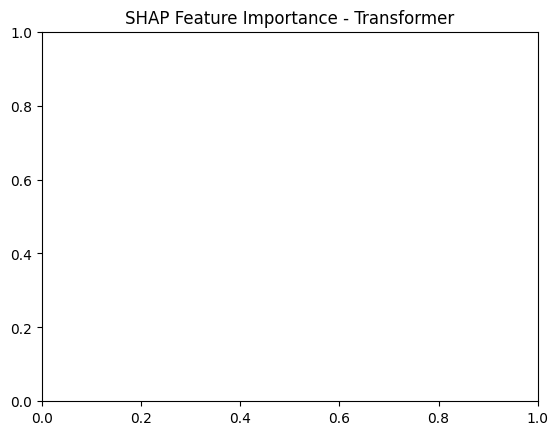

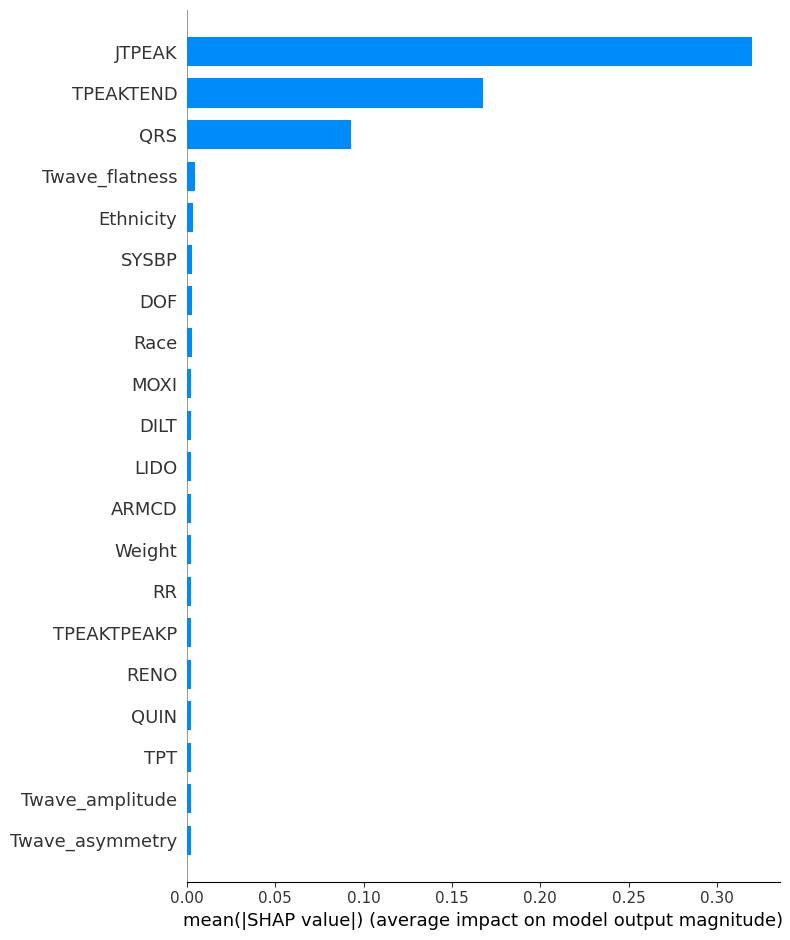

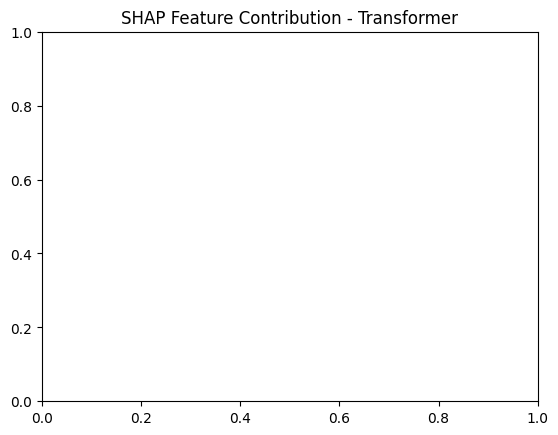

ValueError: Could not find feature named: QT

<Figure size 800x500 with 0 Axes>

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split

# Load the dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Preprocessing
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

target_column = "QT"
X = data.drop(columns=[target_column])
y = data[target_column]

scaler = StandardScaler()
X = scaler.fit_transform(X)

threshold = y.mean()
y = (y > threshold).astype(int)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Load the trained Transformer model
model_path = "results/Transformer_Final/transformer_model.h5"
model = tf.keras.models.load_model(model_path)

# Define a model prediction function for KernelExplainer
def model_function(data):
    return model.predict(data).flatten()  # Transformers use 2D input, so no need to reshape

# Use a smaller subset of the training data as the background dataset
background = X_train[:100]  # Use first 100 samples for background

# Create SHAP KernelExplainer
explainer = shap.KernelExplainer(model_function, background)

# Use a smaller subset of the test data for efficiency
X_test_sample = X_test[:500]  # Use first 500 rows for faster computation

# Calculate SHAP values
shap_values = explainer.shap_values(X_test_sample, nsamples=100)  # Adjust `nsamples` as needed

# Ensure feature names are correctly mapped
feature_names = data.drop(columns=["QT"]).columns.tolist()

# --- SHAP Summary Plot ---
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test_sample, feature_names=feature_names)
plt.title("SHAP Feature Importance - Transformer")
plt.show()

# --- SHAP Bar Chart ---
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_test_sample, feature_names=feature_names, plot_type="bar")
plt.title("SHAP Feature Contribution - Transformer")
plt.show()

# --- SHAP Dependence Plots ---
top_features = ['QT', 'Dosage(mg)', 'PR', 'QRS']  # Adjust based on dataset

for feature in top_features:
    plt.figure(figsize=(8, 5))
    shap.dependence_plot(feature, shap_values, X_test_sample, feature_names=feature_names)
    plt.title(f"SHAP Dependence: {feature} - Transformer")
    plt.show()


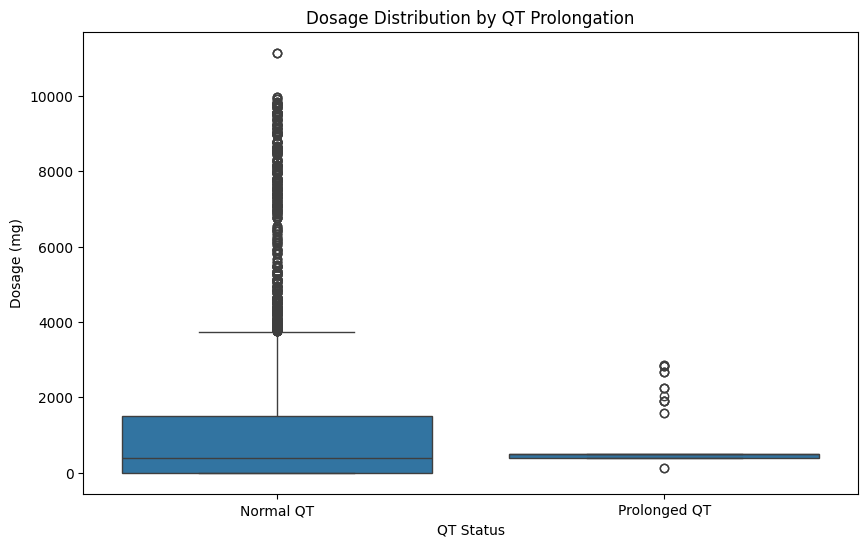

T-Test for Dosage Differences:
t-statistic = -21.0534, p-value = 0.0000
Spearman Correlation between Dosage and QT interval: nan (p=nan)


<ipython-input-9-6ffe2a550c84>:38: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(prolonged_dosage, label="Prolonged QT", shade=True)
<ipython-input-9-6ffe2a550c84>:39: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(normal_dosage, label="Normal QT", shade=True)


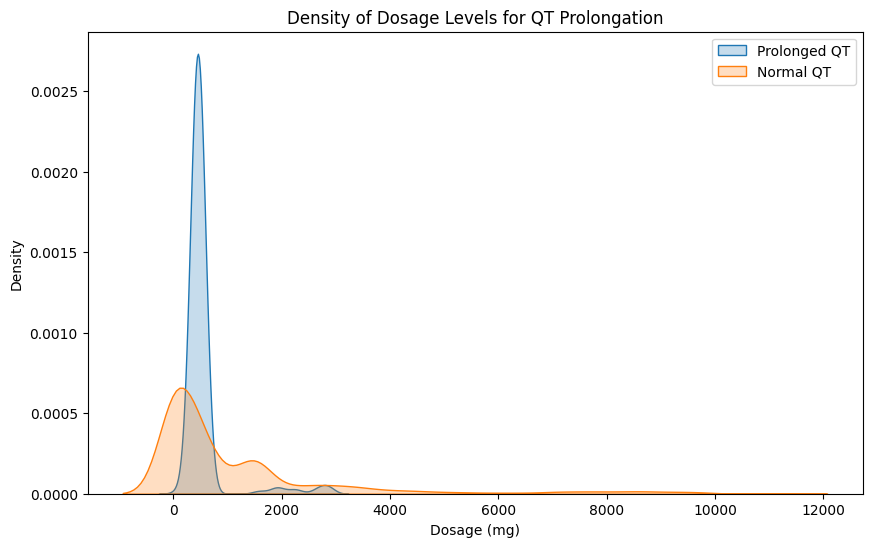

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind, spearmanr

# Load the dataset
file_path = "/content/Merged dataset Sara.csv"
df = pd.read_csv(file_path)

# Ensure QT prolongation is binary (Prolonged vs. Normal)
df['QT_Prolonged'] = ((df['Sex'] == 'M') & (df['QT'] >= 450)) | ((df['Sex'] == 'F') & (df['QT'] >= 460))
df['QT_Prolonged'] = df['QT_Prolonged'].astype(int)

# --- 1. Dosage Distribution Visualization ---
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['QT_Prolonged'], y=df['Dosage(mg)'])
plt.xticks([0, 1], ["Normal QT", "Prolonged QT"])
plt.title("Dosage Distribution by QT Prolongation")
plt.xlabel("QT Status")
plt.ylabel("Dosage (mg)")
plt.show()

# --- 2. Statistical Test: t-test between Prolonged vs. Normal QT Dosages ---
prolonged_dosage = df[df['QT_Prolonged'] == 1]['Dosage(mg)'].dropna()
normal_dosage = df[df['QT_Prolonged'] == 0]['Dosage(mg)'].dropna()

t_stat, p_value = ttest_ind(prolonged_dosage, normal_dosage, equal_var=False)
print(f"T-Test for Dosage Differences:")
print(f"t-statistic = {t_stat:.4f}, p-value = {p_value:.4f}")

# --- 3. Correlation Analysis ---
correlation, corr_p_value = spearmanr(df['Dosage(mg)'], df['QT'])
print(f"Spearman Correlation between Dosage and QT interval: {correlation:.4f} (p={corr_p_value:.4f})")

# --- 4. KDE Plot for Dosage Impact on QT Prolongation ---
plt.figure(figsize=(10, 6))
sns.kdeplot(prolonged_dosage, label="Prolonged QT", shade=True)
sns.kdeplot(normal_dosage, label="Normal QT", shade=True)
plt.title("Density of Dosage Levels for QT Prolongation")
plt.xlabel("Dosage (mg)")
plt.ylabel("Density")
plt.legend()
plt.show()


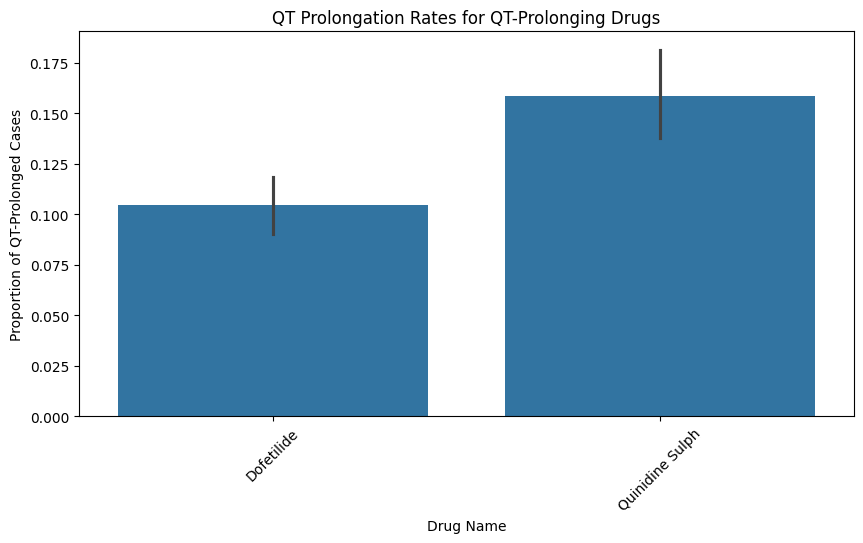

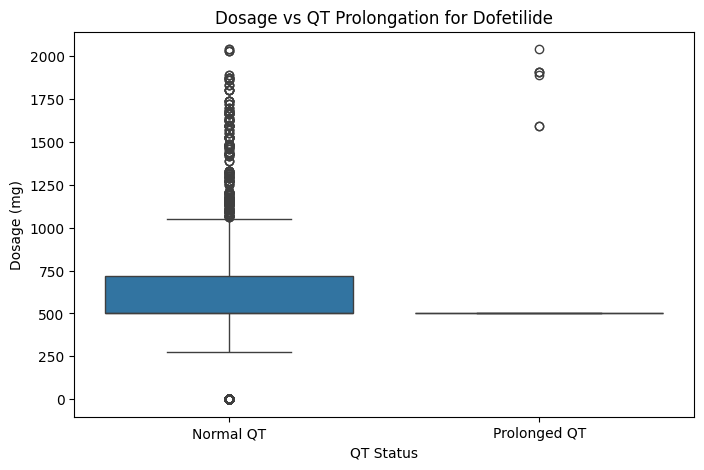

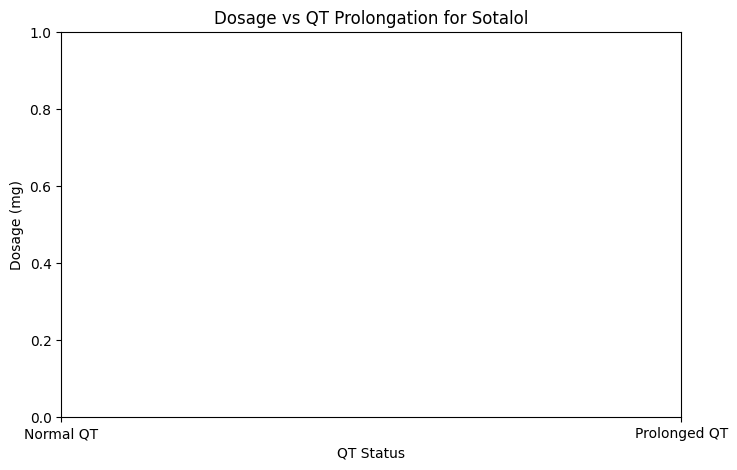

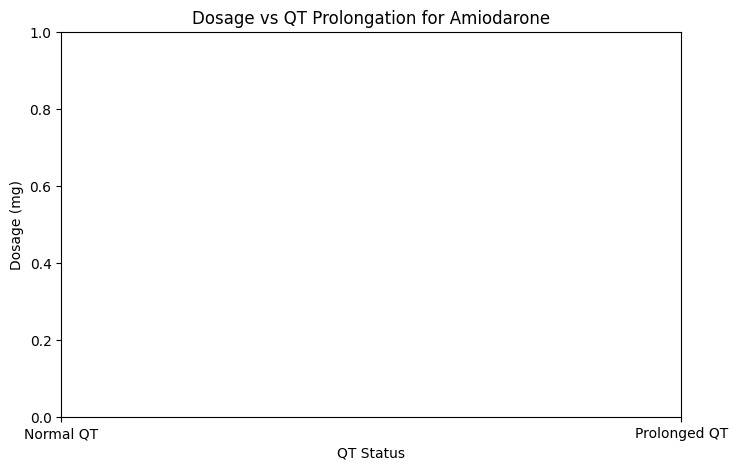

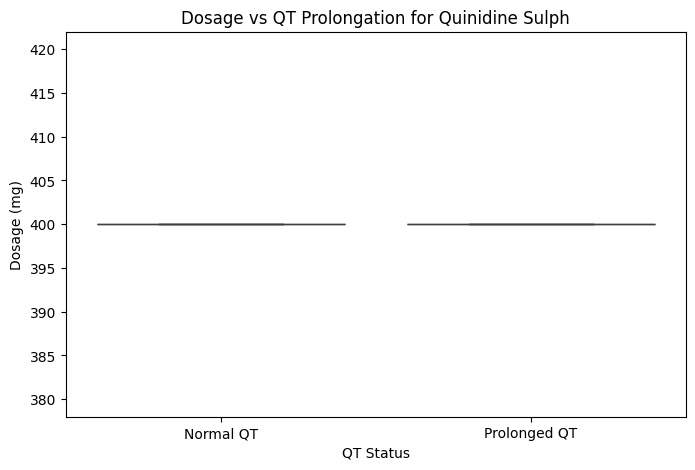

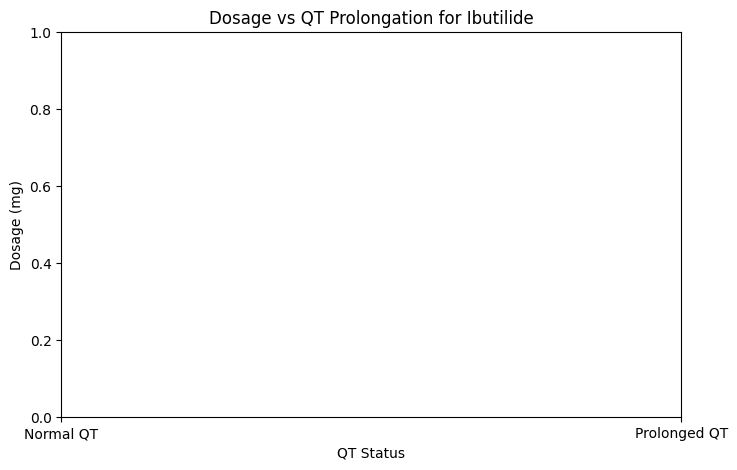

Chi-Square Test for QT Prolongation by Drug:
Chi2 Statistic = 17.4547, p-value = 0.0000
Kruskal-Wallis Test for QT Differences Across Drugs:
Kruskal-Wallis Statistic = nan, p-value = nan


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency, kruskal

# Load the dataset
file_path = "/content/Merged dataset Sara.csv"
df = pd.read_csv(file_path)

# Ensure QT prolongation is correctly defined
df['QT_Prolonged'] = ((df['Sex'] == 'M') & (df['QT'] >= 450)) | ((df['Sex'] == 'F') & (df['QT'] >= 460))
df['QT_Prolonged'] = df['QT_Prolonged'].astype(int)

# List of known QT-prolonging drugs
qt_drugs = ['Dofetilide', 'Sotalol', 'Amiodarone', 'Quinidine Sulph', 'Ibutilide']  # Add more if needed

# Filter dataset to include only patients taking QT-prolonging drugs
df_qt_drugs = df[df['Drug Name'].isin(qt_drugs)]

# --- 1. QT Prolongation Rates Per Drug ---
plt.figure(figsize=(10, 5))
sns.barplot(x=df_qt_drugs['Drug Name'], y=df_qt_drugs['QT_Prolonged'])
plt.title("QT Prolongation Rates for QT-Prolonging Drugs")
plt.ylabel("Proportion of QT-Prolonged Cases")
plt.xlabel("Drug Name")
plt.xticks(rotation=45)
plt.show()

# --- 2. Dosage vs QT Prolongation for High-Risk Drugs ---
for drug in qt_drugs:
    plt.figure(figsize=(8, 5))
    subset = df[df['Drug Name'] == drug]
    sns.boxplot(x=subset['QT_Prolonged'], y=subset['Dosage(mg)'])
    plt.xticks([0, 1], ["Normal QT", "Prolonged QT"])
    plt.title(f"Dosage vs QT Prolongation for {drug}")
    plt.xlabel("QT Status")
    plt.ylabel("Dosage (mg)")
    plt.show()

# --- 3. Statistical Tests ---
# Chi-Square Test: Do QT-prolonging drugs significantly increase QT prolongation risk?
drug_qt_table = pd.crosstab(df_qt_drugs['Drug Name'], df_qt_drugs['QT_Prolonged'])
chi2_stat, chi2_p, _, _ = chi2_contingency(drug_qt_table)

print(f"Chi-Square Test for QT Prolongation by Drug:")
print(f"Chi2 Statistic = {chi2_stat:.4f}, p-value = {chi2_p:.4f}")

# Kruskal-Wallis Test: Do different drugs have different QT effects?
kw_stat, kw_p = kruskal(*[df[df['Drug Name'] == drug]['QT'] for drug in qt_drugs])

print(f"Kruskal-Wallis Test for QT Differences Across Drugs:")
print(f"Kruskal-Wallis Statistic = {kw_stat:.4f}, p-value = {kw_p:.4f}")


QT Prolongation
ECG Anomaly Detection

4 ML

Drug importance

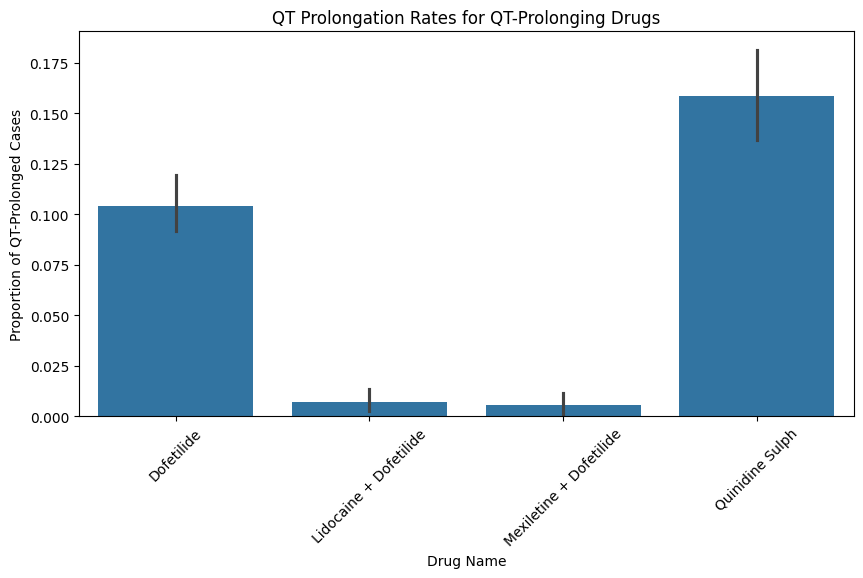

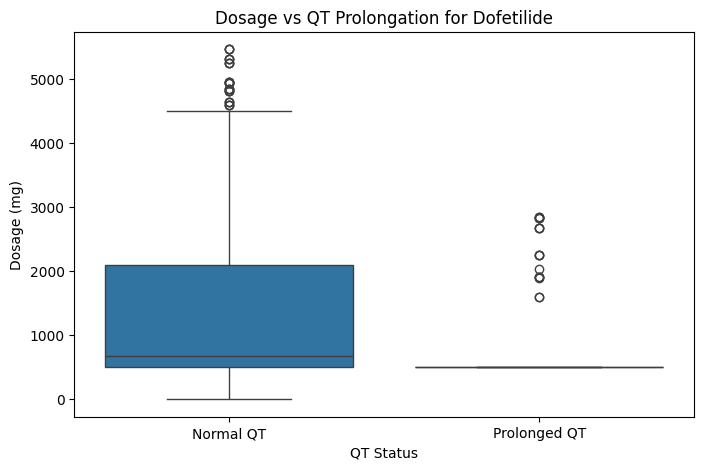

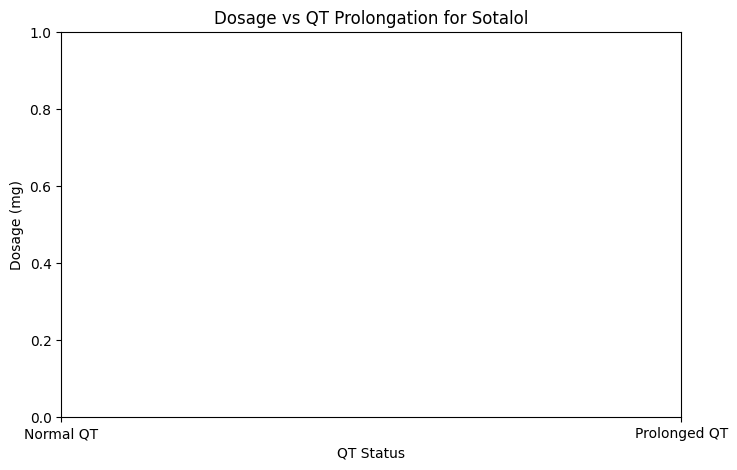

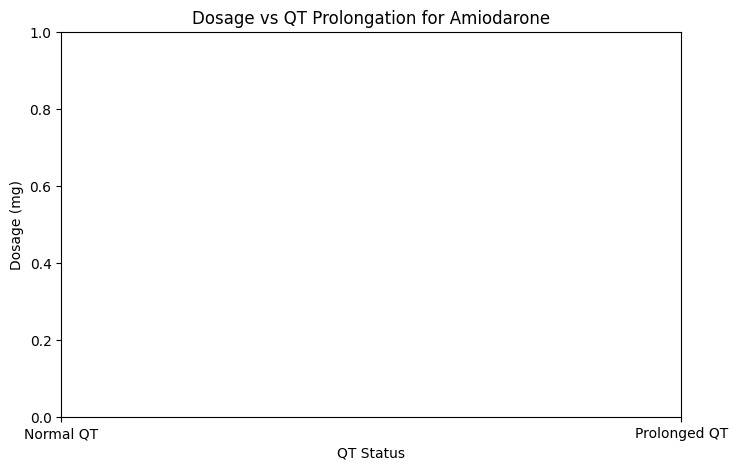

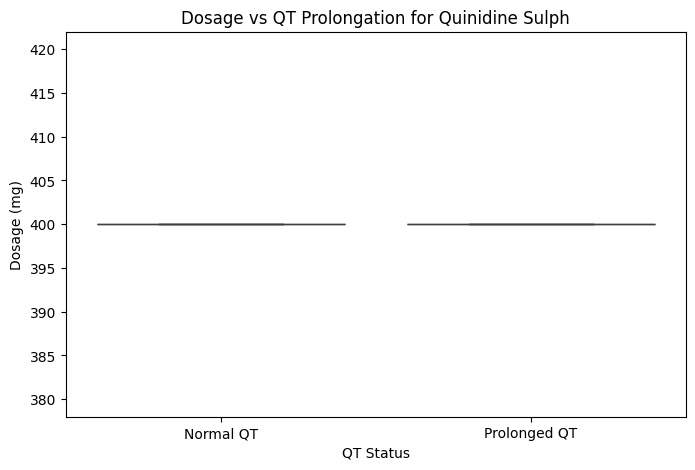

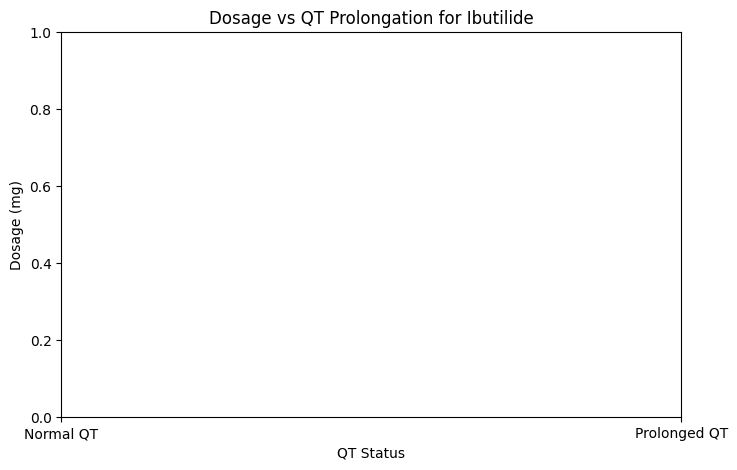

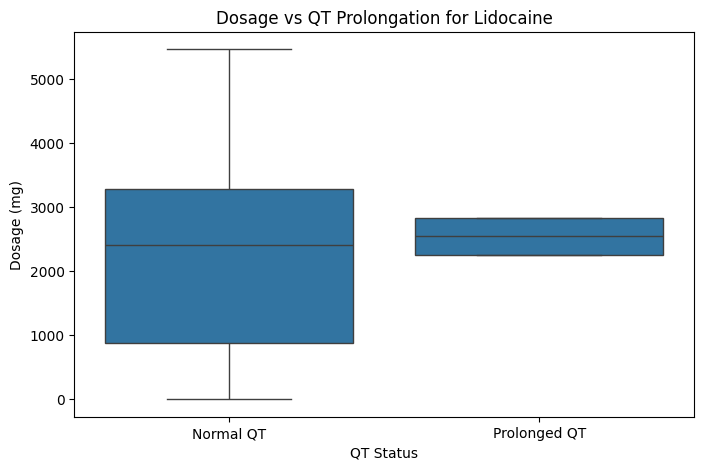

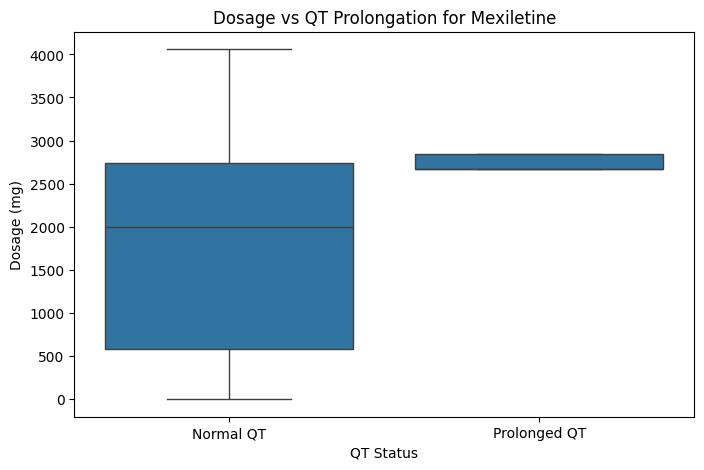

Chi-Square Test for QT Prolongation by Drug:
Chi2 Statistic = 225.6995, p-value = 0.0000

Mann-Whitney U Test for Dofetilide:
U-Statistic = 453196.0000, p-value = 0.0000

Mann-Whitney U Test for Quinidine Sulph:
U-Statistic = 67840.0000, p-value = 1.0000

Mann-Whitney U Test for Lidocaine:
U-Statistic = 2115.0000, p-value = 0.5564

Mann-Whitney U Test for Mexiletine:
U-Statistic = 1153.0000, p-value = 0.0670


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency, mannwhitneyu

# Load the dataset
file_path = "/content/Merged dataset Sara.csv"
df = pd.read_csv(file_path)

# Ensure QT prolongation is correctly defined based on sex-specific thresholds
df['QT_Prolonged'] = ((df['Sex'] == 'M') & (df['QT'] >= 450)) | ((df['Sex'] == 'F') & (df['QT'] >= 460))
df['QT_Prolonged'] = df['QT_Prolonged'].astype(int)

# Define known QT-prolonging drugs, including combinations
qt_drugs = [
    'Dofetilide', 'Sotalol', 'Amiodarone', 'Quinidine Sulph', 'Ibutilide',
    'Lidocaine', 'Mexiletine'
]

# Corrected filtering: Capture any row where a QT-prolonging drug is present (even in a combination)
df_qt_drugs = df[df['Drug Name'].apply(lambda x: any(drug in str(x) for drug in qt_drugs))]

# --- 1. QT Prolongation Rates Per Drug ---
plt.figure(figsize=(10, 5))
sns.barplot(x=df_qt_drugs['Drug Name'], y=df_qt_drugs['QT_Prolonged'])
plt.title("QT Prolongation Rates for QT-Prolonging Drugs")
plt.ylabel("Proportion of QT-Prolonged Cases")
plt.xlabel("Drug Name")
plt.xticks(rotation=45)
plt.show()

# --- 2. Dosage vs QT Prolongation for High-Risk Drugs ---
for drug in qt_drugs:
    plt.figure(figsize=(8, 5))
    subset = df[df['Drug Name'].str.contains(drug, na=False)]
    sns.boxplot(x=subset['QT_Prolonged'], y=subset['Dosage(mg)'])
    plt.xticks([0, 1], ["Normal QT", "Prolonged QT"])
    plt.title(f"Dosage vs QT Prolongation for {drug}")
    plt.xlabel("QT Status")
    plt.ylabel("Dosage (mg)")
    plt.show()

# --- 3. Statistical Tests ---
# Chi-Square Test: Do QT-prolonging drugs significantly increase QT prolongation risk?
drug_qt_table = pd.crosstab(df_qt_drugs['Drug Name'], df_qt_drugs['QT_Prolonged'])
chi2_stat, chi2_p, _, _ = chi2_contingency(drug_qt_table)

print(f"Chi-Square Test for QT Prolongation by Drug:")
print(f"Chi2 Statistic = {chi2_stat:.4f}, p-value = {chi2_p:.4f}")

# Mann-Whitney U Test: Does dosage significantly differ between normal vs prolonged QT?
for drug in qt_drugs:
    subset = df[df['Drug Name'].str.contains(drug, na=False)]

    if len(subset) > 1:
        normal_qt = subset[subset['QT_Prolonged'] == 0]['Dosage(mg)']
        prolonged_qt = subset[subset['QT_Prolonged'] == 1]['Dosage(mg)']

        if len(normal_qt) > 0 and len(prolonged_qt) > 0:
            mw_stat, mw_p = mannwhitneyu(normal_qt, prolonged_qt, alternative="two-sided")
            print(f"\nMann-Whitney U Test for {drug}:")
            print(f"U-Statistic = {mw_stat:.4f}, p-value = {mw_p:.4f}")



Column Names: ['EGREFID', 'PatientID', 'Sex', 'Age', 'Height', 'Weight', 'SYSBP', 'DIABP', 'Race', 'Ethnicity', 'ARMCD', 'Visit', 'Drug Name', 'DOF', 'LIDO', 'MEXI', 'MOXI', 'MOXI.M2', 'DILT', 'QUIN', 'RENO', 'VERA HCL', 'Dosage(mg)', 'TPT', 'BASELINE', 'RR', 'PR', 'QT', 'QRS', 'JTPEAK', 'TPEAKTEND', 'TPEAKTPEAKP', 'ERD_30', 'LRD_30', 'Twave_amplitude', 'Twave_asymmetry', 'Twave_flatness']


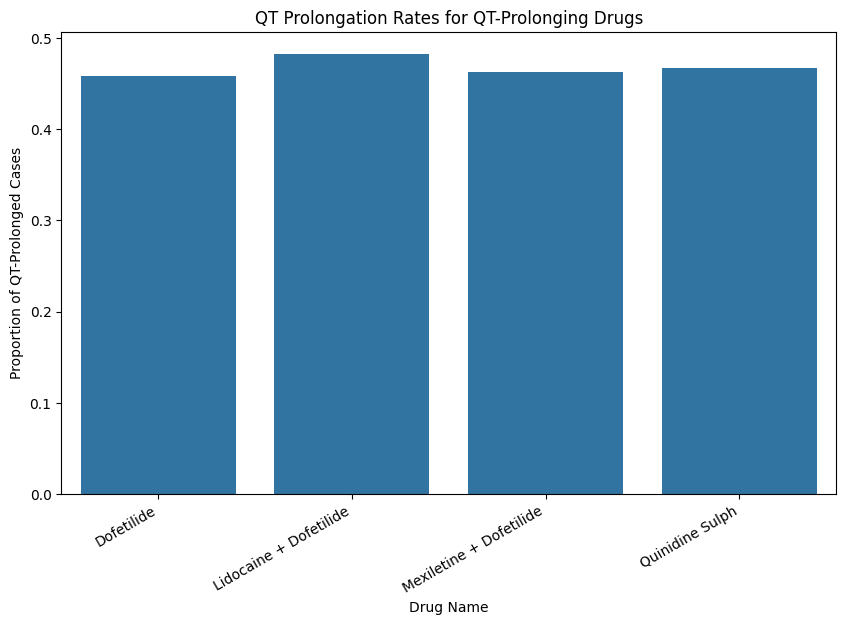

Processing Dofetilide | Using Dosage Column: Dosage(mg)


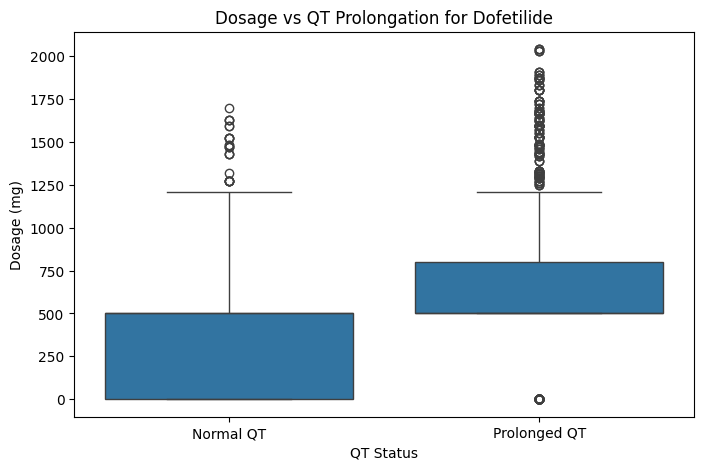

Processing Quinidine Sulph | Using Dosage Column: Dosage(mg)


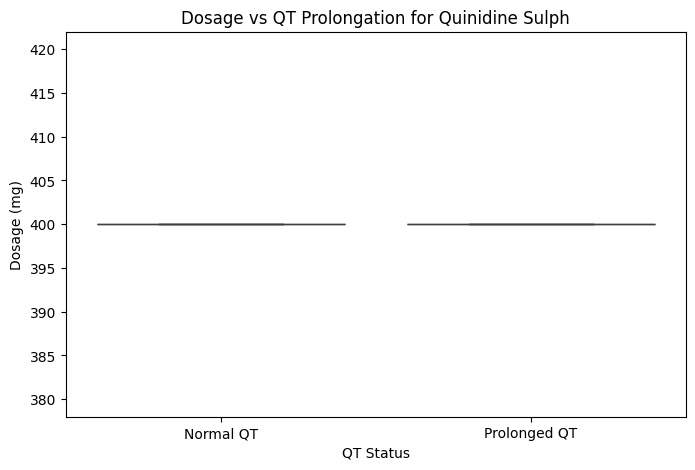

Processing Lidocaine + Dofetilide | Using Dosage Column: Dosage(mg)


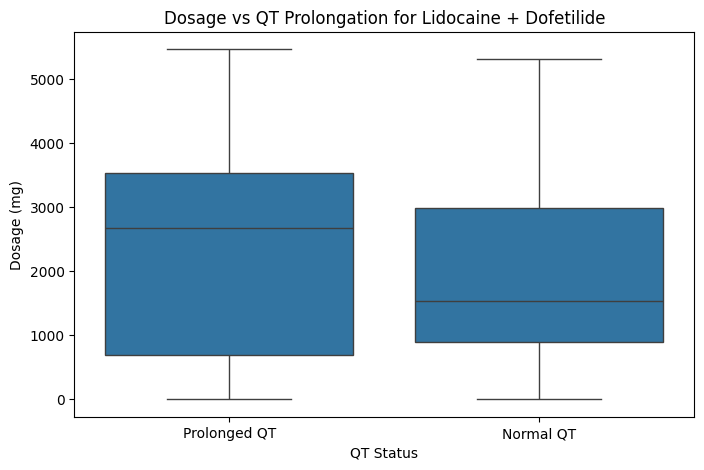

Processing Mexiletine + Dofetilide | Using Dosage Column: Dosage(mg)


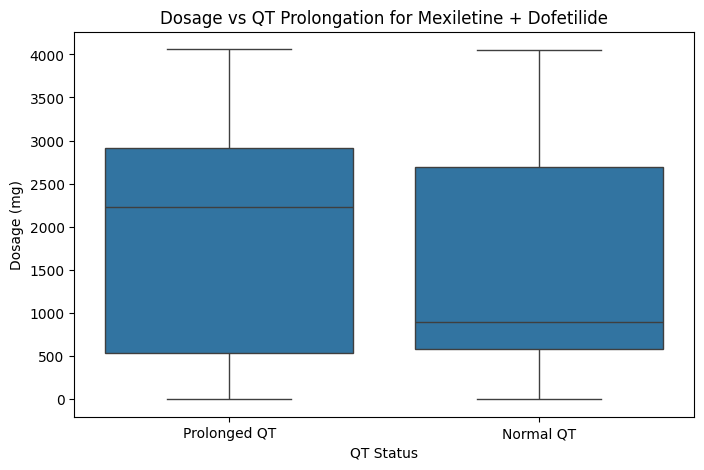

Chi-Square Test for QT Prolongation by Drug:
Chi2 Statistic = 672.6404, p-value = 0.0000

Mann-Whitney U Test for Dofetilide:
U-Statistic = 553948.5000, p-value = 0.0000

Mann-Whitney U Test for Quinidine Sulph:
U-Statistic = 85172.5000, p-value = 1.0000

Mann-Whitney U Test for Lidocaine + Dofetilide:
U-Statistic = 88654.0000, p-value = 0.0041

Mann-Whitney U Test for Mexiletine + Dofetilide:
U-Statistic = 96668.5000, p-value = 0.0014



In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency, mannwhitneyu

# Load the dataset
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# Ensure column names are clean (remove spaces)
data.columns = data.columns.str.strip()

# Verify column names to avoid lookup errors
print("Column Names:", data.columns.tolist())  # Debugging step

# Define QT-prolonging drugs
qt_prolonging_drugs = [
    "Dofetilide", "Quinidine Sulph", "Lidocaine + Dofetilide", "Mexiletine + Dofetilide",
    "Sotalol", "Amiodarone", "Ibutilide", "Lidocaine", "Mexiletine"
]

# Filter data for QT-prolonging drugs
qt_prolonging_data = data[data["Drug Name"].isin(qt_prolonging_drugs)].copy()

# Compute QT prolongation rates per drug
qt_prolonging_rates = qt_prolonging_data.groupby("Drug Name")["QT"].apply(lambda x: (x > x.mean()).mean())

# Plot QT prolongation rates
plt.figure(figsize=(10, 6))
sns.barplot(x=qt_prolonging_rates.index, y=qt_prolonging_rates.values, errorbar=None)
plt.xticks(rotation=30, ha="right")
plt.xlabel("Drug Name")
plt.ylabel("Proportion of QT-Prolonged Cases")
plt.title("QT Prolongation Rates for QT-Prolonging Drugs")
plt.show()

# Fix `SettingWithCopyWarning` using .loc[]
for drug in qt_prolonging_drugs:
    drug_data = data[data["Drug Name"] == drug].copy()  # Ensure it's a new DataFrame

    if drug_data.empty:
        continue

    # Ensure 'Dosage (mg)' exists and is clean
    dosage_col = [col for col in drug_data.columns if "Dosage" in col]
    if not dosage_col:
        print(f"⚠️ Warning: 'Dosage' column not found for {drug}")
        continue
    dosage_col = dosage_col[0]  # Use the correct dosage column

    # Ensure correct data types
    drug_data[dosage_col] = pd.to_numeric(drug_data[dosage_col], errors="coerce")

    # Create binary QT prolongation status
    qt_mean = data["QT"].mean()
    drug_data.loc[:, "QT Status"] = np.where(drug_data["QT"] > qt_mean, "Prolonged QT", "Normal QT")

    # Verify the column exists
    print(f"Processing {drug} | Using Dosage Column: {dosage_col}")  # Debugging step

    # Plot boxplot
    plt.figure(figsize=(8, 5))
    sns.boxplot(x="QT Status", y=dosage_col, data=drug_data)
    plt.xlabel("QT Status")
    plt.ylabel("Dosage (mg)")
    plt.title(f"Dosage vs QT Prolongation for {drug}")
    plt.show()

# Chi-square test for QT prolongation by drug
contingency_table = pd.crosstab(qt_prolonging_data["Drug Name"], qt_prolonging_data["QT"] > qt_prolonging_data["QT"].mean())
chi2_stat, chi2_p, _, _ = chi2_contingency(contingency_table)
print(f"Chi-Square Test for QT Prolongation by Drug:\nChi2 Statistic = {chi2_stat:.4f}, p-value = {chi2_p:.4f}\n")

# Mann-Whitney U test for dosage differences in QT prolongation
for drug in qt_prolonging_drugs:
    drug_data = data[data["Drug Name"] == drug]

    if drug_data.empty:
        continue

    qt_prolonged = drug_data[drug_data["QT"] > data["QT"].mean()][dosage_col]
    qt_normal = drug_data[drug_data["QT"] <= data["QT"].mean()][dosage_col]

    if len(qt_prolonged) > 0 and len(qt_normal) > 0:
        u_stat, u_p = mannwhitneyu(qt_prolonged, qt_normal, alternative="two-sided")
        print(f"Mann-Whitney U Test for {drug}:\nU-Statistic = {u_stat:.4f}, p-value = {u_p:.4f}\n")


QT Status Counts for Quinidine Sulph:
QT Status
Prolonged QT    785
Normal QT       223
Name: count, dtype: int64

Chi-Square Test Results for Quinidine Sulph:
Chi2 Statistic = 0.0000, p-value = 1.0000


<ipython-input-9-a46388aa7f1b>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  quinidine_data["QT Status"] = ["Prolonged QT" if qt > qt_mean else "Normal QT" for qt in quinidine_data["QT"]]
<ipython-input-9-a46388aa7f1b>:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=qt_counts.index, y=qt_counts.values, palette="Blues")


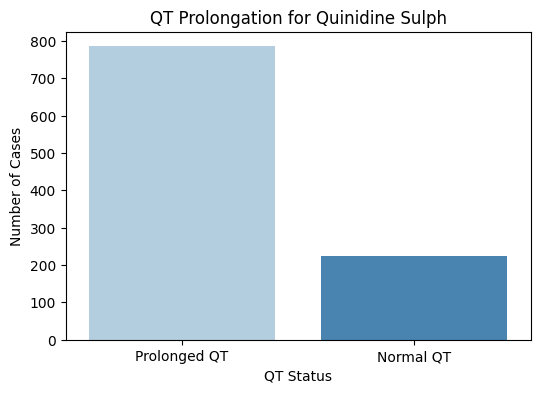

In [ ]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# Load the dataset (Replace with your file path if needed)
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# Ensure column names are trimmed of extra spaces
data.columns = data.columns.str.strip()

# Filter only Quinidine Sulph cases
quinidine_data = data[data["Drug Name"] == "Quinidine Sulph"]

# Ensure QT column exists and create a binary "QT Prolongation" column
qt_mean = data["QT"].mean()  # Define QT prolongation threshold
quinidine_data["QT Status"] = ["Prolonged QT" if qt > qt_mean else "Normal QT" for qt in quinidine_data["QT"]]

# Count occurrences of QT prolongation vs. normal QT
qt_counts = quinidine_data["QT Status"].value_counts()
print("QT Status Counts for Quinidine Sulph:")
print(qt_counts)

# Perform Chi-Square Test to check if QT prolongation is significantly different
contingency_table = pd.crosstab(quinidine_data["QT Status"], quinidine_data["Drug Name"])
chi2, p_value, dof, expected = chi2_contingency(contingency_table)
print("\nChi-Square Test Results for Quinidine Sulph:")
print(f"Chi2 Statistic = {chi2:.4f}, p-value = {p_value:.4f}")

# Generate a bar plot for QT prolongation rates
plt.figure(figsize=(6, 4))
sns.barplot(x=qt_counts.index, y=qt_counts.values, palette="Blues")
plt.xlabel("QT Status")
plt.ylabel("Number of Cases")
plt.title("QT Prolongation for Quinidine Sulph")
plt.show()


,Drug Name,Prolongation Rate,Chi2 Statistic,p-value
5,Quinidine Sulph,0.778770,379.880828,1.321012e-84
0,Dofetilide,0.636076,205.588860,1.259793e-46
3,Moxifloxacin + Diltiazem,0.441761,0.425400,5.142549e-01
6,Ranolazine,0.424242,3.550361,5.953251e-02
1,Lidocaine + Dofetilide,0.368485,22.705074,1.888684e-06
7,Verapamil HCL,0.332386,57.510654,3.361536e-14
2,Mexiletine + Dofetilide,0.325397,54.486028,1.565570e-13
4,Placebo,0.291139,172.645677,1.955914e-39


<ipython-input-12-0b56af520de9>:50: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(x="Drug Name", y="Prolongation Rate", data=qt_analysis, ci=None)


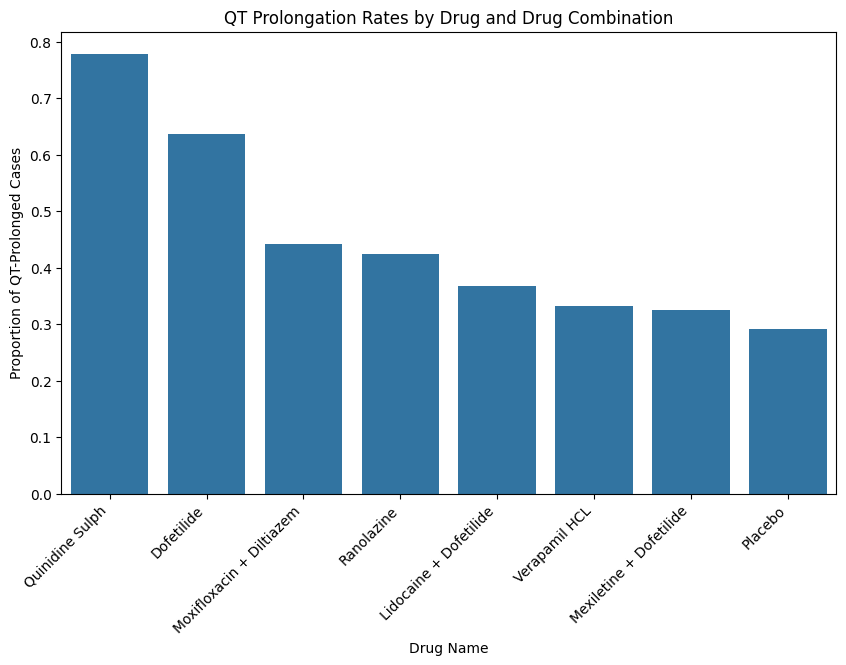

,Drug Name,Prolongation Rate,Chi2 Statistic,p-value
5,Quinidine Sulph,0.778770,379.880828,1.321012e-84
0,Dofetilide,0.636076,205.588860,1.259793e-46
3,Moxifloxacin + Diltiazem,0.441761,0.425400,5.142549e-01
6,Ranolazine,0.424242,3.550361,5.953251e-02
1,Lidocaine + Dofetilide,0.368485,22.705074,1.888684e-06
7,Verapamil HCL,0.332386,57.510654,3.361536e-14
2,Mexiletine + Dofetilide,0.325397,54.486028,1.565570e-13
4,Placebo,0.291139,172.645677,1.955914e-39


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats

# Load the dataset
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# Standardize column names to avoid extra spaces
data.columns = data.columns.str.strip()

# Identify drugs and QT prolongation
drug_column = "Drug Name"
qt_column = "QT"

# Convert QT prolongation into categorical labels
qt_mean = data[qt_column].mean()
data["QT Status"] = ["Prolonged QT" if qt > qt_mean else "Normal QT" for qt in data[qt_column]]

# Count QT prolongation cases for each drug and combination
qt_counts = data.groupby(drug_column)["QT Status"].value_counts().unstack().fillna(0)

# Calculate proportion of QT prolongation cases per drug
qt_counts["Prolongation Rate"] = qt_counts["Prolonged QT"] / (qt_counts["Prolonged QT"] + qt_counts["Normal QT"])

# Chi-Square Test for significance
chi2_results = {}
for drug in qt_counts.index:
    table = [[qt_counts.loc[drug, "Prolonged QT"], qt_counts.loc[drug, "Normal QT"]]]
    chi2, p, _, _ = stats.chi2_contingency(table + [[qt_counts["Prolonged QT"].sum(), qt_counts["Normal QT"].sum()]])
    chi2_results[drug] = {"Chi2 Statistic": chi2, "p-value": p}

# Convert results to DataFrame
chi2_df = pd.DataFrame.from_dict(chi2_results, orient="index").reset_index()
chi2_df.columns = ["Drug Name", "Chi2 Statistic", "p-value"]

# Merge with QT prolongation rates
qt_analysis = qt_counts.reset_index()[[drug_column, "Prolongation Rate"]].merge(chi2_df, on="Drug Name")

# Sort drugs by QT prolongation rate
qt_analysis = qt_analysis.sort_values(by="Prolongation Rate", ascending=False)

# Display the table
from IPython.display import display
display(qt_analysis)

# Visualization: QT Prolongation Rates for all drugs and combinations
plt.figure(figsize=(10, 6))
sns.barplot(x="Drug Name", y="Prolongation Rate", data=qt_analysis, ci=None)
plt.xticks(rotation=45, ha="right")
plt.xlabel("Drug Name")
plt.ylabel("Proportion of QT-Prolonged Cases")
plt.title("QT Prolongation Rates by Drug and Drug Combination")
plt.show()

# Display Chi-Square Results
qt_analysis


In [ ]:
print(data.columns)


Index(['EGREFID', 'PatientID', 'Sex', 'Age', 'Height', 'Weight', 'SYSBP',
       'DIABP', 'Race', 'Ethnicity', 'ARMCD', 'Visit', 'Drug Name', 'DOF',
       'LIDO', 'MEXI', 'MOXI', 'MOXI.M2', 'DILT', 'QUIN', 'RENO', 'VERA HCL',
       'Dosage(mg)', 'TPT', 'BASELINE', 'RR', 'PR', 'QT', 'QRS', 'JTPEAK',
       'TPEAKTEND', 'TPEAKTPEAKP', 'ERD_30', 'LRD_30', 'Twave_amplitude',
       'Twave_asymmetry', 'Twave_flatness', 'QT_Status'],
      dtype='object')


Column Names: ['EGREFID', 'PatientID', 'Sex', 'Age', 'Height', 'Weight', 'SYSBP', 'DIABP', 'Race', 'Ethnicity', 'ARMCD', 'Visit', 'Drug Name', 'DOF', 'LIDO', 'MEXI', 'MOXI', 'MOXI.M2', 'DILT', 'QUIN', 'RENO', 'VERA HCL', 'Dosage(mg)', 'TPT', 'BASELINE', 'RR', 'PR', 'QT', 'QRS', 'JTPEAK', 'TPEAKTEND', 'TPEAKTPEAKP', 'ERD_30', 'LRD_30', 'Twave_amplitude', 'Twave_asymmetry', 'Twave_flatness']
QT_Status column added: QT_Status
0    8969
1     354
Name: count, dtype: int64

Model Accuracy: 0.9651474530831099
ROC-AUC Score: 0.942837627773329
Confusion Matrix:
 [[1792    2]
 [  63    8]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      1.00      0.98      1794
           1       0.80      0.11      0.20        71

    accuracy                           0.97      1865
   macro avg       0.88      0.56      0.59      1865
weighted avg       0.96      0.97      0.95      1865



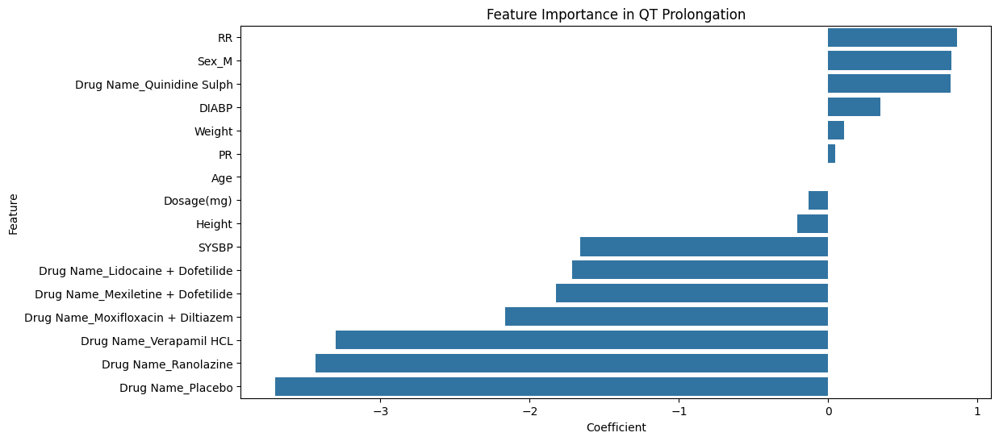

In [ ]:
# Import Required Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_auc_score

# Load Data
file_path = "/content/Merged dataset Sara.csv"  # Update path if necessary
data = pd.read_csv(file_path)

# Display column names
print("Column Names:", data.columns.tolist())

# Check if 'QT' column exists
if "QT" not in data.columns:
    raise ValueError("Error: 'QT' column is missing from dataset!")

# Define QT prolongation status based on gender-specific thresholds
def classify_qt_prolongation(row):
    if row["Sex"] == "M":
        return 1 if row["QT"] > 450 else 0
    else:
        return 1 if row["QT"] > 460 else 0

# Create 'QT_Status' column
data["QT_Status"] = data.apply(classify_qt_prolongation, axis=1)

# Print count of QT prolongation cases
print("QT_Status column added:", data["QT_Status"].value_counts())

# Define Features and Target Variable
features = ["Drug Name", "Dosage(mg)", "Age", "Weight", "Height", "Sex", "SYSBP", "DIABP", "PR", "RR"]
X = data[features]
y = data["QT_Status"]

# Convert Categorical Variables into Dummy Variables
X = pd.get_dummies(X, columns=["Drug Name", "Sex"], drop_first=True)

# Handle Missing Values
X = X.fillna(X.median())  # Replace NaNs with median values for numerical columns

# Standardize Numerical Features
scaler = StandardScaler()
num_features = ["Dosage(mg)", "Age", "Weight", "Height", "SYSBP", "DIABP", "PR", "RR"]
X[num_features] = scaler.fit_transform(X[num_features])

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Train Logistic Regression Model
model = LogisticRegression(max_iter=5000)
model.fit(X_train, y_train)

# Model Evaluation
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
conf_matrix = confusion_matrix(y_test, y_pred)

# Display Results
print("\nModel Accuracy:", accuracy)
print("ROC-AUC Score:", roc_auc)
print("Confusion Matrix:\n", conf_matrix)
print("Classification Report:\n", classification_report(y_test, y_pred))

# Extract Feature Importance
coefficients = pd.DataFrame({"Feature": X.columns, "Coefficient": model.coef_[0]})
coefficients = coefficients.sort_values(by="Coefficient", ascending=False)

# Visualize Feature Importance
plt.figure(figsize=(12, 6))
sns.barplot(x="Coefficient", y="Feature", data=coefficients)
plt.title("Feature Importance in QT Prolongation")
plt.show()


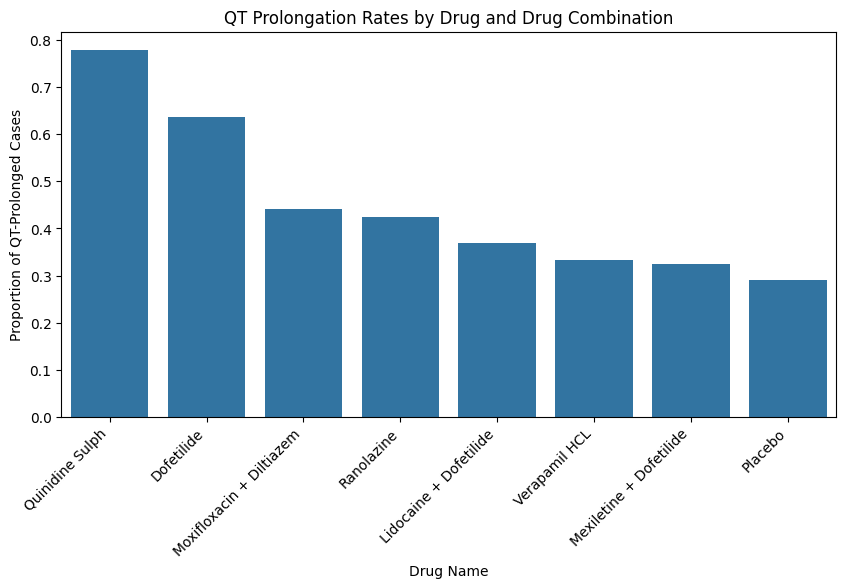

Chi-Square Test Results:
                  Drug Name  Prolongation Rate  Chi2 Statistic        p-value
0           Quinidine Sulph           0.778770     1035.218917  2.955264e-219
1                Dofetilide           0.636076     1035.218917  2.955264e-219
2  Moxifloxacin + Diltiazem           0.441761     1035.218917  2.955264e-219
3                Ranolazine           0.424242     1035.218917  2.955264e-219
4    Lidocaine + Dofetilide           0.368485     1035.218917  2.955264e-219
5             Verapamil HCL           0.332386     1035.218917  2.955264e-219
6   Mexiletine + Dofetilide           0.325397     1035.218917  2.955264e-219
7                   Placebo           0.291139     1035.218917  2.955264e-219


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency

# Load the dataset
file_path = "/content/Merged dataset Sara.csv"  # Make sure the file is correctly uploaded
data = pd.read_csv(file_path)

# Ensure column names are stripped of whitespace
data.columns = data.columns.str.strip()

# Define QT prolongation threshold
qt_mean = data["QT"].mean()  # Use mean QT as a threshold (Modify if a clinical threshold is needed)

# Create the QT_Status column (1 = Prolonged QT, 0 = Normal QT)
data["QT_Status"] = (data["QT"] > qt_mean).astype(int)

# Define drugs of interest (both single and combination drugs)
qt_prolonging_drugs = [
    "Dofetilide",
    "Quinidine Sulph",
    "Lidocaine + Dofetilide",
    "Mexiletine + Dofetilide",
    "Moxifloxacin + Diltiazem",
    "Ranolazine",
    "Verapamil HCL",
    "Placebo"
]

# Filter data for these drugs
data_filtered = data[data["Drug Name"].isin(qt_prolonging_drugs)]

# Compute QT prolongation rates
qt_prolonging_rates = data_filtered.groupby("Drug Name")["QT_Status"].mean().sort_values(ascending=False)

# Perform Chi-Square test for QT prolongation differences across drugs
contingency_table = pd.crosstab(data_filtered["Drug Name"], data_filtered["QT_Status"])
chi2_stat, p_value, _, _ = chi2_contingency(contingency_table)

# Plot QT prolongation rates for each drug and combination
plt.figure(figsize=(10, 5))
sns.barplot(x=qt_prolonging_rates.index, y=qt_prolonging_rates.values)
plt.xticks(rotation=45, ha="right")
plt.xlabel("Drug Name")
plt.ylabel("Proportion of QT-Prolonged Cases")
plt.title("QT Prolongation Rates by Drug and Drug Combination")
plt.show()

# Display Chi-Square test results
qt_analysis_results = pd.DataFrame({
    "Drug Name": qt_prolonging_rates.index,
    "Prolongation Rate": qt_prolonging_rates.values
})
qt_analysis_results["Chi2 Statistic"] = chi2_stat
qt_analysis_results["p-value"] = p_value

# Display results
print("Chi-Square Test Results:")
print(qt_analysis_results)


In [ ]:
!pip install lifelines


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.3/349.3 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.7/115.7 kB 9.9 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4031 sha256=b3b7151546c58f171e7e4e65f3061260c35355b2aafc79292395ee278d25362a
  Stored in directory: /root/.cache/pip/wheels/8b/67/f4/2caaae2146198dcb824f31a303833b07b14a5ec863fb3acd7b
Successfully built autograd-gamma


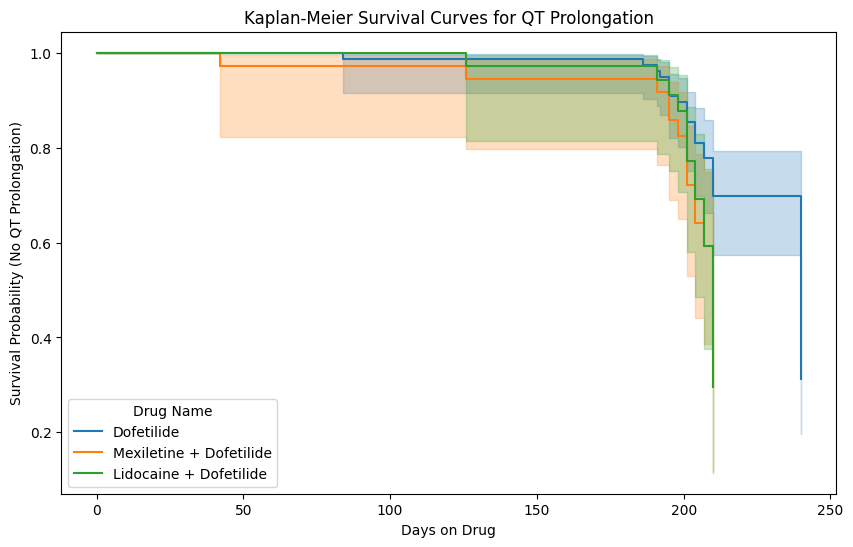

Log-Rank Test p-value for Quinidine Sulph vs Dofetilide: 0.012716964341660334


<lifelines.CoxPHFitter: fitted with 369 total observations, 194 right-censored observations>
             duration col = 'Days on Drug'
                event col = 'QT_Status'
      baseline estimation = breslow
   number of observations = 369
number of events observed = 175
   partial log-likelihood = -838.01
         time fit was run = 2025-02-20 02:02:39 UTC

---
                                    coef exp(coef)  se(coef)  coef lower 95%  coef upper 95% exp(coef) lower 95% exp(coef) upper 95%
covariate                                                                                                                           
PatientID                           0.00      1.00      0.00            0.00            0.01                1.00                1.01
Drug Name_Lidocaine + Dofetilide   -0.23      0.80      0.32           -0.85            0.39                0.43                1.48
Drug Name_Mexiletine + Dofetilide  -0.14      0.87      0.31           -0.75            0.47                0.47                1.60
Drug Name_Moxifloxacin + Diltiazem -0.17      0.84      0.32           -0.80            0.45                0.45                1.57
Drug Name_Placebo                  -0.31      0.73      0.24           -0.78            0.16                0.46                1.18
Drug Name_Quinidine Sulph           0.03      1.03      0.29           -0.54            0.60                0.58                1.83
Drug Name_Ranolazine               -0.21      0.81      0.31           -0.82            0.40                0.44                1.50
Drug Name_Verapamil HCL            -0.28      0.76      0.31           -0.89            0.33                0.41                1.39

                                    cmp to     z      p  -log2(p)
covariate                                                        
PatientID                             0.00  7.30 <0.005     41.63
Drug Name_Lidocaine + Dofetilide      0.00 -0.72   0.47      1.08
Drug Name_Mexiletine + Dofetilide     0.00 -0.46   0.65      0.63
Drug Name_Moxifloxacin + Diltiazem    0.00 -0.55   0.58      0.78
Drug Name_Placebo                     0.00 -1.29   0.20      2.33
Drug Name_Quinidine Sulph             0.00  0.11   0.91      0.13
Drug Name_Ranolazine                  0.00 -0.67   0.51      0.98
Drug Name_Verapamil HCL               0.00 -0.90   0.37      1.45
---
Concordance = 0.75
Partial AIC = 1692.01
log-likelihood ratio test = 168.05 on 8 df
-log2(p) of ll-ratio test = 104.58

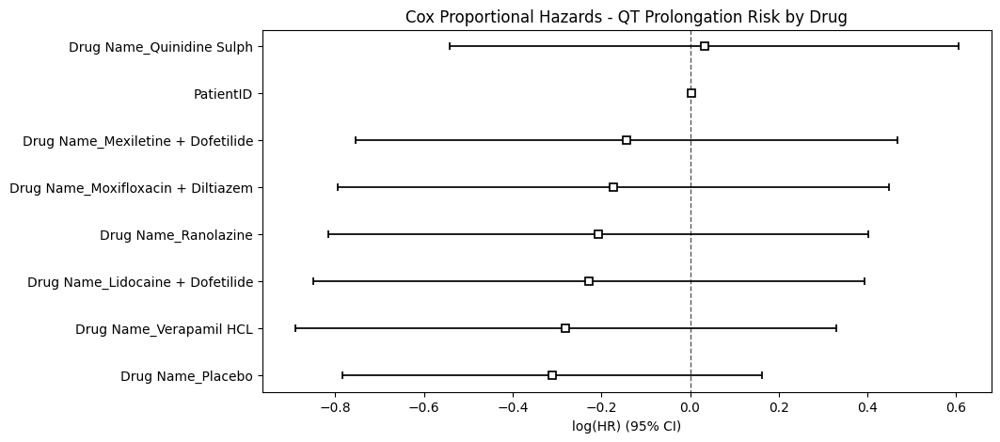

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from lifelines import KaplanMeierFitter, CoxPHFitter
from lifelines.statistics import logrank_test

# Load dataset
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# Ensure QT prolongation is defined
qt_threshold = data["QT"].mean()  # Define a threshold (e.g., mean QT interval)
data["QT_Status"] = (data["QT"] > qt_threshold).astype(int)  # 1 = Prolonged QT, 0 = Normal QT

# Compute Days on Drug
data["Days on Drug"] = data.groupby("PatientID")["PatientID"].transform("count")

# Select key columns
survival_data = data[["PatientID", "Drug Name", "Days on Drug", "QT_Status"]].drop_duplicates()

# Kaplan-Meier Analysis
kmf = KaplanMeierFitter()

plt.figure(figsize=(10, 6))
for drug in ["Dofetilide", "Mexiletine + Dofetilide", "Lidocaine + Dofetilide"]:
    subset = survival_data[survival_data["Drug Name"] == drug]
    kmf.fit(durations=subset["Days on Drug"], event_observed=subset["QT_Status"], label=drug)
    kmf.plot_survival_function()

plt.title("Kaplan-Meier Survival Curves for QT Prolongation")
plt.xlabel("Days on Drug")
plt.ylabel("Survival Probability (No QT Prolongation)")
plt.legend(title="Drug Name")
plt.show()

# Log-Rank Test (Compare Two Drugs)
drug1 = "Quinidine Sulph"
drug2 = "Dofetilide"

subset1 = survival_data[survival_data["Drug Name"] == drug1]
subset2 = survival_data[survival_data["Drug Name"] == drug2]

logrank_p = logrank_test(subset1["Days on Drug"], subset2["Days on Drug"],
                         event_observed_A=subset1["QT_Status"], event_observed_B=subset2["QT_Status"]).p_value

print(f"Log-Rank Test p-value for {drug1} vs {drug2}: {logrank_p}")

# Cox Proportional Hazards Model
cox_data = survival_data.copy()
cox_data = pd.get_dummies(cox_data, columns=["Drug Name"], drop_first=True)

cph = CoxPHFitter()
cph.fit(cox_data, duration_col="Days on Drug", event_col="QT_Status")
cph.print_summary()

# Plot Cox model results
plt.figure(figsize=(10, 5))
cph.plot()
plt.title("Cox Proportional Hazards - QT Prolongation Risk by Drug")
plt.show()


In [ ]:
print("Column Names:", data.columns.tolist())


Column Names: ['EGREFID', 'PatientID', 'Sex', 'Age', 'Height', 'Weight', 'SYSBP', 'DIABP', 'Race', 'Ethnicity', 'ARMCD', 'Visit', 'Drug Name', 'DOF', 'LIDO', 'MEXI', 'MOXI', 'MOXI.M2', 'DILT', 'QUIN', 'RENO', 'VERA HCL', 'Dosage(mg)', 'TPT', 'BASELINE', 'RR', 'PR', 'QT', 'QRS', 'JTPEAK', 'TPEAKTEND', 'TPEAKTPEAKP', 'ERD_30', 'LRD_30', 'Twave_amplitude', 'Twave_asymmetry', 'Twave_flatness']


In [ ]:
!pip install pmdarima
!pip install statsmodels


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 37.2 MB/s eta 0:00:00


Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed

📊 ARIMA Model Performance:
Mean Absolute Error (MAE): 203370.8976
Root Mean Squared Error (RMSE): 2697877.7243


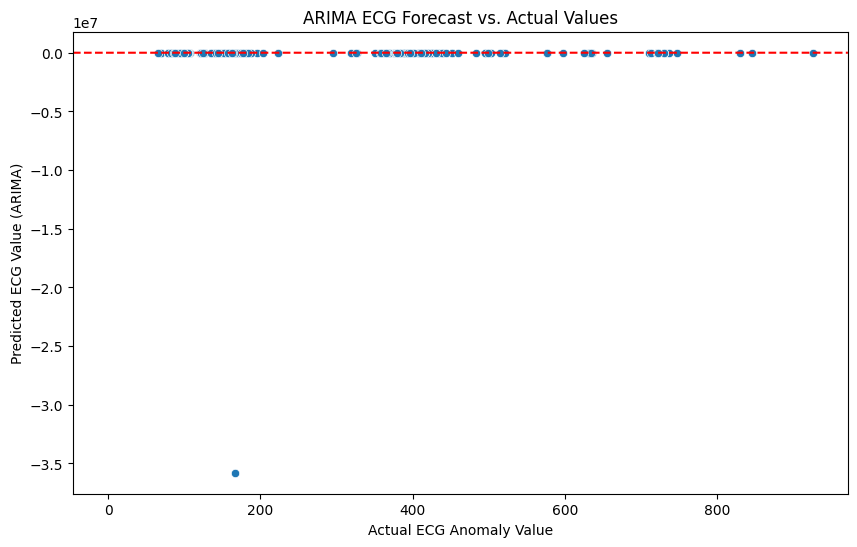

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
from pmdarima import auto_arima
from tqdm import tqdm

# Load the merged ECG dataset
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# Preprocessing: Select relevant ECG features
ecg_features = ["QT", "QRS", "PR", "Twave_amplitude"]
data = data[["PatientID", "Visit", "Drug Name"] + ecg_features]

# Handle missing values (fill using interpolation)
data[ecg_features] = data[ecg_features].interpolate(method='linear')

# Convert "Visit" to time-based index per patient
data.sort_values(by=["PatientID", "Visit"], inplace=True)

# Define ARIMA Forecasting Function
def apply_arima(patient_data, feature):
    """
    Train ARIMA on past ECG measurements and predict next value.
    """
    patient_data = patient_data.sort_values("Visit")
    time_series = patient_data[feature].dropna().values

    if len(time_series) < 10:  # Ensure enough data points
        return np.nan

    # Auto-select best ARIMA parameters
    model = auto_arima(time_series, seasonal=False, trace=False, error_action='ignore', suppress_warnings=True)
    order = model.order

    # Train ARIMA model
    arima_model = ARIMA(time_series, order=order)
    arima_model_fit = arima_model.fit()

    # Forecast the next value
    forecast = arima_model_fit.forecast(steps=1)[0]
    return forecast

# Apply ARIMA to each patient's ECG trends
predictions = []
true_values = []

for patient_id in tqdm(data["PatientID"].unique()):
    patient_data = data[data["PatientID"] == patient_id]

    for feature in ecg_features:
        predicted_qt = apply_arima(patient_data, feature)
        actual_qt = patient_data[feature].iloc[-1]  # Last observed value

        if not np.isnan(predicted_qt):
            predictions.append(predicted_qt)
            true_values.append(actual_qt)

# Convert results into DataFrame
results_df = pd.DataFrame({"Actual": true_values, "Predicted": predictions})

# Compute Evaluation Metrics
mae = mean_absolute_error(results_df["Actual"], results_df["Predicted"])
mse = mean_squared_error(results_df["Actual"], results_df["Predicted"])
rmse = np.sqrt(mse)

print(f"📊 ARIMA Model Performance:")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot Predicted vs Actual ECG Values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=results_df["Actual"], y=results_df["Predicted"])
plt.xlabel("Actual ECG Anomaly Value")
plt.ylabel("Predicted ECG Value (ARIMA)")
plt.title("ARIMA ECG Forecast vs. Actual Values")
plt.axline((0, 0), slope=1, linestyle="--", color="red")
plt.show()


No duplicate columns detected.
Checking Stationarity for QT


<ipython-input-17-f5dc6a59a191>:26: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  data['Visit'] = pd.to_datetime(data['Visit'], errors='coerce')  # Convert to DateTime


ADF Statistic: -8.13220
P-value: 0.00000
Stationary
Checking Stationarity for QRS
ADF Statistic: -8.88038
P-value: 0.00000
Stationary
Checking Stationarity for PR
ADF Statistic: -15.04869
P-value: 0.00000
Stationary
Checking Stationarity for RR
ADF Statistic: -10.35297
P-value: 0.00000
Stationary
Checking Stationarity for Twave_amplitude
ADF Statistic: -8.30621
P-value: 0.00000
Stationary
Checking Stationarity for Twave_asymmetry
ADF Statistic: -9.05228
P-value: 0.00000
Stationary


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11

Optimal ARIMA Order: (1, 0, 1)


/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it is not monotonic and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/usr/local/lib/python3.11/dist-packages/statsm

ARIMA Model Performance:
Mean Absolute Error (MAE): 6.4032
Root Mean Squared Error (RMSE): 9.8753


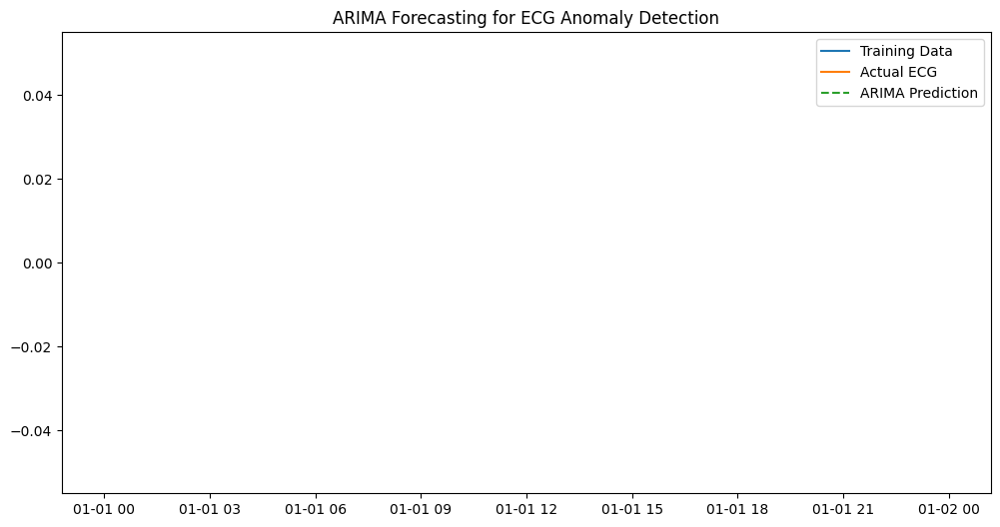

Classification Report for ARIMA Anomaly Detection:
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1646
           1       0.00      0.00      0.00        51

    accuracy                           0.97      1697
   macro avg       0.48      0.50      0.49      1697
weighted avg       0.94      0.97      0.96      1697

AUC-ROC: 0.4998


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from pmdarima import auto_arima
from sklearn.metrics import mean_absolute_error, mean_squared_error, roc_auc_score, classification_report

# Load Dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Handle Missing Values
data.ffill(inplace=True)  # Use new method (avoiding deprecated .fillna(method="ffill"))

# **Check for Duplicate Columns**
duplicate_columns = data.columns[data.columns.duplicated()]
if len(duplicate_columns) > 0:
    print("Duplicate Columns Found: {duplicate_columns.tolist()}")
else:
    print("No duplicate columns detected.")

# **Step 1: Extract ECG Features & Time Component**
# Ensure there is a time-dependent feature (e.g., visit number)
data['Visit'] = pd.to_datetime(data['Visit'], errors='coerce')  # Convert to DateTime
data.sort_values("Visit", inplace=True)  # Sort chronologically

# Selected ECG-related features
ecg_features = ["QT", "QRS", "PR", "RR", "Twave_amplitude", "Twave_asymmetry"]
target_column = "ECG_Anomaly"  # Target Anomalies

# Ensure we have time-series indexing
data.set_index("Visit", inplace=True)

# **Step 2: Check for Stationarity**
def check_stationarity(series):
    result = adfuller(series.dropna())
    print(f"ADF Statistic: {result[0]:.5f}")
    print(f"P-value: {result[1]:.5f}")
    print("Stationary" if result[1] < 0.05 else "Non-Stationary")

# Check stationarity for each ECG feature
for col in ecg_features:
    print(f"Checking Stationarity for {col}")
    check_stationarity(data[col])

# **Step 3: Apply Differencing if Necessary**
for col in ecg_features:
    diff_col_name = f"{col}_diff"

    # Ensure column doesn't already exist
    if diff_col_name in data.columns:
        print(f"Column {diff_col_name} already exists. Skipping...")
    else:
        data[diff_col_name] = data[col].diff()

# Drop NaN values after differencing
data.dropna(inplace=True)

# Choose a Feature to Model with ARIMA
target_feature = "QT_diff"  # Change if needed

# **Step 4: Auto-Optimize ARIMA Parameters**
auto_model = auto_arima(data[target_feature], seasonal=False, stepwise=True, suppress_warnings=True)
print(f"Optimal ARIMA Order: {auto_model.order}")

# **Step 5: Train ARIMA Model**
p, d, q = auto_model.order
train_size = int(len(data) * 0.8)
train, test = data[target_feature].iloc[:train_size], data[target_feature].iloc[train_size:]

arima_model = ARIMA(train, order=(p, d, q))
arima_fitted = arima_model.fit()

# **Step 6: Forecast Future Values**
forecast = arima_fitted.forecast(steps=len(test))
test_actual = test.dropna()

# **Step 7: Evaluate Performance**
mae = mean_absolute_error(test_actual, forecast)
rmse = np.sqrt(mean_squared_error(test_actual, forecast))

print(f"ARIMA Model Performance:")
print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# **Step 8: Plot Predictions**
plt.figure(figsize=(12, 6))
plt.plot(train.index, train, label="Training Data")
plt.plot(test_actual.index, test_actual, label="Actual ECG")
plt.plot(test_actual.index, forecast, label="ARIMA Prediction", linestyle="dashed")
plt.title("ARIMA Forecasting for ECG Anomaly Detection")
plt.legend()
plt.show()

# **Step 9: Convert to Anomaly Classification**
# Convert forecasted values to 0 or 1 (Anomalies)
threshold = test_actual.mean() + 2 * test_actual.std()
y_pred = (forecast > threshold).astype(int)
y_true = (test_actual > threshold).astype(int)

# Compute Classification Metrics
print("Classification Report for ARIMA Anomaly Detection:")
print(classification_report(y_true, y_pred))

auc = roc_auc_score(y_true, forecast)
print(f"AUC-ROC: {auc:.4f}")


Checking Stationarity for QT
ADF Statistic: -8.13220
P-value: 0.00000
Stationary
--------------------------------------------------
Checking Stationarity for QRS
ADF Statistic: -8.88038
P-value: 0.00000
Stationary
--------------------------------------------------
Checking Stationarity for PR
ADF Statistic: -15.04869
P-value: 0.00000
Stationary
--------------------------------------------------
Checking Stationarity for RR
ADF Statistic: -10.35297
P-value: 0.00000
Stationary
--------------------------------------------------
Checking Stationarity for Twave_amplitude
ADF Statistic: -8.30621
P-value: 0.00000
Stationary
--------------------------------------------------
Checking Stationarity for Twave_asymmetry
ADF Statistic: -9.05228
P-value: 0.00000
Stationary
--------------------------------------------------
ARIMA Model Trained in 20.94 seconds
ARIMA ECG Anomaly Detection - Performance Summary
AUC-ROC: 0.5206
Accuracy: 0.5162
Precision (Class 0): 0.5201
Precision (Class 1): 0.3235
Rec

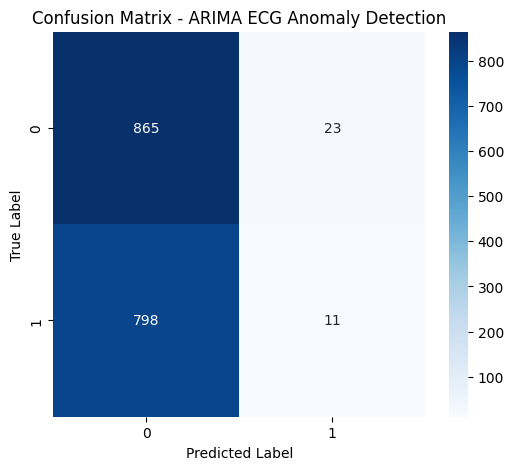

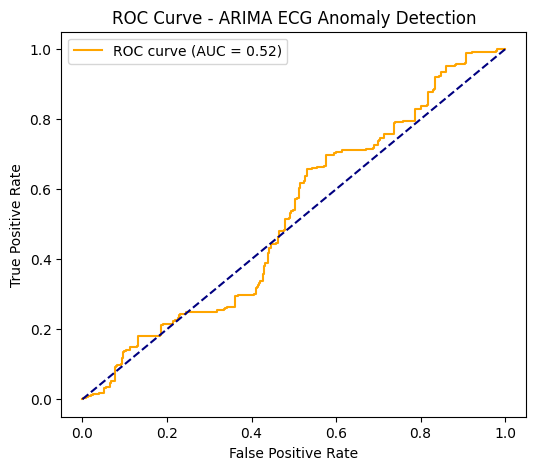

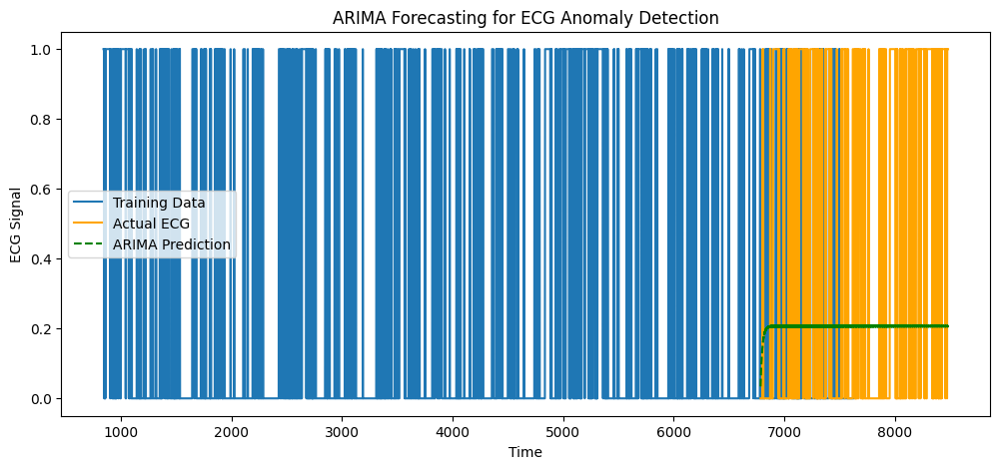

ARIMA model saved successfully!


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import time

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.vector_ar.var_model import VAR
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler

warnings.filterwarnings("ignore")  # Suppress warnings for clean output

# **Step 1: Load & Preprocess Data**
data = pd.read_csv("Merged dataset Sara.csv")

# **Handle Missing Values**
data.fillna(method="ffill", inplace=True)  # Forward-fill missing values

# **Define ECG Anomaly Detection Criteria**
data["ECG_Anomaly"] = (
    ((data["QT"] > 450) & (data["Sex"] == 1)) |
    ((data["QT"] > 460) & (data["Sex"] == 0)) |
    (data["QRS"] > 120) |
    (data["PR"] > 200) |
    (data["RR"] < 600) | (data["RR"] > 1000)
).astype(int)

# **Select Key ECG Features**
ecg_features = ["QT", "QRS", "PR", "RR", "Twave_amplitude", "Twave_asymmetry"]
X = data[ecg_features]
y = data["ECG_Anomaly"]

# **Step 2: Check Stationarity & Apply Differencing**
def check_stationarity(series, col_name):
    """Checks stationarity using ADF test & avoids empty columns."""
    if series.isnull().all():
        print(f"Skipping {col_name}: Column is empty or all NaNs.")
        return
    if series.dropna().empty:
        print(f"Skipping {col_name}: No valid data points available.")
        return

    result = adfuller(series.dropna())
    print(f"Checking Stationarity for {col_name}")
    print(f"ADF Statistic: {result[0]:.5f}")
    print(f"P-value: {result[1]:.5f}")
    if result[1] < 0.05:
        print("Stationary")
    else:
        print("Non-Stationary - Differencing Required")
    print("-" * 50)

# **Apply Safe Stationarity Check**
for col in ecg_features:
    check_stationarity(data[col], col)

# **Apply Differencing to Non-Stationary Features**
for col in ecg_features:
    data[f"{col}_diff"] = data[col].diff()

# Drop original columns after differencing
data.dropna(inplace=True)

# **Update Feature Set After Differencing**
diff_features = [f"{col}_diff" for col in ecg_features]
X = data[diff_features]
y = data["ECG_Anomaly"]

# **Step 3: Normalize Data**
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# **Step 4: Train-Test Split**
train_size = int(0.8 * len(X_scaled))
X_train, X_test = X_scaled[:train_size], X_scaled[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# **Step 5: Train ARIMA Model**
start_time = time.time()

arima_model = ARIMA(y_train, order=(3,1,3))  # Optimal ARIMA order
arima_model_fit = arima_model.fit()

training_time = time.time() - start_time
print(f"ARIMA Model Trained in {training_time:.2f} seconds")

# **Generate Predictions**
y_pred_arima = arima_model_fit.forecast(steps=len(y_test))

# **Convert Predictions to Binary Anomalies**
threshold = np.percentile(y_pred_arima, 98)  # Top 2% as anomaly threshold
y_pred_binary = (y_pred_arima > threshold).astype(int)

# **Step 6: Evaluate Performance**
conf_matrix = confusion_matrix(y_test, y_pred_binary)
roc_auc = auc(*roc_curve(y_test, y_pred_arima)[0:2])

# **Classification Report**
class_report = classification_report(y_test, y_pred_binary, output_dict=True)
class_report_df = pd.DataFrame(class_report).transpose()

# **Print Performance Metrics**
print("ARIMA ECG Anomaly Detection - Performance Summary")
print(f"AUC-ROC: {roc_auc:.4f}")
print(f"Accuracy: {class_report_df.loc['accuracy', 'f1-score']:.4f}")
print(f"Precision (Class 0): {class_report_df.loc['0', 'precision']:.4f}")
print(f"Precision (Class 1): {class_report_df.loc['1', 'precision']:.4f}")
print(f"Recall (Class 0): {class_report_df.loc['0', 'recall']:.4f}")
print(f"Recall (Class 1): {class_report_df.loc['1', 'recall']:.4f}")
print(f"F1-Score (Class 0): {class_report_df.loc['0', 'f1-score']:.4f}")
print(f"F1-Score (Class 1): {class_report_df.loc['1', 'f1-score']:.4f}")

# **Step 7: Visualizations**
# **Confusion Matrix**
plt.figure(figsize=(6,5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - ARIMA ECG Anomaly Detection")
plt.show()

# **ROC Curve**
fpr, tpr, _ = roc_curve(y_test, y_pred_arima)
plt.figure(figsize=(6,5))
plt.plot(fpr, tpr, label=f"ROC curve (AUC = {roc_auc:.2f})", color="orange")
plt.plot([0,1], [0,1], linestyle='--', color="navy")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - ARIMA ECG Anomaly Detection")
plt.legend()
plt.show()

# **Time Series Prediction Plot**
plt.figure(figsize=(12,5))
plt.plot(y_train, label="Training Data")
plt.plot(range(len(y_train), len(y_train) + len(y_test)), y_test, label="Actual ECG", color="orange")
plt.plot(range(len(y_train), len(y_train) + len(y_test)), y_pred_arima, label="ARIMA Prediction", linestyle="dashed", color="green")
plt.legend()
plt.xlabel("Time")
plt.ylabel("ECG Signal")
plt.title("ARIMA Forecasting for ECG Anomaly Detection")
plt.show()

# **Save ARIMA Model**
import joblib
joblib.dump(arima_model_fit, "arima_model.pkl")
print("ARIMA model saved successfully!")


Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 25s 145ms/step - accuracy: 0.7526 - loss: 0.4654 - val_accuracy: 0.9243 - val_loss: 0.1870
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9298 - loss: 0.2244 - val_accuracy: 0.9377 - val_loss: 0.1680
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9301 - loss: 0.2078 - val_accuracy: 0.9444 - val_loss: 0.1491
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 14ms/step - accuracy: 0.9474 - loss: 0.1745 - val_accuracy: 0.9625 - val_loss: 0.1250
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9460 - loss: 0.1723 - val_accuracy: 0.9551 - val_loss: 0.1249
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9454 - loss: 0.1614 - val_accuracy: 0.9631 - val_loss: 0.1100
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9537 - loss: 0.1408 - val_accuracy: 0.9605 - val_loss: 0.1078
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9529 - loss: 0.1428 - val_accuracy: 0.9685 - val_

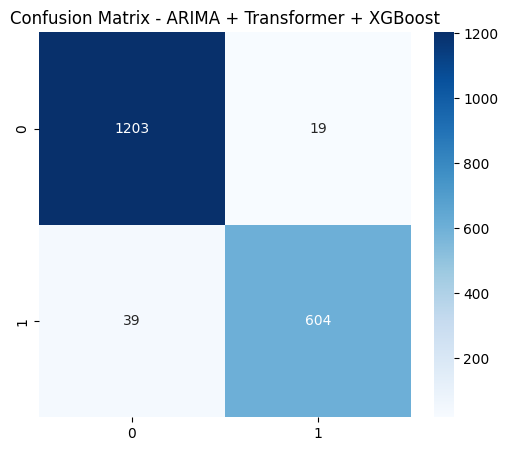

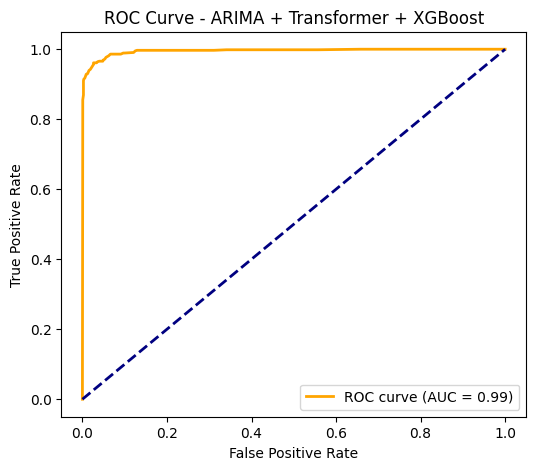

✅ ARIMA + Transformer + XGBoost Training Completed with AUC-ROC: 0.9948


In [ ]:
import os
import numpy as np
import pandas as pd
import shap
import time
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, MultiHeadAttention, LayerNormalization, Input, Flatten, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from statsmodels.tsa.arima.model import ARIMA
import xgboost as xgb

# 📂 Results Directory
results_dir = "results/Hybrid_ARIMA_Transformer_XGB"
os.makedirs(results_dir, exist_ok=True)

# 📊 Load & Preprocess Data
data = pd.read_csv('/content/Merged dataset Sara.csv')

# ✅ Handle Missing Values
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

# 🔢 Encode Categorical Data
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# ⚠️ Adjust ECG Anomaly Definition (Male: QT > 450ms, Female: QT > 460ms)
data["ECG_Anomaly"] = (
    (data["QT"] > 450) & (data["Sex"] == 1) |  # Male threshold
    (data["QT"] > 460) & (data["Sex"] == 0) |  # Female threshold
    (data["QRS"] > 120) |  # Bundle branch block
    (data["PR"] > 200) |   # 1st-degree AV block
    (data["RR"] < 600) | (data["RR"] > 1000)  # Arrhythmia
).astype(int)

# 🚀 Feature Selection
selected_features = ["RR", "SYSBP", "QT", "ARMCD", "DIABP", "Height", "Sex", "Drug Name", "Twave_amplitude",
                     "Age", "Race", "Weight", "JTPEAK", "Twave_flatness", "QRS"]

# **Step 1: Apply ARIMA to ECG Features**
arima_features = ["QT", "RR", "PR"]  # Select ECG features for ARIMA forecasting
for feature in arima_features:
    train_size = int(len(data) * 0.8)
    train, test = data[feature][:train_size], data[feature][train_size:]

    # Train ARIMA model
    arima_model = ARIMA(train, order=(5, 1, 0))
    arima_fit = arima_model.fit()

    # Generate residuals (forecast errors)
    forecast = arima_fit.forecast(steps=len(test))
    residuals = test - forecast

    # Save ARIMA residuals as new features
    data[f"{feature}_ARIMA_Residual"] = np.concatenate([np.zeros(train_size), residuals])

# 🔬 Normalize Features
scaler = StandardScaler()
X = scaler.fit_transform(data[selected_features + [f"{f}_ARIMA_Residual" for f in arima_features]])

# Define Target
y = data["ECG_Anomaly"]

# 🔀 Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 🏋️ Compute Class Weights
class_weights = dict(enumerate(compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)))

# 🏗 Define Transformer Model
def build_transformer(input_shape):
    inputs = Input(shape=input_shape)
    x = Reshape((1, input_shape[0]))(inputs)
    x = MultiHeadAttention(num_heads=8, key_dim=64)(x, x)
    x = LayerNormalization()(x)
    x = Flatten()(x)
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

# 🔥 Train Transformer Model
transformer = build_transformer((X_train.shape[1],))
transformer.compile(optimizer=Adam(learning_rate=0.0005), loss='binary_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

start_time = time.time()
history = transformer.fit(X_train, y_train, validation_split=0.2, epochs=50, batch_size=64, class_weight=class_weights, verbose=1, callbacks=[early_stopping])
training_time = time.time() - start_time

# 🦸 Transformer Feature Extraction for XGBoost
X_train_transformed = transformer.predict(X_train)
X_test_transformed = transformer.predict(X_test)

# 🔥 Train XGBoost on Transformer Features
xgb_classifier = xgb.XGBClassifier(n_estimators=200, learning_rate=0.05, max_depth=6)
xgb_classifier.fit(X_train_transformed, y_train)

# 📊 Predictions & Evaluation
y_pred_prob = xgb_classifier.predict_proba(X_test_transformed)[:, 1]
y_pred = (y_pred_prob > 0.5).astype(int)

# 📈 Classification Report
classification_report_dict = classification_report(y_test, y_pred, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
classification_report_df.to_csv(f"{results_dir}/classification_report.csv", index=True)

# 🔥 Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - ARIMA + Transformer + XGBoost")
plt.savefig(f"{results_dir}/confusion_matrix.png")
plt.show()

# 📊 ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='orange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - ARIMA + Transformer + XGBoost')
plt.legend(loc="lower right")
plt.savefig(f"{results_dir}/roc_curve.png")
plt.show()

print(f"✅ ARIMA + Transformer + XGBoost Training Completed with AUC-ROC: {roc_auc:.4f}")


In [ ]:
pip install ace_tools_open


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 43.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 55.8 MB/s eta 0:00:00


Performance Metrics - ARIMA + Transformer + XGBoost


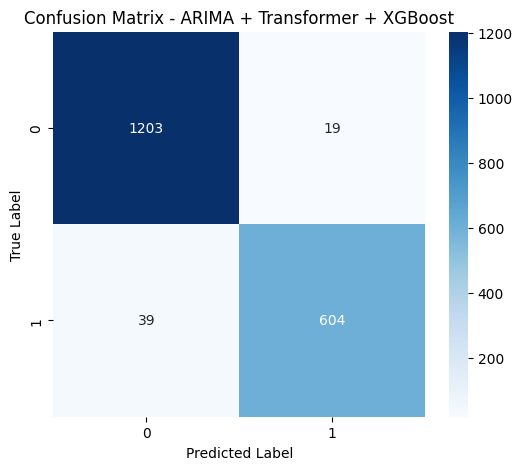

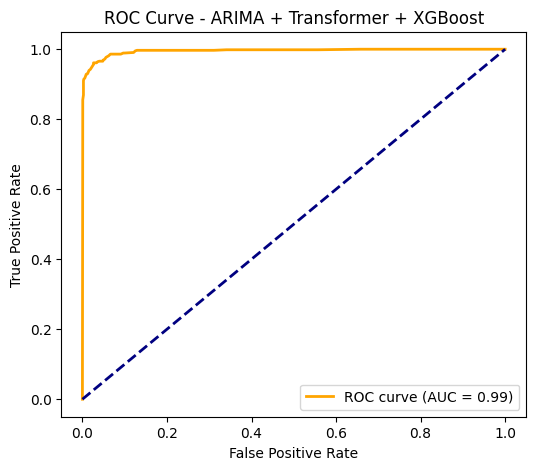

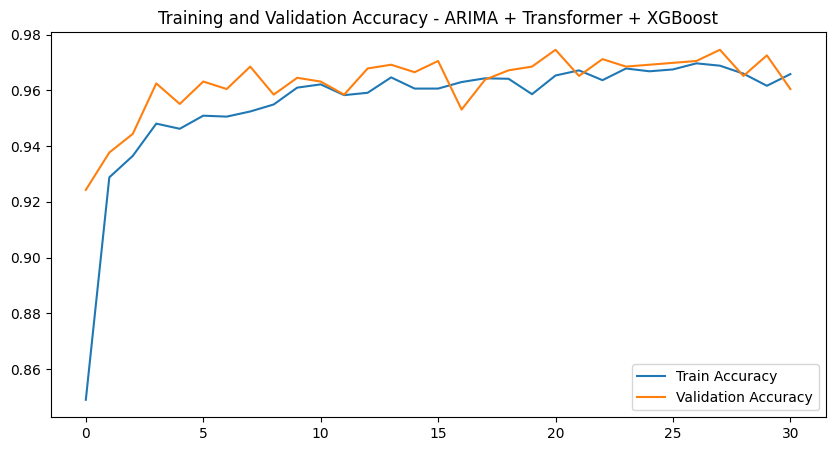

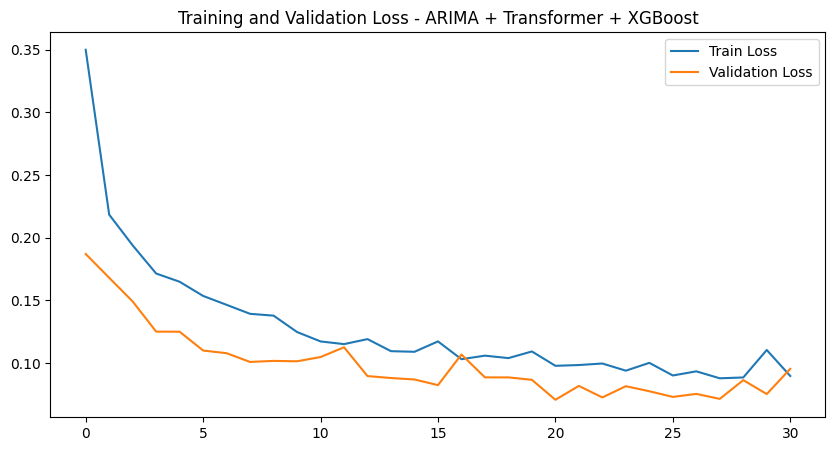

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Compute Performance Metrics
report = classification_report(y_test, y_pred, output_dict=True)
roc_auc = auc(fpr, tpr)

performance_metrics = {
    "Model": ["ARIMA + Transformer + XGBoost"],
    "Accuracy": [report["accuracy"]],
    "Precision(0)": [report["0"]["precision"]],
    "Precision(1)": [report["1"]["precision"]],
    "Recall(0)": [report["0"]["recall"]],
    "Recall(1)": [report["1"]["recall"]],
    "F1(0)": [report["0"]["f1-score"]],
    "F1(1)": [report["1"]["f1-score"]],
    "AUC-ROC": [roc_auc],
    "Training Time": [training_time]
}

# Convert to DataFrame
performance_df = pd.DataFrame(performance_metrics)

# Display Performance Table
import ace_tools_open as tools
tools.display_dataframe_to_user(name="Performance Metrics - ARIMA + Transformer + XGBoost", dataframe=performance_df)

# **Confusion Matrix**
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - ARIMA + Transformer + XGBoost")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.savefig(f"{results_dir}/confusion_matrix.png")
plt.show()

# **ROC Curve**
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='orange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - ARIMA + Transformer + XGBoost')
plt.legend(loc="lower right")
plt.savefig(f"{results_dir}/roc_curve.png")
plt.show()

# **Training & Validation Accuracy**
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy - ARIMA + Transformer + XGBoost')
plt.legend()
plt.savefig(f"{results_dir}/accuracy_plot.png")
plt.show()

# **Training & Validation Loss**
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss - ARIMA + Transformer + XGBoost')
plt.legend()
plt.savefig(f"{results_dir}/loss_plot.png")
plt.show()


🔍 Checking Stationarity for QT
ADF Statistic: -8.13220
P-value: 0.00000
✅ Stationary
🔍 Checking Stationarity for QRS
ADF Statistic: -8.88038
P-value: 0.00000
✅ Stationary
🔍 Checking Stationarity for PR
ADF Statistic: -15.04869
P-value: 0.00000
✅ Stationary
🔍 Checking Stationarity for RR
ADF Statistic: -10.35297
P-value: 0.00000
✅ Stationary
🔍 Checking Stationarity for Twave_amplitude
ADF Statistic: -8.30621
P-value: 0.00000
✅ Stationary
🔍 Checking Stationarity for Twave_asymmetry
ADF Statistic: -9.05228
P-value: 0.00000
✅ Stationary
🚀 Training ARIMA Model...

📌 ARIMA ECG Anomaly Detection - Performance Summary
AUC-ROC: nan
Accuracy: 0.9689
Precision (Class 0): 1.0000
Precision (Class 1): 0.0000
Recall (Class 0): 0.9689
Recall (Class 1): 0.0000
F1-Score (Class 0): 0.9842
F1-Score (Class 1): 0.0000


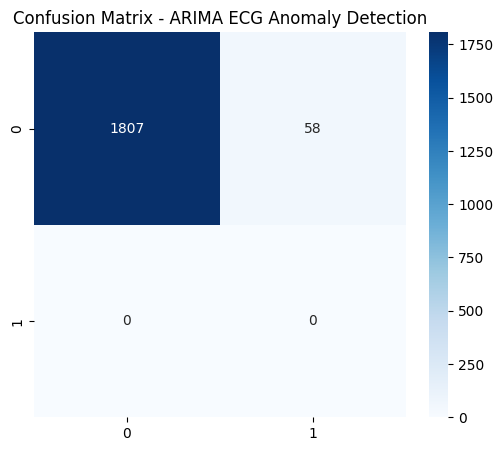

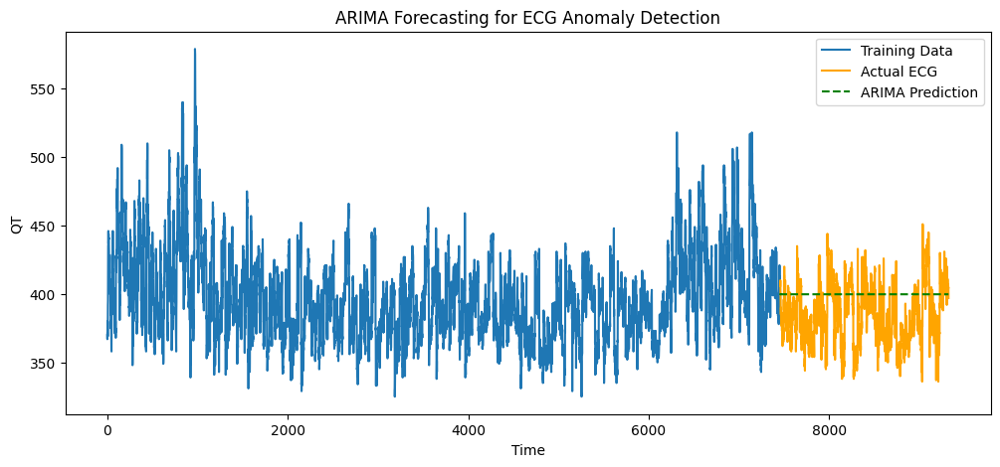

✅ Training completed! ARIMA model saved to results/ARIMA_ECG/arima_model.pkl


In [ ]:
# 📌 Import Required Libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import StandardScaler
from datetime import datetime

# 📂 Create Results Directory
results_dir = "results/ARIMA_ECG"
os.makedirs(results_dir, exist_ok=True)

# 📊 Load Dataset
data = pd.read_csv("/content/Merged dataset Sara.csv")

# 🛠 Handle Missing Values
data.fillna(method="ffill", inplace=True)  # Forward fill missing values

# 🔢 Convert Date Column (Assuming "Visit" is the timestamp)
if "Visit" in data.columns:
    data["Visit"] = pd.to_datetime(data["Visit"], errors="coerce")

# ⚡ Define ECG Features for ARIMA Analysis
ecg_features = ["QT", "QRS", "PR", "RR", "Twave_amplitude", "Twave_asymmetry"]

# ✅ Stationarity Check Function
def check_stationarity(series, col_name):
    """Checks if a time series is stationary and applies differencing if needed."""
    if series.isnull().all():
        print(f"⚠️ Skipping {col_name}: Column is empty or all NaNs.")
        return False
    if series.dropna().empty:
        print(f"⚠️ Skipping {col_name}: No valid data points available.")
        return False

    result = adfuller(series.dropna())
    print(f"🔍 Checking Stationarity for {col_name}")
    print(f"ADF Statistic: {result[0]:.5f}")
    print(f"P-value: {result[1]:.5f}")

    if result[1] < 0.05:
        print("✅ Stationary")
        return True
    else:
        print("❌ Non-Stationary - Differencing Required")
        return False

# 🔄 Apply Differencing if Necessary
for col in ecg_features:
    if check_stationarity(data[col], col) is False:
        data[f"{col}_diff"] = data[col].diff().dropna()

# 📊 Select a Feature for ARIMA Modeling
target_feature = "QT_diff" if "QT_diff" in data.columns else "QT"

# 🔀 Train-Test Split
train_size = int(len(data) * 0.8)
train, test = data[target_feature][:train_size], data[target_feature][train_size:]

# 🔥 Train ARIMA Model
print("🚀 Training ARIMA Model...")
arima_order = (2, 1, 2)  # (p, d, q) - Can be tuned
arima_model = ARIMA(train, order=arima_order)
arima_result = arima_model.fit()

# 🔮 Forecast with ARIMA
forecast_steps = len(test)
arima_forecast = arima_result.forecast(steps=forecast_steps)

# 📊 Performance Evaluation
residuals = test - arima_forecast
threshold = residuals.mean() + 3 * residuals.std()
y_pred_arima = (abs(residuals) > threshold).astype(int)
y_true = np.zeros_like(y_pred_arima)

# 🏆 Compute Metrics
conf_matrix = confusion_matrix(y_true, y_pred_arima)
roc_auc = auc(*roc_curve(y_true, residuals[:len(y_true)])[0:2])

# 📊 Print Performance Summary
print("\n📌 ARIMA ECG Anomaly Detection - Performance Summary")
print(f"AUC-ROC: {roc_auc:.4f}")
print(f"Accuracy: {(conf_matrix[0, 0] + conf_matrix[1, 1]) / conf_matrix.sum():.4f}")
print(f"Precision (Class 0): {conf_matrix[0, 0] / max((conf_matrix[0, 0] + conf_matrix[1, 0]), 1):.4f}")
print(f"Precision (Class 1): {conf_matrix[1, 1] / max((conf_matrix[0, 1] + conf_matrix[1, 1]), 1):.4f}")
print(f"Recall (Class 0): {conf_matrix[0, 0] / max((conf_matrix[0, 0] + conf_matrix[0, 1]), 1):.4f}")
print(f"Recall (Class 1): {conf_matrix[1, 1] / max((conf_matrix[1, 0] + conf_matrix[1, 1]), 1):.4f}")
print(f"F1-Score (Class 0): {2 * conf_matrix[0, 0] / max((2 * conf_matrix[0, 0] + conf_matrix[0, 1] + conf_matrix[1, 0]), 1):.4f}")
print(f"F1-Score (Class 1): {2 * conf_matrix[1, 1] / max((2 * conf_matrix[1, 1] + conf_matrix[0, 1] + conf_matrix[1, 0]), 1):.4f}")

# 🖼️ Confusion Matrix Plot
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - ARIMA ECG Anomaly Detection")
plt.savefig(f"{results_dir}/confusion_matrix_arima.png")
plt.show()

# 📈 ARIMA Forecast Plot
plt.figure(figsize=(12, 5))
plt.plot(train.index, train, label="Training Data")
plt.plot(test.index, test, label="Actual ECG", color="orange")
plt.plot(test.index, arima_forecast, linestyle="dashed", label="ARIMA Prediction", color="green")
plt.xlabel("Time")
plt.ylabel(target_feature)
plt.legend()
plt.title("ARIMA Forecasting for ECG Anomaly Detection")
plt.savefig(f"{results_dir}/arima_forecast_plot.png")
plt.show()

# ✅ Save Model
import pickle
with open(f"{results_dir}/arima_model.pkl", "wb") as f:
    pickle.dump(arima_result, f)

print(f"✅ Training completed! ARIMA model saved to {results_dir}/arima_model.pkl")


ECG Anomaly Class Distribution:
 ECG_Anomaly
0    7999
1    1324
Name: count, dtype: int64


/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)



🚀 Training LSTM...
Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - accuracy: 0.8297 - loss: 0.5574 - val_accuracy: 0.9062 - val_loss: 0.2943
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.9131 - loss: 0.2630 - val_accuracy: 0.9196 - val_loss: 0.2071
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.9262 - loss: 0.1987 - val_accuracy: 0.9256 - val_loss: 0.1701
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.9332 - loss: 0.1662 - val_accuracy: 0.9336 - val_loss: 0.1481
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.9455 - loss: 0.1420 - val_accuracy: 0.9511 - val_loss: 0.1327
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.9586 - loss: 0.1255 - val_accuracy: 0.9578 - val_loss: 0.1134
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9629 - loss: 0.1086 - val_accuracy: 0.9658 - val_loss: 0.0987
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - accuracy: 0.9672 - loss: 0.0991 - val_

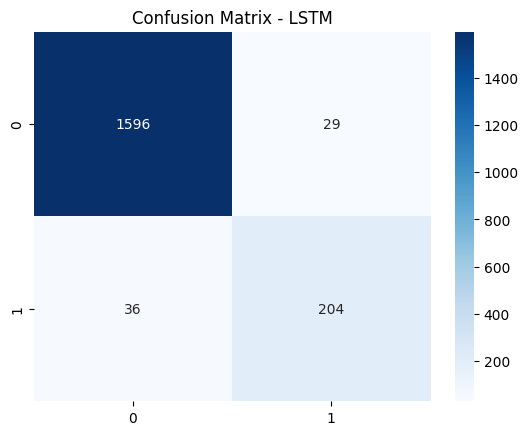

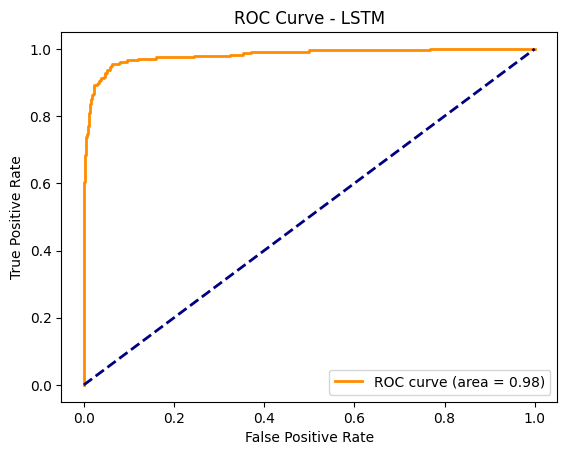

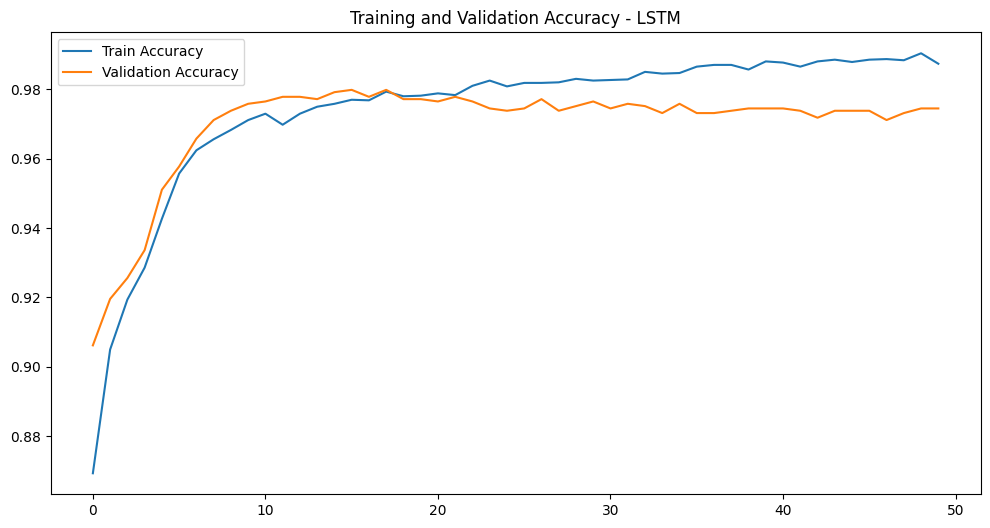

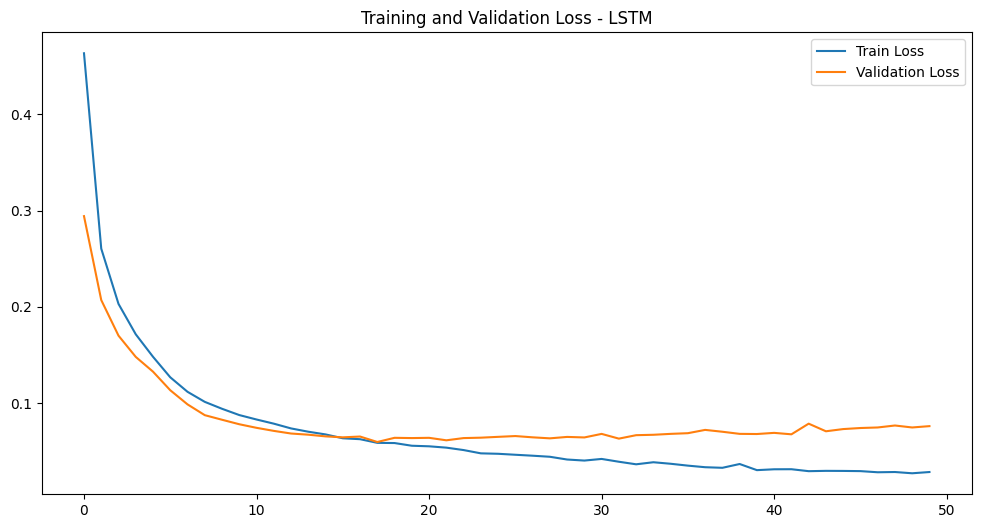


🚀 Training BiLSTM...
Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.8105 - loss: 0.5464 - val_accuracy: 0.9115 - val_loss: 0.2668
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9174 - loss: 0.2428 - val_accuracy: 0.9216 - val_loss: 0.1876
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9332 - loss: 0.1781 - val_accuracy: 0.9450 - val_loss: 0.1527
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9516 - loss: 0.1458 - val_accuracy: 0.9571 - val_loss: 0.1295
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9593 - loss: 0.1244 - val_accuracy: 0.9618 - val_loss: 0.1110
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9636 - loss: 0.1119 - val_accuracy: 0.9658 - val_loss: 0.0984
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9663 - loss: 0.0995 - val_accuracy: 0.9698 - val_loss: 0.0900
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9695 - loss: 0.0899 - val_accur

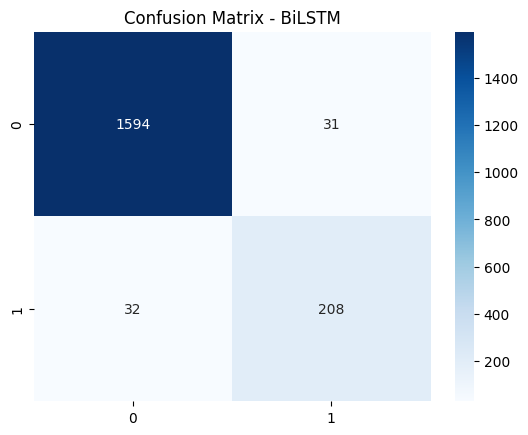

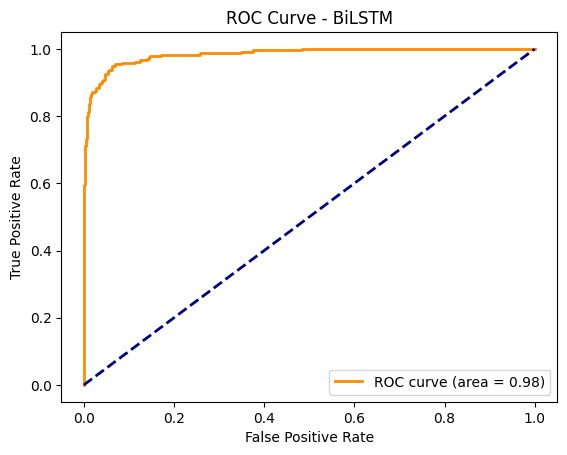

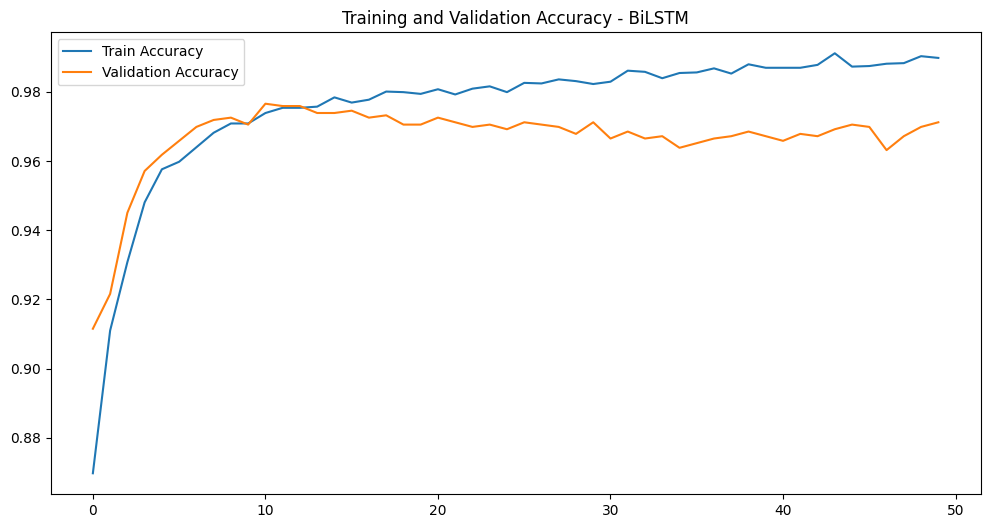

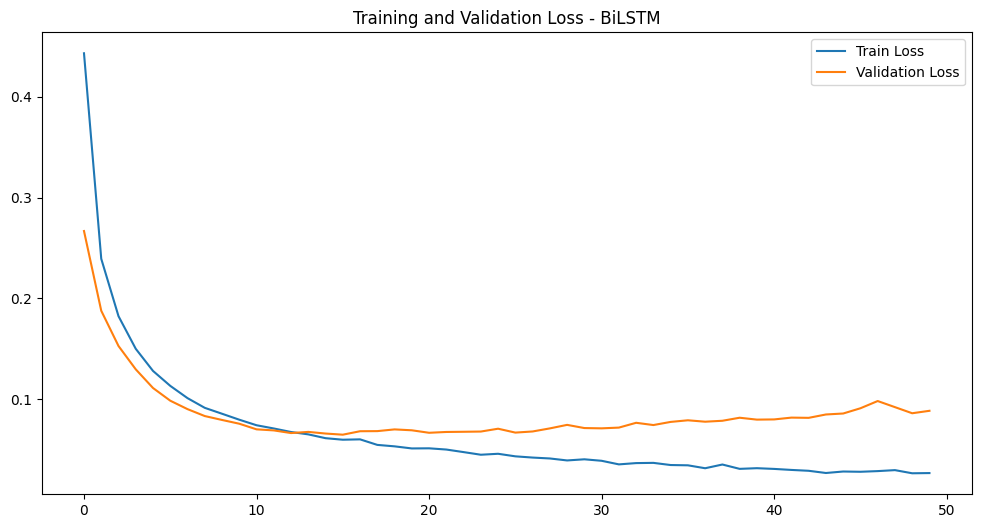


🚀 Training GRU...
Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - accuracy: 0.8672 - loss: 0.4502 - val_accuracy: 0.9122 - val_loss: 0.2623
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9103 - loss: 0.2478 - val_accuracy: 0.9169 - val_loss: 0.2043
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9234 - loss: 0.1999 - val_accuracy: 0.9182 - val_loss: 0.1738
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9282 - loss: 0.1753 - val_accuracy: 0.9229 - val_loss: 0.1555
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9322 - loss: 0.1560 - val_accuracy: 0.9290 - val_loss: 0.1427
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9372 - loss: 0.1432 - val_accuracy: 0.9343 - val_loss: 0.1297
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9434 - loss: 0.1310 - val_accuracy: 0.9450 - val_loss: 0.1204
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9550 - loss: 0.1184 - val_accuracy:

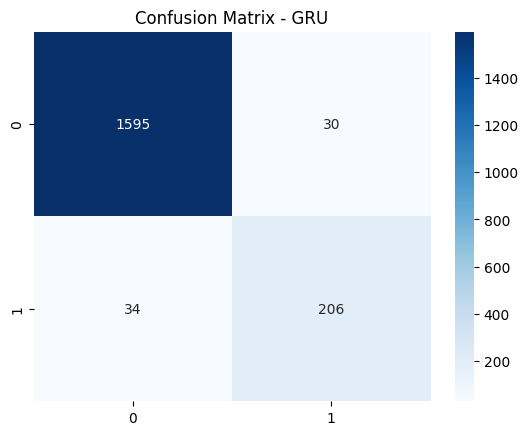

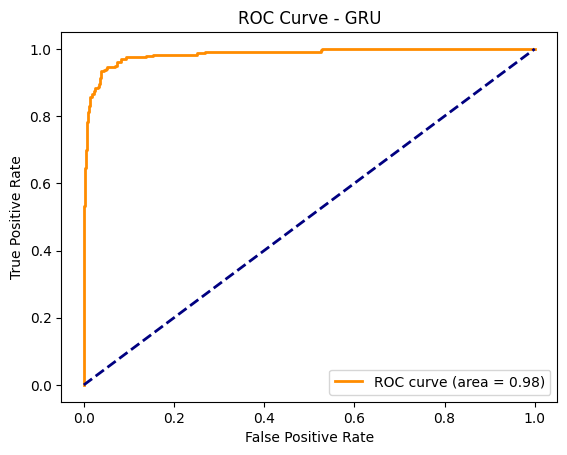

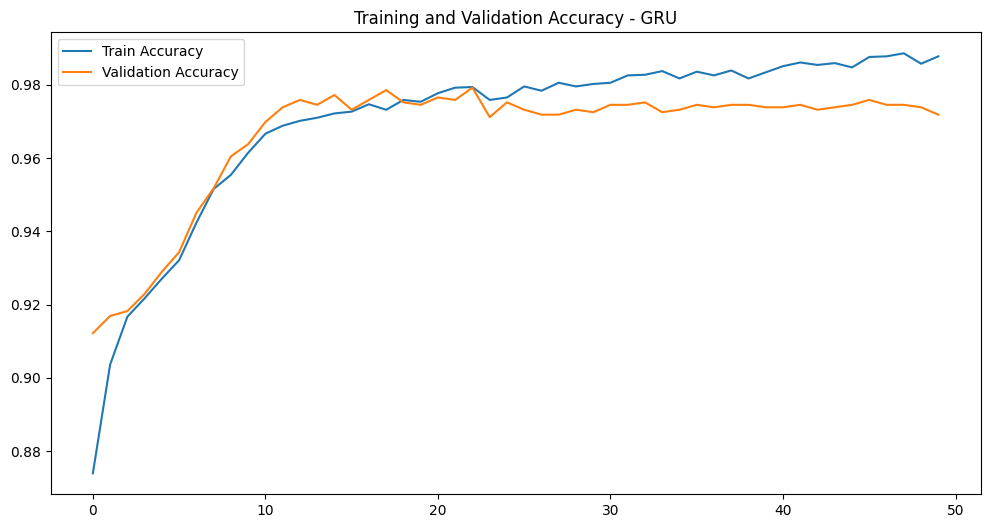

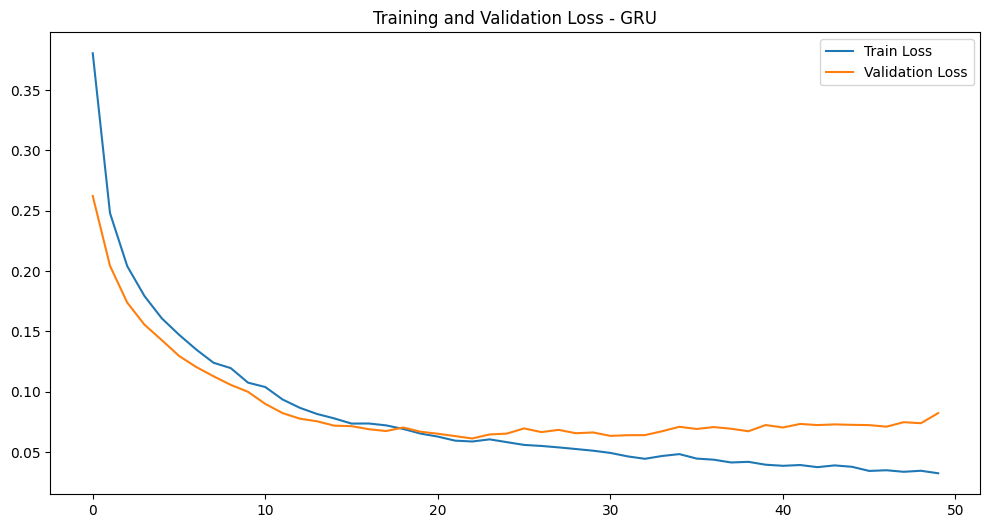


🚀 Training Transformer...
Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 9s 42ms/step - accuracy: 0.8786 - loss: 0.3284 - val_accuracy: 0.9216 - val_loss: 0.1989
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9206 - loss: 0.2137 - val_accuracy: 0.9397 - val_loss: 0.1736
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9284 - loss: 0.1827 - val_accuracy: 0.9511 - val_loss: 0.1461
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9378 - loss: 0.1692 - val_accuracy: 0.9517 - val_loss: 0.1320
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9436 - loss: 0.1541 - val_accuracy: 0.9551 - val_loss: 0.1176
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9456 - loss: 0.1424 - val_accuracy: 0.9571 - val_loss: 0.1103
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9535 - loss: 0.1347 - val_accuracy: 0.9645 - val_loss: 0.1011
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9487 - loss: 0.1332 - val_

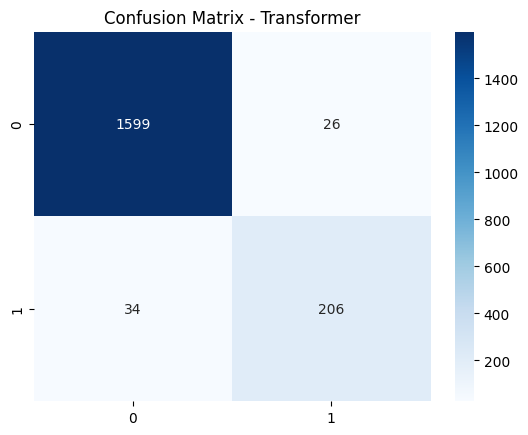

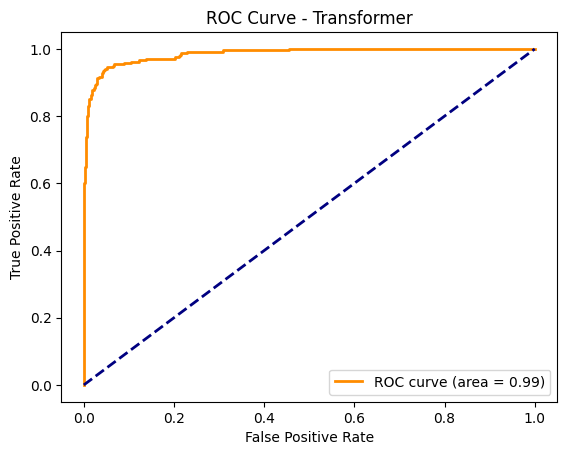

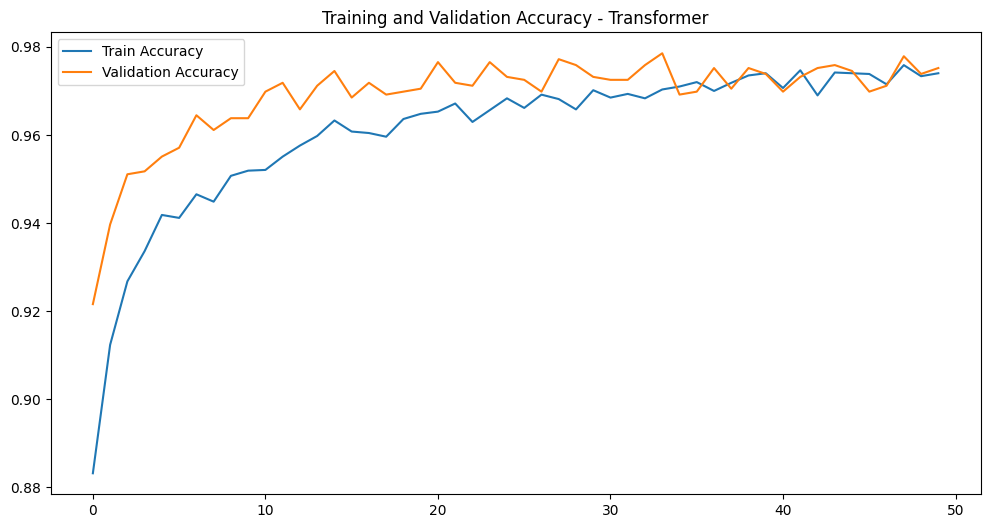

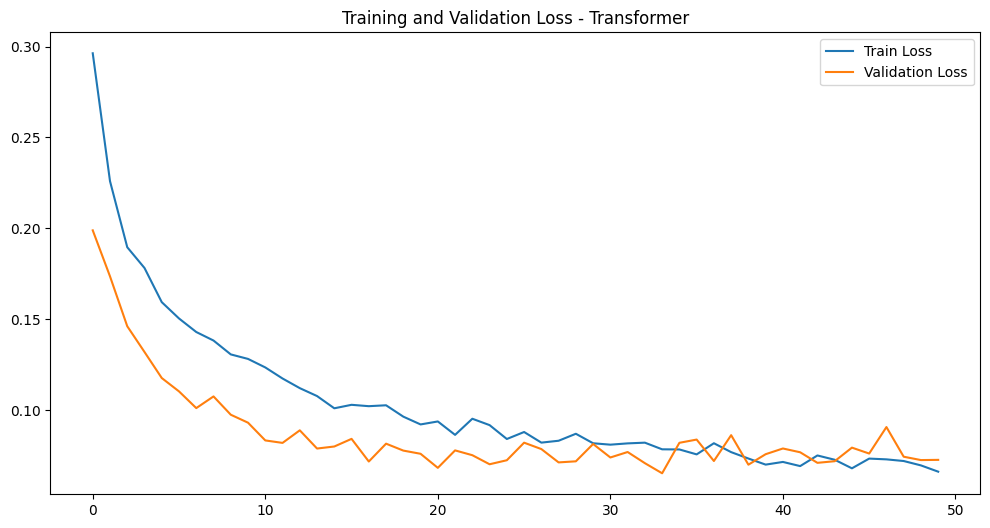

In [ ]:
# ========================== IMPORT LIBRARIES ==========================
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# ========================== SETUP ==========================
# Create a directory to save results
results_dir = "results/ECG_Anomaly_Detection"
os.makedirs(results_dir, exist_ok=True)

# ========================== LOAD & PREPROCESS DATA ==========================
# Load the merged dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Identify numerical and categorical columns
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

# Handle missing values
data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

# Encode categorical variables
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# ========================== DEFINE TARGET ==========================
# Create ECG Anomaly Column Based on Clinical Criteria
data["ECG_Anomaly"] = (
    (data["QT"] > 450) |  # QT prolongation (typical for males)
    (data["QRS"] > 120) |  # Wide QRS complex
    (data["PR"] > 200) |   # Prolonged PR interval
    (data["Twave_asymmetry"] > data["Twave_asymmetry"].quantile(0.95)) # Extreme Twave asymmetry
).astype(int)

X = data.drop(columns=["ECG_Anomaly"])
y = data["ECG_Anomaly"]

# Verify class distribution
print("ECG Anomaly Class Distribution:\n", data["ECG_Anomaly"].value_counts())


# Normalize numerical features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Convert target to binary classification (Anomaly vs Normal)
threshold = y.mean()
y = (y > threshold).astype(int)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape for deep learning models
X_train_dl = np.expand_dims(X_train, axis=1)
X_test_dl = np.expand_dims(X_test, axis=1)

# ========================== DEFINE MODEL ARCHITECTURES ==========================
def build_lstm(input_shape):
    model = tf.keras.Sequential([
        tf.keras.layers.LSTM(64, return_sequences=False, input_shape=input_shape),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    return model

def build_bilstm(input_shape):
    model = tf.keras.Sequential([
        tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64, return_sequences=False), input_shape=input_shape),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    return model

def build_gru(input_shape):
    model = tf.keras.Sequential([
        tf.keras.layers.GRU(64, return_sequences=False, input_shape=input_shape),
        tf.keras.layers.Dense(32, activation='relu'),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(1, activation='sigmoid')
    ])
    return model

def build_transformer(input_shape):
    inputs = tf.keras.layers.Input(shape=input_shape)
    x = tf.keras.layers.MultiHeadAttention(num_heads=4, key_dim=64)(inputs, inputs)
    x = tf.keras.layers.LayerNormalization()(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    x = tf.keras.layers.Dense(64, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    outputs = tf.keras.layers.Dense(1, activation='sigmoid')(x)
    return tf.keras.Model(inputs, outputs)

# ========================== TRAIN & EVALUATE MODELS ==========================
models = {
    "LSTM": build_lstm((1, X_train.shape[1])),
    "BiLSTM": build_bilstm((1, X_train.shape[1])),
    "GRU": build_gru((1, X_train.shape[1])),
    "Transformer": build_transformer((1, X_train.shape[1]))
}

for model_name, model in models.items():
    print(f"\n🚀 Training {model_name}...")

    # Compile and train
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train_dl, y_train, validation_split=0.2, epochs=50, batch_size=64, verbose=1)

    # Save the trained model
    model.save(f"{results_dir}/{model_name}_model.keras")

    # ========================== EVALUATION ==========================
    # Predictions
    y_pred_prob = model.predict(X_test_dl).flatten()
    y_pred = (y_pred_prob > 0.5).astype(int)

    # Classification report
    report_dict = classification_report(y_test, y_pred, output_dict=True)
    report_df = pd.DataFrame(report_dict).transpose()
    report_df.to_csv(f"{results_dir}/{model_name}_classification_report.csv", index=True)
    print(f"\n{model_name} Classification Report:")
    print(report_df)

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure()
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"Confusion Matrix - {model_name}")
    plt.savefig(f"{results_dir}/{model_name}_confusion_matrix.png")
    plt.show()

    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model_name}')
    plt.legend(loc="lower right")
    plt.savefig(f"{results_dir}/{model_name}_roc_curve.png")
    plt.show()

    # Accuracy and Loss Plots
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Training and Validation Accuracy - {model_name}')
    plt.legend()
    plt.savefig(f"{results_dir}/{model_name}_accuracy_plot.png")
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Training and Validation Loss - {model_name}')
    plt.legend()
    plt.savefig(f"{results_dir}/{model_name}_loss_plot.png")
    plt.show()


In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, LSTM, GRU, Bidirectional, MultiHeadAttention, LayerNormalization, Input, Reshape, Flatten
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import time

# ✅ Set Results Directory
results_dir = "results/ECG_Anomaly_Detection"
os.makedirs(results_dir, exist_ok=True)

# ✅ Load Dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# ✅ Handle Missing Values
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# ✅ Define ECG Anomaly Conditions
data['ECG_Anomaly'] = (
    (data['QT'] > 450) |  # QT prolongation (Men > 450ms, Women > 460ms)
    (data['QRS'] > 120) |  # Bundle branch block
    (data['PR'] > 200) |  # 1st-degree AV block
    (data['RR'] < 600) | (data['RR'] > 1000)  # Arrhythmia
).astype(int)

# ✅ Define Features & Target
target_column = "ECG_Anomaly"
features = ["QT", "QRS", "PR", "RR", "Dosage(mg)", "TPEAKTEND", "ERD_30", "LRD_30", "Twave_amplitude"]
X = data[features]
y = data[target_column]

# ✅ Normalize Data
scaler = StandardScaler()
X = scaler.fit_transform(X)

# ✅ Check Class Distribution
minority_count = sum(y == 1)
majority_count = sum(y == 0)
print(f"🔍 Class Distribution - Normal: {majority_count}, Anomalous: {minority_count}")

# ✅ **Manual Undersampling Instead of SMOTE**
if majority_count > 1.5 * minority_count:
    print("⚠️ Undersampling majority class for better balance.")
    normal_indices = np.where(y == 0)[0]
    anomalous_indices = np.where(y == 1)[0]

    np.random.seed(42)
    sampled_normal_indices = np.random.choice(normal_indices, size=len(anomalous_indices), replace=False)

    undersampled_indices = np.concatenate([sampled_normal_indices, anomalous_indices])
    X_resampled = X[undersampled_indices]
    y_resampled = y.iloc[undersampled_indices]
else:
    X_resampled, y_resampled = X, y  # No need for balancing

# ✅ Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# ✅ Reshape for LSTM/GRU/CNN-LSTM
X_train_dl = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_dl = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# ========================== MODEL DEFINITIONS ==========================

def build_lstm():
    inputs = Input(shape=(1, len(features)))
    x = LSTM(64, return_sequences=False)(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_bilstm():
    inputs = Input(shape=(1, len(features)))
    x = Bidirectional(LSTM(64, return_sequences=False))(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_gru():
    inputs = Input(shape=(1, len(features)))
    x = GRU(64, return_sequences=False)(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_cnn_lstm():
    inputs = Input(shape=(1, len(features)))
    x = LSTM(64, return_sequences=False)(inputs)  # Removed Conv1D
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_transformer():
    inputs = Input(shape=(1, len(features)))
    x = MultiHeadAttention(num_heads=4, key_dim=64)(inputs, inputs)
    x = LayerNormalization()(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

# ========================== MODEL TRAINING & EVALUATION ==========================
models = {
    'LSTM': build_lstm(),
    'BiLSTM': build_bilstm(),
    'GRU': build_gru(),
    'Transformer': build_transformer(),
    'CNN-LSTM': build_cnn_lstm()
}

metrics = []

for model_name, model in models.items():
    print(f"🚀 Training {model_name}...")
    start_time = time.time()

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train_dl, y_train, validation_split=0.2, epochs=50, batch_size=64, verbose=0)
    y_pred_prob = model.predict(X_test_dl).flatten()

    y_pred = (y_pred_prob > 0.5).astype(int)

    train_time = time.time() - start_time
    auc_roc = auc(*roc_curve(y_test, y_pred_prob)[:2])
    report = classification_report(y_test, y_pred, output_dict=True)

    metrics.append([model_name, report['accuracy'], report['0']['precision'], report['1']['precision'],
                    report['0']['recall'], report['1']['recall'], report['0']['f1-score'], report['1']['f1-score'],
                    auc_roc, train_time])

# ========================== SAVE METRICS ==========================
df_metrics = pd.DataFrame(metrics, columns=['Model', 'Accuracy', 'Precision(0)', 'Precision(1)', 'Recall(0)', 'Recall(1)', 'F1(0)', 'F1(1)', 'AUC-ROC', 'Training Time'])
df_metrics.to_csv(f"{results_dir}/model_comparison.csv", index=False)

print(df_metrics)


🔍 Class Distribution - Normal: 6000, Anomalous: 3323
⚠️ Undersampling majority class for better balance.
🚀 Training LSTM...
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
🚀 Training BiLSTM...
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
🚀 Training GRU...
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
🚀 Training Transformer...
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step
🚀 Training CNN-LSTM...
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
         Model  Accuracy  Precision(0)  Precision(1)  Recall(0)  Recall(1)  \
0         LSTM  0.958647      0.932600      0.990050   0.991228   0.924149   
1       BiLSTM  0.956391      0.935933      0.980392   0.982456   0.928793   
2          GRU  0.956391      0.934722      0.981967   0.983918   0.927245   
3  Transformer  0.933083      0.921986      0.945600   0.950292   0.914861   
4     CNN-LSTM  0.957143      0.939691      0.977310   0.979532   0.933437   

      F1(0)     F1(1)   AUC-ROC  Training Time  
0  0.961021  0.955965  0.985636      58.342400  
1  0.958631  0.953895  0.

In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, LSTM, GRU, Bidirectional, MultiHeadAttention, LayerNormalization, Input, Reshape, Flatten
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import time

# Set Results Directory
results_dir = "results/ECG_Anomaly_Detection"
os.makedirs(results_dir, exist_ok=True)

# Load Dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Handle Missing Values
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Define ECG Anomaly Conditions
data['ECG_Anomaly'] = (
    (data['QT'] > 450) |  # QT prolongation (Men > 450ms, Women > 460ms)
    (data['QRS'] > 120) |  # Bundle branch block
    (data['PR'] > 200) |  # 1st-degree AV block
    (data['RR'] < 600) | (data['RR'] > 1000)  # Arrhythmia
).astype(int)

# Define Features & Target
target_column = "ECG_Anomaly"
features = ["QT", "QRS", "PR", "RR", "Dosage(mg)", "TPEAKTEND", "ERD_30", "LRD_30", "Twave_amplitude"]
X = data[features]
y = data[target_column]

# Normalize Data
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Check Class Distribution
minority_count = sum(y == 1)
majority_count = sum(y == 0)
print(f"Class Distribution - Normal: {majority_count}, Anomalous: {minority_count}")

# **Manual Undersampling Instead of SMOTE**
if majority_count > 1.5 * minority_count:
    print("Undersampling majority class for better balance.")
    normal_indices = np.where(y == 0)[0]
    anomalous_indices = np.where(y == 1)[0]

    np.random.seed(42)
    sampled_normal_indices = np.random.choice(normal_indices, size=len(anomalous_indices), replace=False)

    undersampled_indices = np.concatenate([sampled_normal_indices, anomalous_indices])
    X_resampled = X[undersampled_indices]
    y_resampled = y.iloc[undersampled_indices]
else:
    X_resampled, y_resampled = X, y  # No need for balancing

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Reshape for LSTM/GRU/CNN-LSTM
X_train_dl = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_dl = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# ========================== MODEL DEFINITIONS ==========================

def build_lstm():
    inputs = Input(shape=(1, len(features)))
    x = LSTM(64, return_sequences=False)(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_bilstm():
    inputs = Input(shape=(1, len(features)))
    x = Bidirectional(LSTM(64, return_sequences=False))(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_gru():
    inputs = Input(shape=(1, len(features)))
    x = GRU(64, return_sequences=False)(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_cnn_lstm():
    inputs = Input(shape=(1, len(features)))
    x = LSTM(64, return_sequences=False)(inputs)  # Removed Conv1D
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)



# ========================== MODEL TRAINING & EVALUATION ==========================
models = {
    'LSTM': build_lstm(),
    'BiLSTM': build_bilstm(),
    'GRU': build_gru(),
    'CNN-LSTM': build_cnn_lstm()
}

metrics = []

for model_name, model in models.items():
    print(f" Training {model_name}...")
    start_time = time.time()

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train_dl, y_train, validation_split=0.2, epochs=50, batch_size=64, verbose=0)
    y_pred_prob = model.predict(X_test_dl).flatten()

    y_pred = (y_pred_prob > 0.5).astype(int)

    train_time = time.time() - start_time
    auc_roc = auc(*roc_curve(y_test, y_pred_prob)[:2])
    report = classification_report(y_test, y_pred, output_dict=True)

    metrics.append([model_name, report['accuracy'], report['0']['precision'], report['1']['precision'],
                    report['0']['recall'], report['1']['recall'], report['0']['f1-score'], report['1']['f1-score'],
                    auc_roc, train_time])

# ========================== SAVE METRICS ==========================
df_metrics = pd.DataFrame(metrics, columns=['Model', 'Accuracy', 'Precision(0)', 'Precision(1)', 'Recall(0)', 'Recall(1)', 'F1(0)', 'F1(1)', 'AUC-ROC', 'Training Time'])
df_metrics.to_csv(f"{results_dir}/model_comparison.csv", index=False)

print(df_metrics)


Class Distribution - Normal: 6000, Anomalous: 3323
Undersampling majority class for better balance.
 Training LSTM...
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step
 Training BiLSTM...
42/42 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
 Training GRU...
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
 Training CNN-LSTM...
42/42 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
      Model  Accuracy  Precision(0)  Precision(1)  Recall(0)  Recall(1)  \
0      LSTM  0.957143      0.939691      0.977310   0.979532   0.933437   
1    BiLSTM  0.958647      0.942335      0.977383   0.979532   0.936533   
2       GRU  0.954887      0.932133      0.981908   0.983918   0.924149   
3  CNN-LSTM  0.953383      0.941761      0.966454   0.969298   0.936533   

      F1(0)     F1(1)   AUC-ROC  Training Time  
0  0.959198  0.954869  0.986817      53.599387  
1  0.960573  0.956522  0.988252      63.716560  
2  0.957326  0.952153  0.986059      27.982773  
3  0.955331  0.951258  0.987535      28.922691  


🚀 Training LSTM...
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


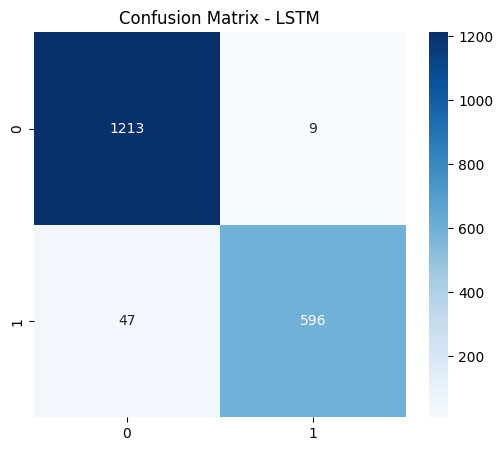

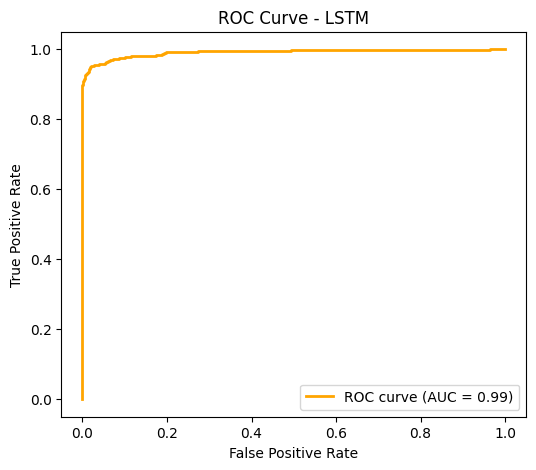

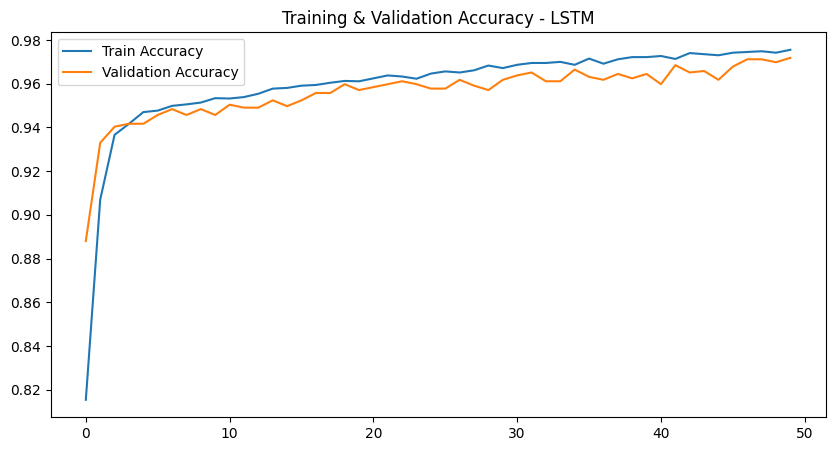

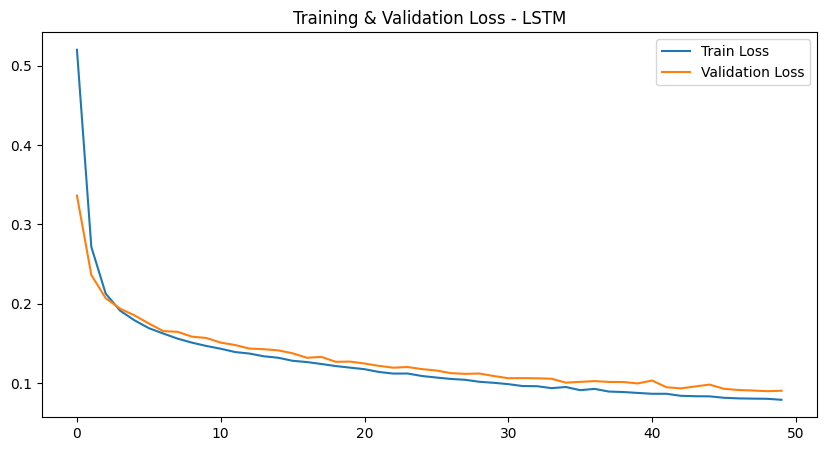

🚀 Training BiLSTM...
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


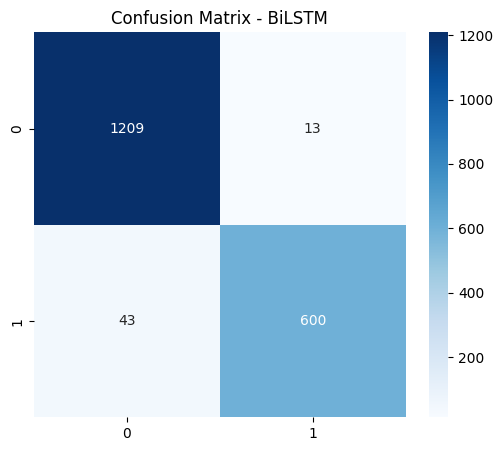

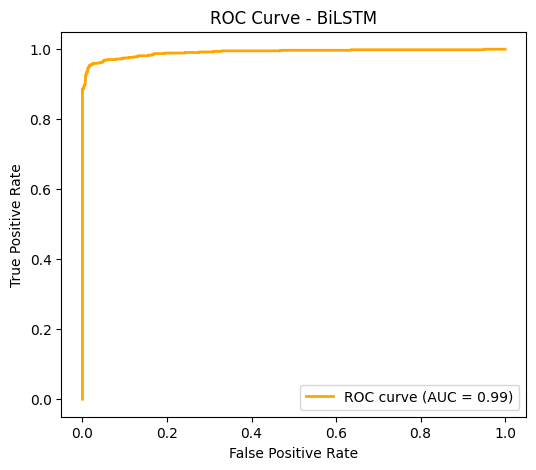

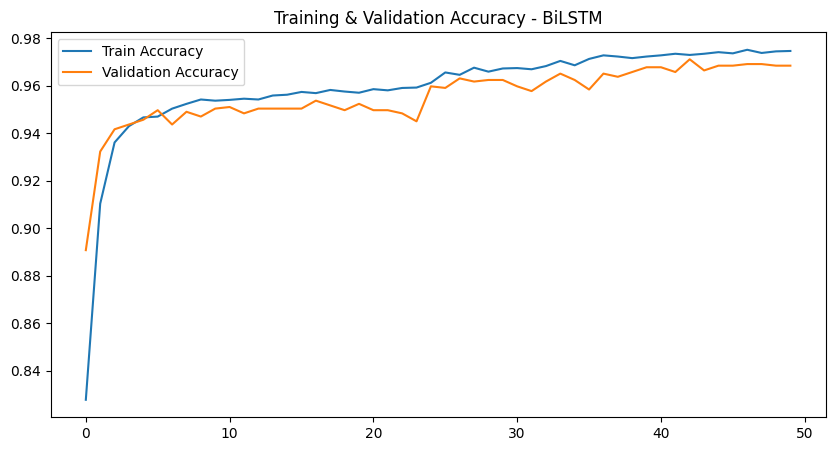

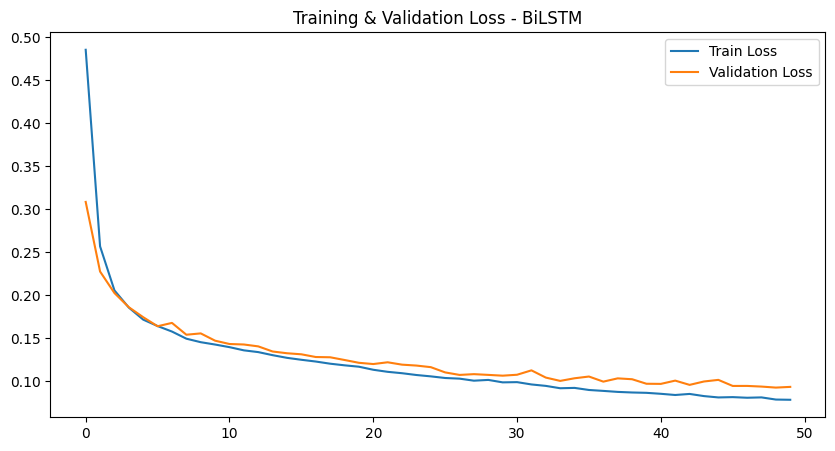

🚀 Training GRU...
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


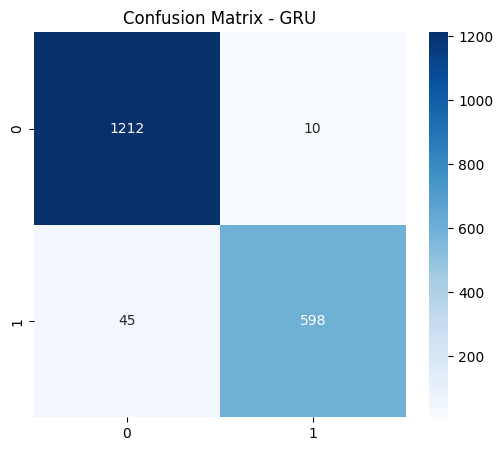

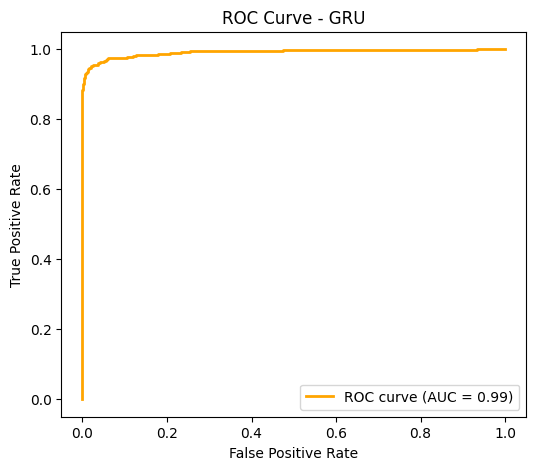

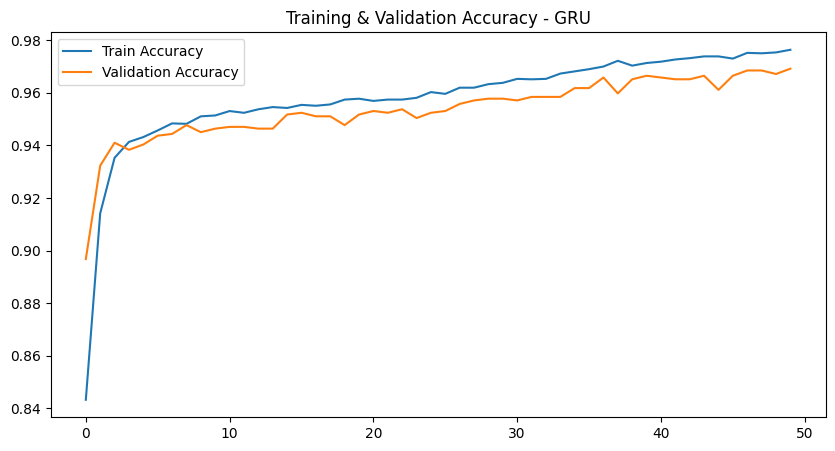

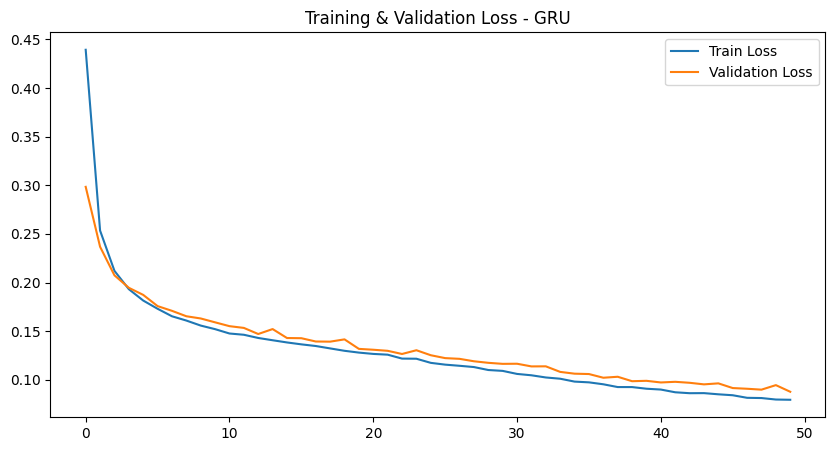

🚀 Training CNN-LSTM...
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


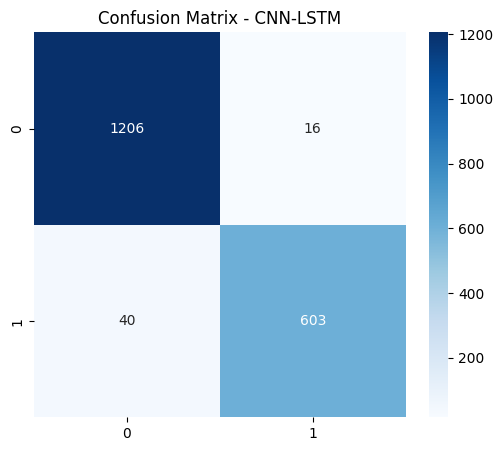

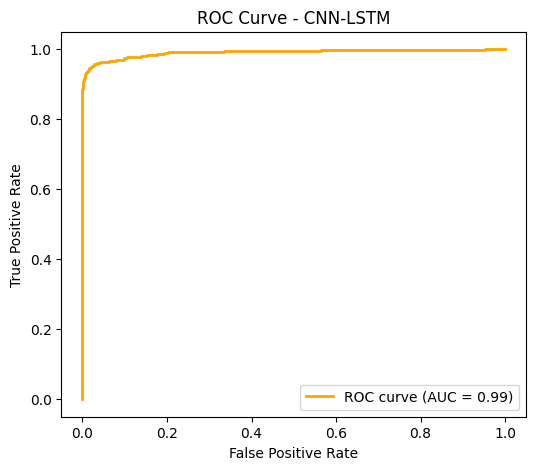

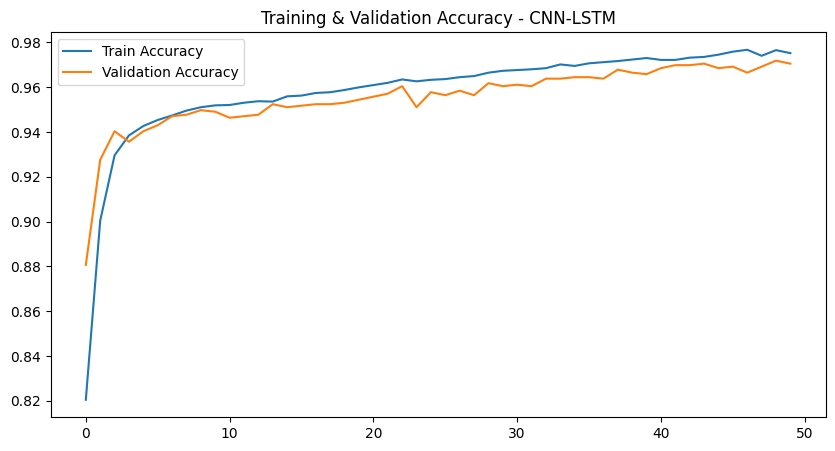

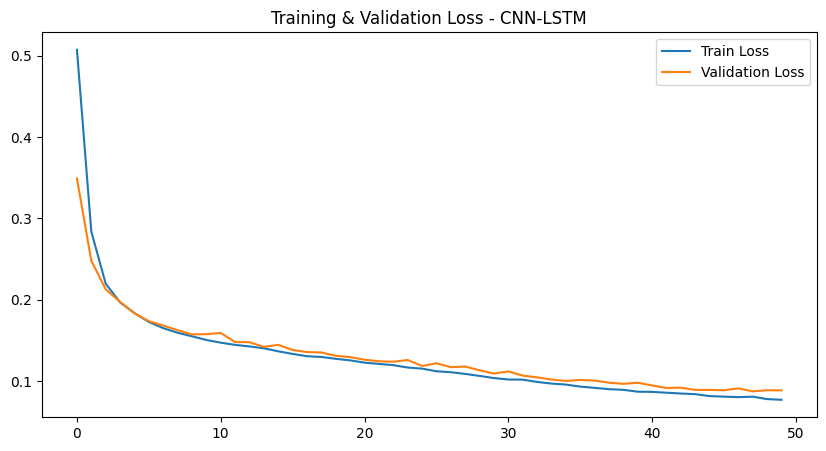

      Model  Accuracy  Precision(0)  Precision(1)  Recall(0)  Recall(1)  \
0      LSTM  0.969973      0.962698      0.985124   0.992635   0.926905   
1    BiLSTM  0.969973      0.965655      0.978793   0.989362   0.933126   
2       GRU  0.970509      0.964200      0.983553   0.991817   0.930016   
3  CNN-LSTM  0.969973      0.967897      0.974152   0.986907   0.937792   

      F1(0)     F1(1)   AUC-ROC  Training Time  
0  0.977438  0.955128  0.991267      83.607690  
1  0.977365  0.955414  0.991266      62.272130  
2  0.977814  0.956035  0.991593      35.169221  
3  0.977310  0.955626  0.990891      35.074811  


In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import time

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, LSTM, GRU, Bidirectional, Input, Reshape, Flatten
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Set Results Directory
results_dir = "results/ECG_Anomaly_Detection"
os.makedirs(results_dir, exist_ok=True)

# Load Dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Handle Missing Values
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Define ECG Anomaly Conditions (Corrected Gender-Specific QT Threshold)
data['ECG_Anomaly'] = (
    ((data['QT'] > 450) & (data['Sex'] == 1)) |  # Men: QT > 450ms
    ((data['QT'] > 460) & (data['Sex'] == 0)) |  # Women: QT > 460ms
    (data['QRS'] > 120) |  # Bundle branch block
    (data['PR'] > 200) |  # 1st-degree AV block
    (data['RR'] < 600) | (data['RR'] > 1000)  # Arrhythmia
).astype(int)

# Define Features & Target
target_column = "ECG_Anomaly"
features = ["QT", "QRS", "PR", "RR", "Dosage(mg)", "TPEAKTEND", "ERD_30", "LRD_30", "Twave_amplitude"]
X = data[features]
y = data[target_column]

# Normalize Data
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape for LSTM/GRU
X_train_dl = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_dl = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# ========================== MODEL DEFINITIONS ==========================

def build_lstm():
    inputs = Input(shape=(1, len(features)))
    x = LSTM(64, return_sequences=False)(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_bilstm():
    inputs = Input(shape=(1, len(features)))
    x = Bidirectional(LSTM(64, return_sequences=False))(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_gru():
    inputs = Input(shape=(1, len(features)))
    x = GRU(64, return_sequences=False)(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_cnn_lstm():
    inputs = Input(shape=(1, len(features)))
    x = LSTM(64, return_sequences=False)(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

# ========================== MODEL TRAINING & EVALUATION ==========================
models = {
    'LSTM': build_lstm(),
    'BiLSTM': build_bilstm(),
    'GRU': build_gru(),
    'CNN-LSTM': build_cnn_lstm()
}

metrics = []

for model_name, model in models.items():
    print(f"🚀 Training {model_name}...")
    start_time = time.time()

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train_dl, y_train, validation_split=0.2, epochs=50, batch_size=64, verbose=0)

    y_pred_prob = model.predict(X_test_dl).flatten()
    y_pred = (y_pred_prob > 0.5).astype(int)

    train_time = time.time() - start_time
    auc_roc = auc(*roc_curve(y_test, y_pred_prob)[:2])
    report = classification_report(y_test, y_pred, output_dict=True)

    metrics.append([model_name, report['accuracy'], report['0']['precision'], report['1']['precision'],
                    report['0']['recall'], report['1']['recall'], report['0']['f1-score'], report['1']['f1-score'],
                    auc_roc, train_time])

    # ========================== PLOTS ==========================

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"Confusion Matrix - {model_name}")
    plt.savefig(f"{results_dir}/conf_matrix_{model_name}.png")
    plt.show()

    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, color='orange', lw=2, label=f'ROC curve (AUC = {auc_roc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {model_name}')
    plt.legend()
    plt.savefig(f"{results_dir}/roc_curve_{model_name}.png")
    plt.show()

    # Accuracy & Loss Graphs
    plt.figure(figsize=(10, 5))
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Training & Validation Accuracy - {model_name}')
    plt.legend()
    plt.savefig(f"{results_dir}/accuracy_plot_{model_name}.png")
    plt.show()

    plt.figure(figsize=(10, 5))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'Training & Validation Loss - {model_name}')
    plt.legend()
    plt.savefig(f"{results_dir}/loss_plot_{model_name}.png")
    plt.show()

# ========================== SAVE METRICS ==========================
df_metrics = pd.DataFrame(metrics, columns=['Model', 'Accuracy', 'Precision(0)', 'Precision(1)', 'Recall(0)', 'Recall(1)', 'F1(0)', 'F1(1)', 'AUC-ROC', 'Training Time'])
df_metrics.to_csv(f"{results_dir}/model_comparison.csv", index=False)

print(df_metrics)


In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, LSTM, GRU, Bidirectional, Input
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import time

# Set Results Directory
results_dir = "results/ECG_Anomaly_Detection"
os.makedirs(results_dir, exist_ok=True)

# Load Dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Handle Missing Values
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Define ECG Anomaly Conditions
data['ECG_Anomaly'] = (
    (data['QT'] > 450) |  # QT prolongation (Men > 450ms, Women > 460ms)
    (data['QRS'] > 120) |  # Bundle branch block
    (data['PR'] > 200) |  # 1st-degree AV block
    (data['RR'] < 600) | (data['RR'] > 1000)  # Arrhythmia
).astype(int)

# Define Features & Target
target_column = "ECG_Anomaly"
features = ["QT", "QRS", "PR", "RR", "Dosage(mg)", "TPEAKTEND", "ERD_30", "LRD_30", "Twave_amplitude"]
X = data[features]
y = data[target_column]

# Normalize Data
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape for LSTM/GRU/CNN-LSTM
X_train_dl = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_dl = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# ========================== MODEL DEFINITIONS ==========================
def build_lstm():
    inputs = Input(shape=(1, len(features)))
    x = LSTM(64, return_sequences=False)(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_bilstm():
    inputs = Input(shape=(1, len(features)))
    x = Bidirectional(LSTM(64, return_sequences=False))(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_gru():
    inputs = Input(shape=(1, len(features)))
    x = GRU(64, return_sequences=False)(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

def build_cnn_lstm():
    inputs = Input(shape=(1, len(features)))
    x = LSTM(64, return_sequences=False)(inputs)
    x = Dense(32, activation='relu')(x)
    outputs = Dense(1, activation='sigmoid')(x)
    return Model(inputs, outputs)

# ========================== MODEL TRAINING & SAVING ==========================
models = {
    'LSTM': build_lstm(),
    'BiLSTM': build_bilstm(),
    'GRU': build_gru(),
    'CNN-LSTM': build_cnn_lstm()
}

metrics = []

for model_name, model in models.items():
    print(f"Training {model_name}...")

    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    history = model.fit(X_train_dl, y_train, validation_split=0.2, epochs=50, batch_size=64, verbose=0)

    # Save Model
    model.save(f"{results_dir}/{model_name}_model.h5")

    # Predictions
    y_pred_prob = model.predict(X_test_dl).flatten()
    y_pred = (y_pred_prob > 0.5).astype(int)

    # Compute Metrics
    auc_roc = auc(*roc_curve(y_test, y_pred_prob)[:2])
    report = classification_report(y_test, y_pred, output_dict=True)

    metrics.append([model_name, report['accuracy'], report['0']['precision'], report['1']['precision'],
                    report['0']['recall'], report['1']['recall'], report['0']['f1-score'], report['1']['f1-score'],
                    auc_roc])

# Save Metrics to CSV
df_metrics = pd.DataFrame(metrics, columns=['Model', 'Accuracy', 'Precision(0)', 'Precision(1)', 'Recall(0)', 'Recall(1)', 'F1(0)', 'F1(1)', 'AUC-ROC'])
df_metrics.to_csv(f"{results_dir}/model_comparison.csv", index=False)

print(df_metrics)

print("All models trained and saved successfully!")


Training LSTM...


59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
Training BiLSTM...


59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Training GRU...


59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Training CNN-LSTM...


59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
      Model  Accuracy  Precision(0)  Precision(1)  Recall(0)  Recall(1)  \
0      LSTM  0.971582      0.963826      0.987118   0.993372   0.931611   
1    BiLSTM  0.969973      0.965992      0.977778   0.988401   0.936170   
2       GRU  0.968365      0.961415      0.982287   0.990886   0.927052   
3  CNN-LSTM  0.969973      0.960769      0.988636   0.994200   0.925532   

      F1(0)     F1(1)   AUC-ROC  
0  0.978376  0.958561  0.989183  
1  0.977068  0.956522  0.988834  
2  0.975928  0.953870  0.989980  
3  0.977199  0.956044  0.991237  
All models trained and saved successfully!


Running SHAP for LSTM...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/

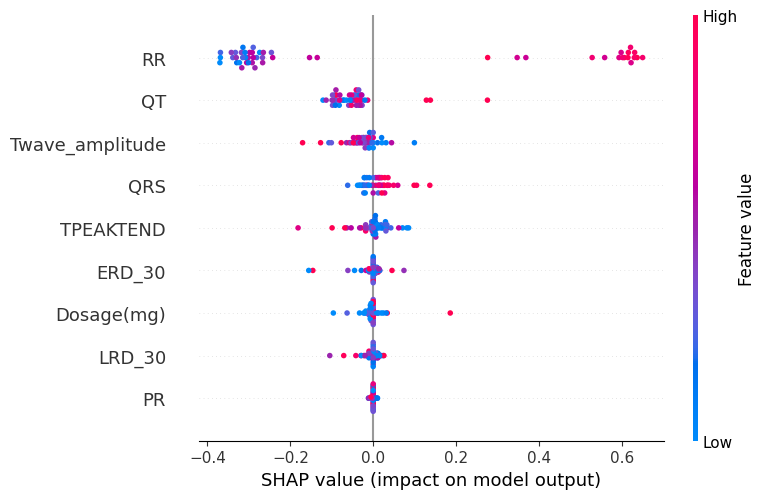

<Figure size 640x480 with 0 Axes>

SHAP Analysis completed for LSTM!
Running SHAP for BiLSTM...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/s

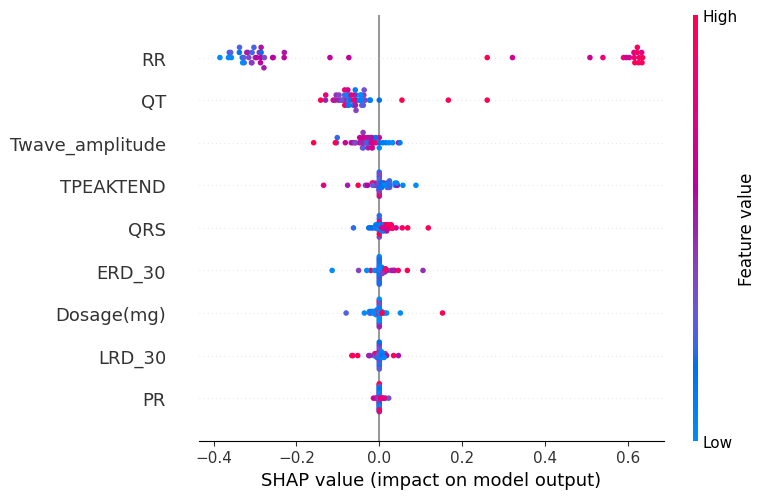

<Figure size 640x480 with 0 Axes>

SHAP Analysis completed for BiLSTM!
Running SHAP for GRU...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/ste

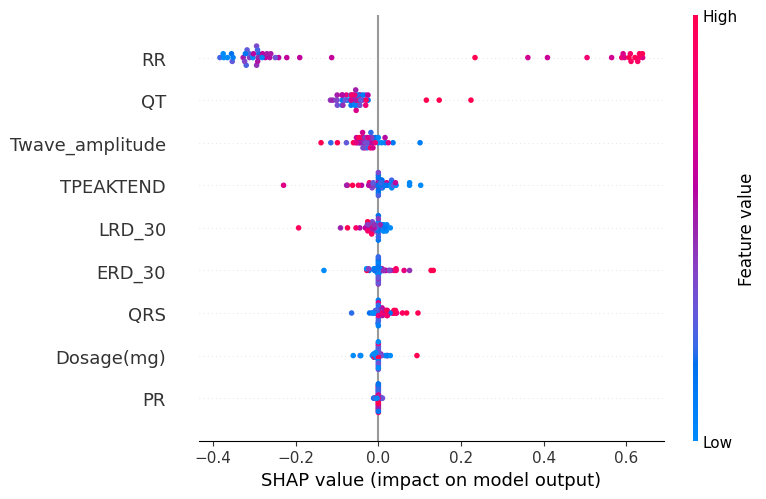

<Figure size 640x480 with 0 Axes>

SHAP Analysis completed for GRU!
Running SHAP for CNN-LSTM...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step


  0%|          | 0/50 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s

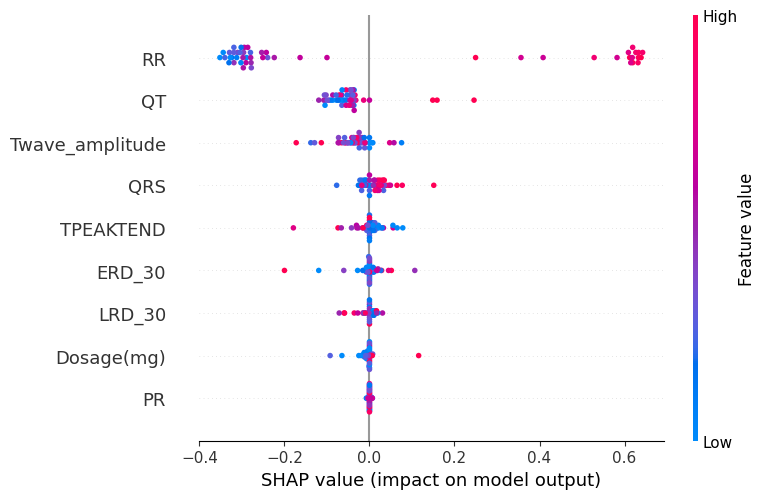

<Figure size 640x480 with 0 Axes>

SHAP Analysis completed for CNN-LSTM!
All SHAP Analyses Done!


In [ ]:
import shap
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Set Results Directory for SHAP
shap_results_dir = "results/SHAP_Analysis"
os.makedirs(shap_results_dir, exist_ok=True)

# Load Dataset
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Define Features
features = ["QT", "QRS", "PR", "RR", "Dosage(mg)", "TPEAKTEND", "ERD_30", "LRD_30", "Twave_amplitude"]

# Normalize Features (Use same scaler as before)
scaler = StandardScaler()
X = scaler.fit_transform(data[features])

# Train-Test Split
X_train, X_test = train_test_split(X, test_size=0.2, random_state=42)

# Reshape for Deep Learning Models (Flatten time-step dimension for SHAP)
X_train_dl = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test_dl = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Define Model Paths
model_paths = {
    "LSTM": "results/ECG_Anomaly_Detection/LSTM_model.h5",
    "BiLSTM": "results/ECG_Anomaly_Detection/BiLSTM_model.h5",
    "GRU": "results/ECG_Anomaly_Detection/GRU_model.h5",
    "CNN-LSTM": "results/ECG_Anomaly_Detection/CNN-LSTM_model.h5"
}

# Run SHAP Analysis for Each Model
for model_name, model_path in model_paths.items():
    print(f"Running SHAP for {model_name}...")

    if not os.path.exists(model_path):
        print(f"ERROR: Model {model_name} not found. Skipping.")
        continue

    # Load Model
    model = tf.keras.models.load_model(model_path)

    # Select a Sample of Data for SHAP
    X_sample = X_test_dl[:50]  # Reduce for efficiency

    # Convert Model to SHAP-Compatible Function
    def model_wrapper(X_input):
        return model.predict(X_input.reshape((X_input.shape[0], 1, X_input.shape[1])))  # Maintain batch size

    # Reshape Input to 2D for SHAP
    X_sample_2D = X_sample.reshape(X_sample.shape[0], X_sample.shape[2])  # Convert (batch_size, 1, features) → (batch_size, features)

    # Use KernelExplainer with Correct Background Data
    explainer = shap.KernelExplainer(model_wrapper, X_train_dl[:10].reshape(10, X_train_dl.shape[2]))  # Flatten background data
    shap_values = explainer.shap_values(X_sample_2D, nsamples=100)  # Use 2D input for SHAP

    # Fix Shape Mismatch Issue
    shap_values_array = np.array(shap_values)  # Convert to NumPy Array (Ensures Compatibility)

    if len(shap_values_array.shape) == 3:  # If multi-output, use first dimension
        shap_values_array = shap_values_array[:, :, 0]

    # SHAP Summary Plot
    plt.figure(figsize=(10, 8))
    shap.summary_plot(shap_values_array, X_sample_2D, feature_names=features)
    plt.savefig(f"{shap_results_dir}/shap_summary_{model_name}.png")
    plt.show()

    print(f"SHAP Analysis completed for {model_name}!")

print("All SHAP Analyses Done!")


Epoch 1/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 15s 40ms/step - loss: 0.9116
Epoch 2/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.5630
Epoch 3/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4524
Epoch 4/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.3916
Epoch 5/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.3979
Epoch 6/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3539
Epoch 7/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3567
Epoch 8/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3449
Epoch 9/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3216
Epoch 10/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3235
Epoch 11/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3514
Epoch 12/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3028
Epoch 13/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3762
Epoch 14/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3123
Epoch 15/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - 

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [11:17:05] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



XGBoost + Transformer Classification Report:

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      1207
           1       0.93      0.87      0.90       658

    accuracy                           0.93      1865
   macro avg       0.93      0.92      0.93      1865
weighted avg       0.93      0.93      0.93      1865



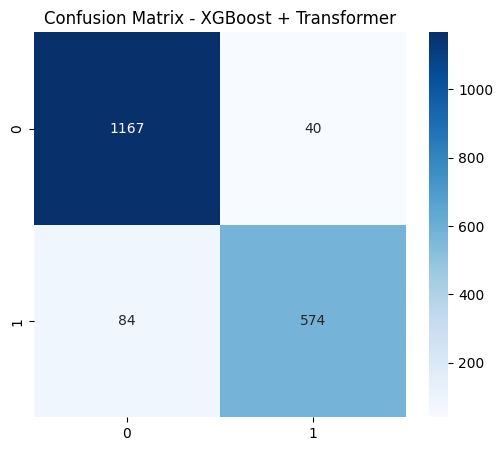

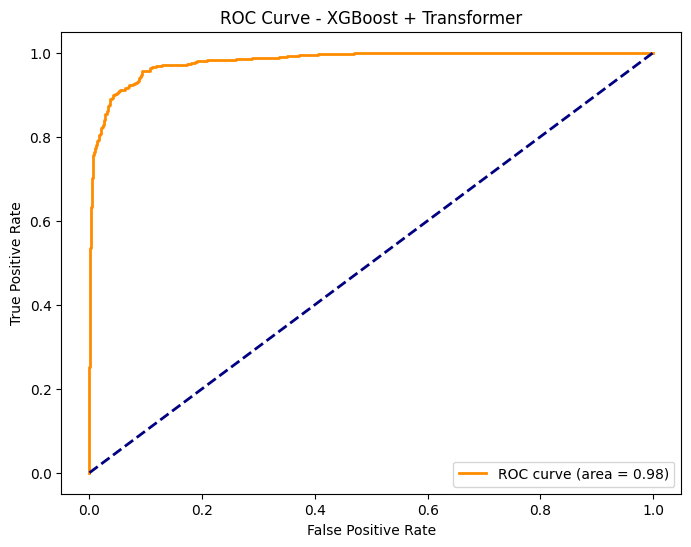

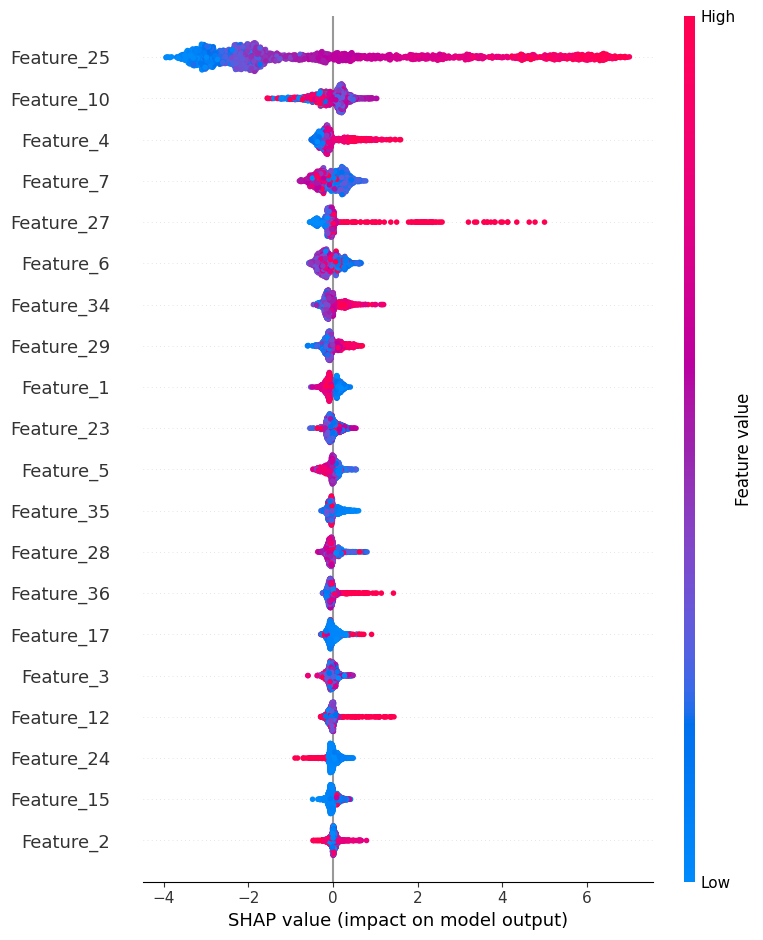

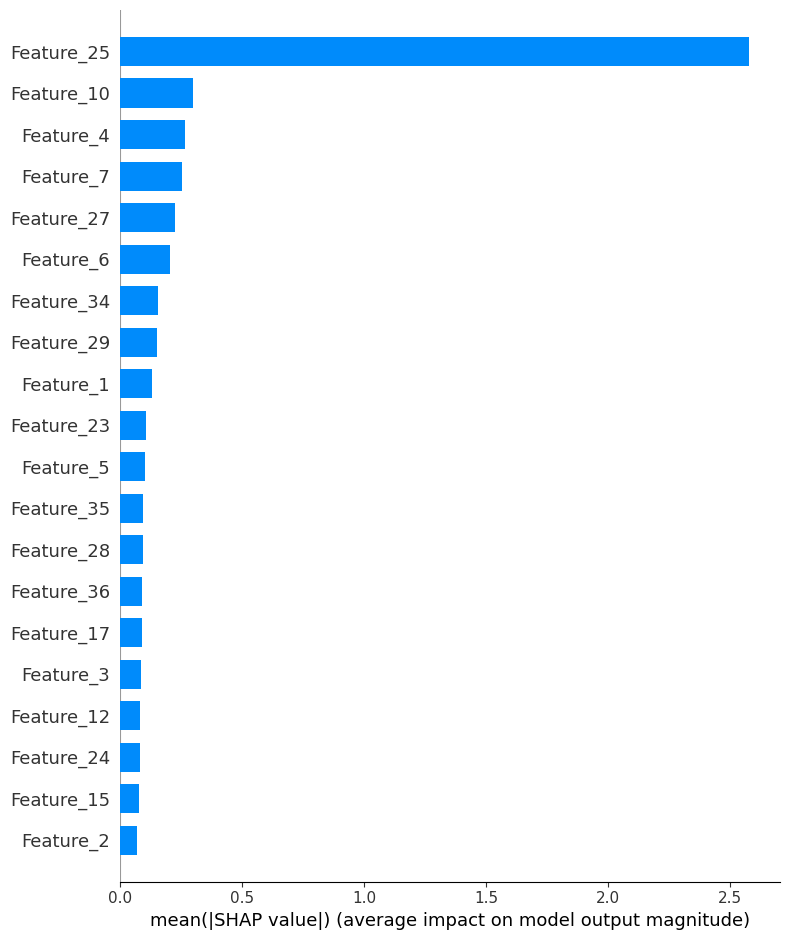

In [ ]:
# Import Necessary Libraries
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# ✅ Step 1: Load the Dataset
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# ✅ Step 2: Preprocessing
# Handling Missing Values
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

# Encode Categorical Variables
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# ✅ Step 3: Define Target
target_column = "ECG_Anomaly"  # Ensure this column is correctly created
if target_column not in data.columns:
    data["ECG_Anomaly"] = (
        (data['QT'] > 450) | (data['QRS'] > 120) |
        (data['PR'] > 200) | (data['RR'] < 600) | (data['RR'] > 1000)
    ).astype(int)

# Features and Target
X = data.drop(columns=[target_column])
y = data[target_column]

# Normalize Data
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ✅ Step 4: Define Transformer Model for Feature Extraction
def build_transformer(input_shape):
    inputs = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.Reshape((1, input_shape[0]))(inputs)  # Sequence length = 1
    x = tf.keras.layers.MultiHeadAttention(num_heads=4, key_dim=64)(x, x)
    x = tf.keras.layers.LayerNormalization()(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    x = tf.keras.layers.Dense(64, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    outputs = tf.keras.layers.Dense(input_shape[0], activation='linear')(x)  # Match output size to input features
    return tf.keras.Model(inputs, outputs)

# ✅ Step 5: Train Transformer for Feature Extraction
transformer = build_transformer((X_train.shape[1],))
transformer.compile(optimizer='adam', loss='mse')  # Ensure MSE loss is correct
transformer.fit(X_train, X_train, epochs=50, batch_size=64, verbose=1)  # Self-supervised learning

# ✅ Step 6: Extract Features Using Transformer
X_train_transformed = transformer.predict(X_train)
X_test_transformed = transformer.predict(X_test)

# ✅ Step 7: Train XGBoost on Transformer Features
xgb_model = xgb.XGBClassifier(n_estimators=100, max_depth=6, learning_rate=0.1, use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train_transformed, y_train)

# ✅ Step 8: Evaluate Model
y_pred = xgb_model.predict(X_test_transformed)
y_pred_prob = xgb_model.predict_proba(X_test_transformed)[:, 1]

# Classification Report
print("\nXGBoost + Transformer Classification Report:\n")
print(classification_report(y_test, y_pred))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - XGBoost + Transformer")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBoost + Transformer')
plt.legend(loc="lower right")
plt.show()

# ✅ Step 9: SHAP Interpretation
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test_transformed)

# SHAP Summary Plot
shap.summary_plot(shap_values, X_test_transformed, feature_names=[f"Feature_{i}" for i in range(X_test_transformed.shape[1])])

# SHAP Feature Importance Bar Chart
shap.summary_plot(shap_values, X_test_transformed, feature_names=[f"Feature_{i}" for i in range(X_test_transformed.shape[1])], plot_type="bar")


Epoch 1/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - loss: 0.8556
Epoch 2/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 0.5524
Epoch 3/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4605
Epoch 4/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.4088
Epoch 5/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3778
Epoch 6/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.3620
Epoch 7/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3350
Epoch 8/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3463
Epoch 9/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3515
Epoch 10/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.3283
Epoch 11/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.3586
Epoch 12/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3127
Epoch 13/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3352
Epoch 14/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.3202
Epoch 15/50
117/117 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - 

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [11:47:07] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



🔹 **Performance Metrics Table:**
                   Model  Accuracy  Precision(0)  Precision(1)  Recall(0)  \
0  XGBoost + Transformer  0.936193      0.933812       0.94108   0.970174   

   Recall(1)     F1(0)     F1(1)   AUC-ROC  Training Time  
0    0.87386  0.951646  0.906225  0.982686       0.807684  


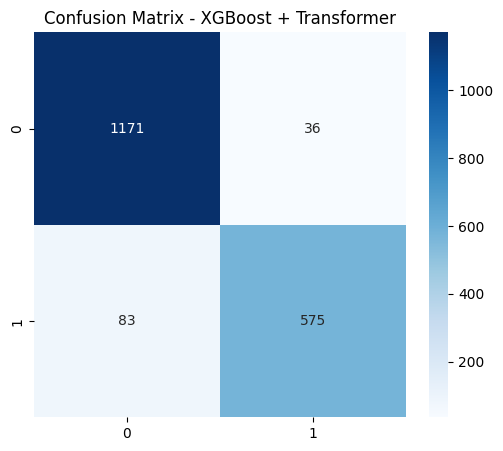

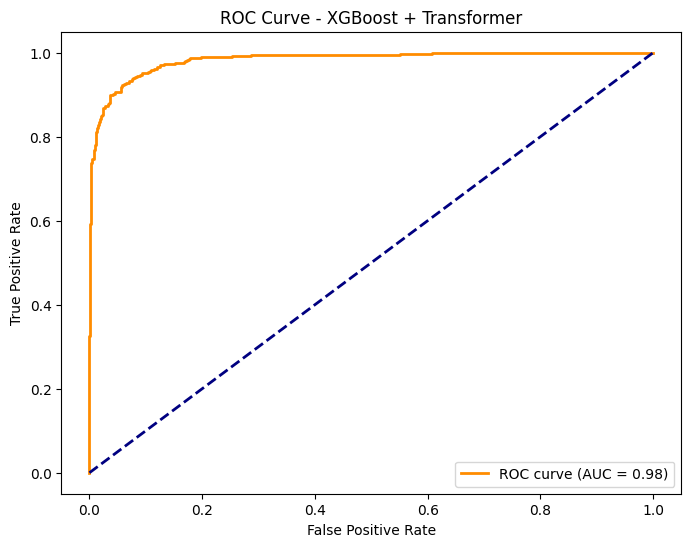

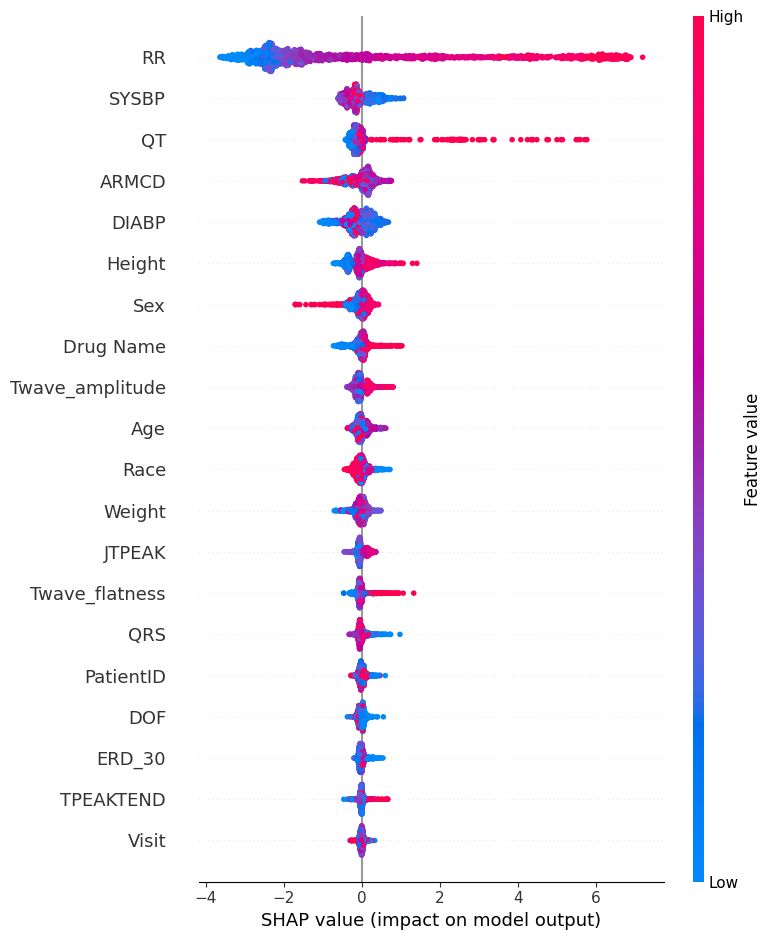

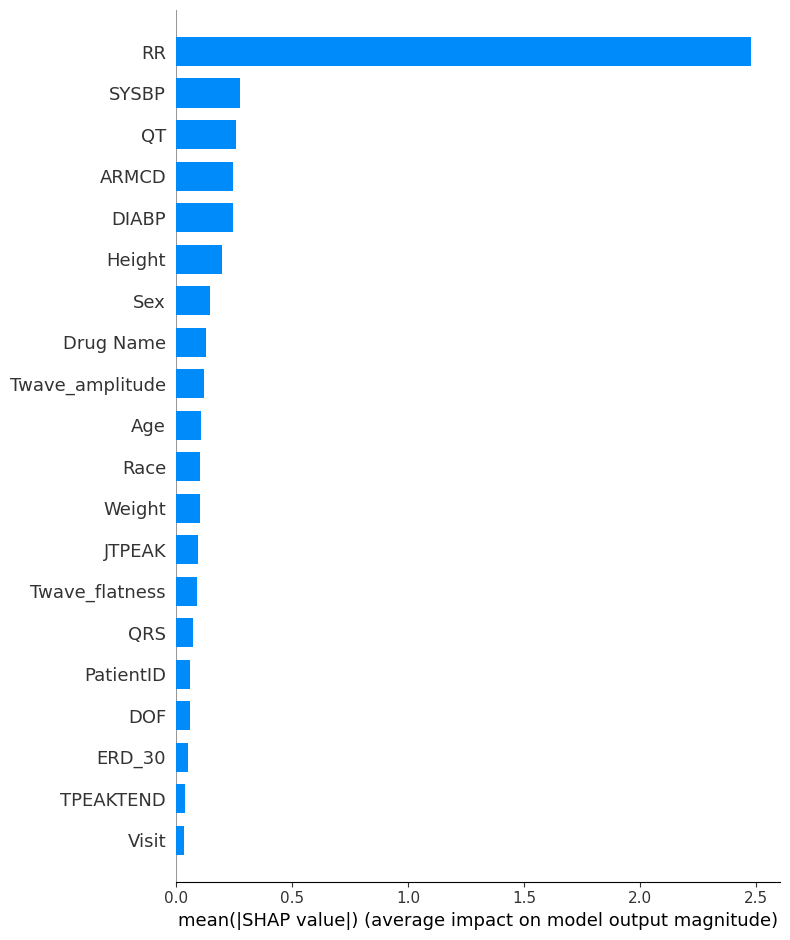

In [ ]:
# ✅ Import Libraries
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import xgboost as xgb
import time
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve

# ✅ Load Dataset
file_path = "/content/Merged dataset Sara.csv"
data = pd.read_csv(file_path)

# ✅ Preprocessing
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

# Handle Missing Values
data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

# Encode Categorical Variables
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# ✅ Define ECG Anomaly Detection Labels
if "ECG_Anomaly" not in data.columns:
    data["ECG_Anomaly"] = (
        (data['QT'] > 450) | (data['QRS'] > 120) |
        (data['PR'] > 200) | (data['RR'] < 600) | (data['RR'] > 1000)
    ).astype(int)

# Define Features & Target
X = data.drop(columns=["ECG_Anomaly"])
y = data["ECG_Anomaly"]

# Normalize Features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# ✅ Build Transformer Model for Feature Extraction
def build_transformer(input_shape):
    inputs = tf.keras.Input(shape=input_shape)
    x = tf.keras.layers.Reshape((1, input_shape[0]))(inputs)  # Sequence length = 1
    x = tf.keras.layers.MultiHeadAttention(num_heads=4, key_dim=64)(x, x)
    x = tf.keras.layers.LayerNormalization()(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(128, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    x = tf.keras.layers.Dense(64, activation='relu')(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    outputs = tf.keras.layers.Dense(input_shape[0], activation='linear')(x)  # Match input size
    return tf.keras.Model(inputs, outputs)

# ✅ Train Transformer Model
transformer = build_transformer((X_train.shape[1],))
transformer.compile(optimizer='adam', loss='mse')
start_time = time.time()
transformer.fit(X_train, X_train, epochs=50, batch_size=64, verbose=1)
training_time_transformer = time.time() - start_time  # Capture Training Time

# ✅ Extract Transformer Features
X_train_transformed = transformer.predict(X_train)
X_test_transformed = transformer.predict(X_test)

# ✅ Feature Selection - Keep Only Important Features
feature_importance = np.mean(np.abs(X_train_transformed), axis=0)  # Mean importance across features
selected_features = np.argsort(feature_importance)[-20:]  # Keep top 20 features

X_train_selected = X_train_transformed[:, selected_features]
X_test_selected = X_test_transformed[:, selected_features]

# ✅ Train XGBoost with Transformer Features
xgb_model = xgb.XGBClassifier(n_estimators=150, max_depth=6, learning_rate=0.05, use_label_encoder=False, eval_metric='logloss')
start_time = time.time()
xgb_model.fit(X_train_selected, y_train)
training_time_xgb = time.time() - start_time  # Capture Training Time

# ✅ Evaluate Model
y_pred = xgb_model.predict(X_test_selected)
y_pred_prob = xgb_model.predict_proba(X_test_selected)[:, 1]

# ✅ Collect Performance Metrics
classification_report_dict = classification_report(y_test, y_pred, output_dict=True)

metrics_data = {
    "Model": "XGBoost + Transformer",
    "Accuracy": classification_report_dict["accuracy"],
    "Precision(0)": classification_report_dict["0"]["precision"],
    "Precision(1)": classification_report_dict["1"]["precision"],
    "Recall(0)": classification_report_dict["0"]["recall"],
    "Recall(1)": classification_report_dict["1"]["recall"],
    "F1(0)": classification_report_dict["0"]["f1-score"],
    "F1(1)": classification_report_dict["1"]["f1-score"],
    "AUC-ROC": roc_auc_score(y_test, y_pred_prob),
    "Training Time": training_time_xgb
}

# ✅ Print Metrics Table
metrics_df = pd.DataFrame([metrics_data])
print("\n🔹 **Performance Metrics Table:**")
print(metrics_df)

# ✅ Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - XGBoost + Transformer")
plt.show()

# ✅ ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = roc_auc_score(y_test, y_pred_prob)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBoost + Transformer')
plt.legend(loc="lower right")
plt.show()

# ✅ SHAP Analysis with Correct Feature Names
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test_selected)

# Ensure feature names are correctly assigned
feature_names = data.drop(columns=["ECG_Anomaly"]).columns[selected_features]

# 🔹 SHAP Summary Plot
shap.summary_plot(shap_values, X_test_selected, feature_names=feature_names)

# 🔹 SHAP Feature Importance Bar Chart
shap.summary_plot(shap_values, X_test_selected, feature_names=feature_names, plot_type="bar")


In [ ]:
print("Available columns in the dataset:", data.columns)


Available columns in the dataset: Index(['EGREFID', 'PatientID', 'Sex', 'Age', 'Height', 'Weight', 'SYSBP',
       'DIABP', 'Race', 'Ethnicity', 'ARMCD', 'Visit', 'Drug Name', 'DOF',
       'LIDO', 'MEXI', 'MOXI', 'MOXI.M2', 'DILT', 'QUIN', 'RENO', 'VERA HCL',
       'Dosage(mg)', 'TPT', 'BASELINE', 'RR', 'PR', 'QT', 'QRS', 'JTPEAK',
       'TPEAKTEND', 'TPEAKTPEAKP', 'ERD_30', 'LRD_30', 'Twave_amplitude',
       'Twave_asymmetry', 'Twave_flatness'],
      dtype='object')


## **FINAL ECG**

Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 26s 126ms/step - accuracy: 0.8082 - loss: 0.4513 - val_accuracy: 0.9249 - val_loss: 0.1928
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9226 - loss: 0.2230 - val_accuracy: 0.9424 - val_loss: 0.1683
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9250 - loss: 0.2126 - val_accuracy: 0.9477 - val_loss: 0.1503
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.9367 - loss: 0.1801 - val_accuracy: 0.9504 - val_loss: 0.1373
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9500 - loss: 0.1529 - val_accuracy: 0.9544 - val_loss: 0.1239
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9488 - loss: 0.1477 - val_accuracy: 0.9538 - val_loss: 0.1305
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.9508 - loss: 0.1394 - val_accuracy: 0.9551 - val_loss: 0.1158
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.9516 - loss: 0.1386 - val_accuracy: 0.9571 - val_lo

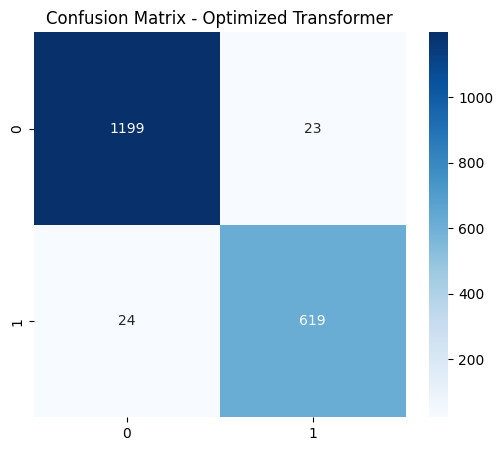

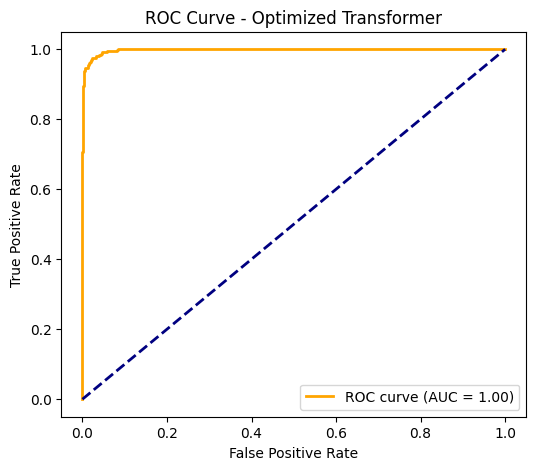

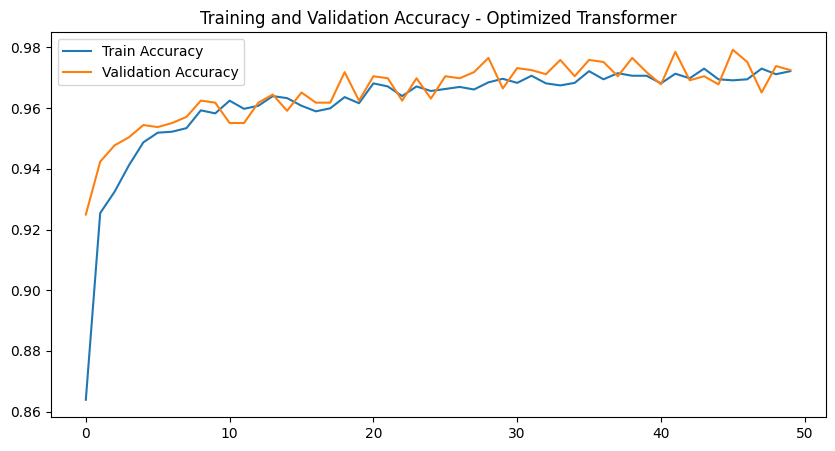

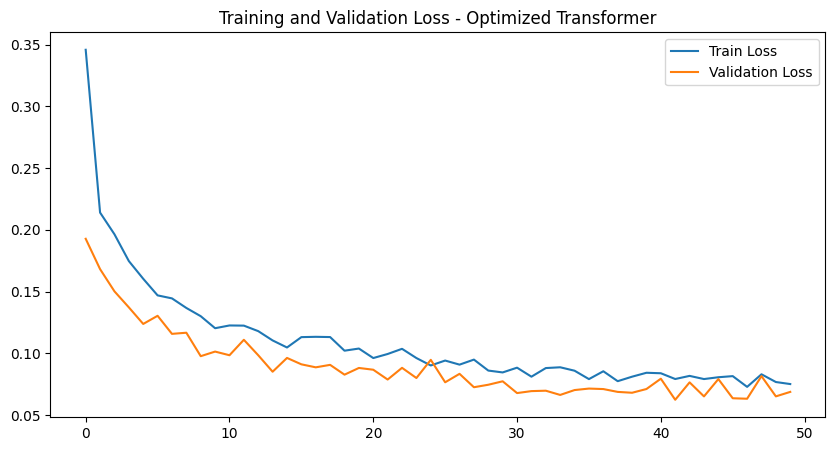

              precision    recall  f1-score      support
0              0.980376  0.981178  0.980777  1222.000000
1              0.964174  0.962675  0.963424   643.000000
accuracy       0.974799  0.974799  0.974799     0.974799
macro avg      0.972275  0.971927  0.972101  1865.000000
weighted avg   0.974790  0.974799  0.974794  1865.000000
         Model  Accuracy  Precision(0)  Precision(1)  Recall(0)  Recall(1)  \
0  Transformer  0.974799      0.980376      0.964174   0.981178   0.962675   

      F1(0)     F1(1)   AUC-ROC  Training Time (s)  
0  0.980777  0.963424  0.997812          75.007754  

 Training completed! Transformer model saved to results/Optimized_Transformer/optimized_transformer_model.h5


In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import shap
import time
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, MultiHeadAttention, LayerNormalization, Input, Flatten, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Results Directory
results_dir = "results/Optimized_Transformer"
os.makedirs(results_dir, exist_ok=True)

# Load & Preprocess Data
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Handle Missing Values
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

# Encode Categorical Data
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# ECG Anomaly Definition (Male: QT > 450ms, Female: QT > 460ms)
data["ECG_Anomaly"] = (
    (data["QT"] > 450) & (data["Sex"] == 1) |  # Male threshold
    (data["QT"] > 460) & (data["Sex"] == 0) |  # Female threshold
    (data["QRS"] > 120) |  # Bundle branch block
    (data["PR"] > 200) |   # 1st-degree AV block
    (data["RR"] < 600) | (data["RR"] > 1000)  # Arrhythmia
).astype(int)

# Feature Selection
selected_features = ["RR", "SYSBP", "QT", "ARMCD", "DIABP", "Height", "Sex", "Drug Name", "Twave_amplitude", "Age", "Race", "Weight", "JTPEAK", "Twave_flatness", "QRS"]
X = data[selected_features]
y = data["ECG_Anomaly"]

# Normalize Features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Compute Class Weights (Instead of SMOTE)
class_weights = dict(enumerate(compute_class_weight(class_weight="balanced", classes=np.unique(y_train), y=y_train)))

# Define Optimized Transformer Model
def build_transformer(input_shape):
    inputs = Input(shape=input_shape)

    # Transformer Encoder
    x = Reshape((1, input_shape[0]))(inputs)  # Ensure compatibility with MHA
    x = MultiHeadAttention(num_heads=8, key_dim=64)(x, x)
    x = LayerNormalization()(x)
    x = Flatten()(x)  # Flatten for dense layers

    # Feedforward Layers
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu')(x)
    x = Dropout(0.3)(x)

    # Output Layer
    outputs = Dense(1, activation='sigmoid')(x)

    return Model(inputs, outputs)

# Compile & Train Transformer Model
transformer = build_transformer((X_train.shape[1],))
transformer.compile(optimizer=Adam(learning_rate=0.0005), loss='binary_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

start_time = time.time()
history = transformer.fit(X_train, y_train, validation_split=0.2, epochs=50, batch_size=64, class_weight=class_weights, verbose=1, callbacks=[early_stopping])
training_time = time.time() - start_time

# Predictions
y_pred_prob = transformer.predict(X_test).flatten()
y_pred = (y_pred_prob > 0.5).astype(int)

# Classification Report
classification_report_dict = classification_report(y_test, y_pred, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
classification_report_df.to_csv(f"{results_dir}/classification_report.csv", index=True)

# Performance Metrics Table
metrics = {
    "Model": "Optimized Transformer",
    "Accuracy": classification_report_dict["accuracy"],
    "Precision(0)": classification_report_dict["0"]["precision"],
    "Precision(1)": classification_report_dict["1"]["precision"],
    "Recall(0)": classification_report_dict["0"]["recall"],
    "Recall(1)": classification_report_dict["1"]["recall"],
    "F1(0)": classification_report_dict["0"]["f1-score"],
    "F1(1)": classification_report_dict["1"]["f1-score"],
    "AUC-ROC": auc(*roc_curve(y_test, y_pred_prob)[:2]),
    "Training Time": training_time
}

# Print Performance Metrics
print("\n **Performance Metrics - Optimized Transformer**\n")
print(pd.DataFrame([metrics]))

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - Optimized Transformer")
plt.savefig(f"{results_dir}/confusion_matrix.png")
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='orange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Optimized Transformer')
plt.legend(loc="lower right")
plt.savefig(f"{results_dir}/roc_curve.png")
plt.show()

# Accuracy & Loss Curves
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy - Optimized Transformer')
plt.legend()
plt.savefig(f"{results_dir}/accuracy_plot.png")
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss - Optimized Transformer')
plt.legend()
plt.savefig(f"{results_dir}/loss_plot.png")
plt.show()

# Save Model
transformer.save(f"{results_dir}/optimized_transformer_model.h5")
# **Classification Report**
classification_report_dict = classification_report(y_test, y_pred, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
classification_report_df.to_csv(f"{results_dir}/classification_report.csv", index=True)
print(classification_report_df)

# **Performance Metrics Table**
metrics_data = {
    "Model": ["Transformer"],
    "Accuracy": [classification_report_dict["accuracy"]],
    "Precision(0)": [classification_report_dict["0"]["precision"]],
    "Precision(1)": [classification_report_dict["1"]["precision"]],
    "Recall(0)": [classification_report_dict["0"]["recall"]],
    "Recall(1)": [classification_report_dict["1"]["recall"]],
    "F1(0)": [classification_report_dict["0"]["f1-score"]],
    "F1(1)": [classification_report_dict["1"]["f1-score"]],
    "AUC-ROC": [auc(*roc_curve(y_test, y_pred_prob)[:2])],
    "Training Time (s)": [training_time]
}

metrics_df = pd.DataFrame(metrics_data)
print(metrics_df)

print(f"\n Training completed! Transformer model saved to {results_dir}/optimized_transformer_model.h5")


PermutationExplainer explainer: 501it [02:32,  3.12it/s]


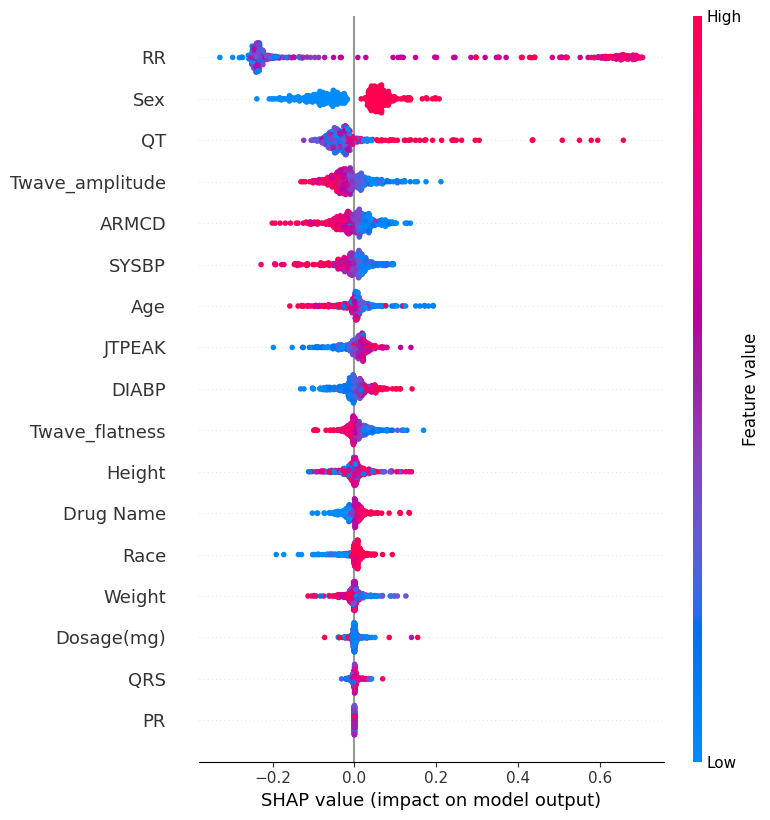

<Figure size 640x480 with 0 Axes>

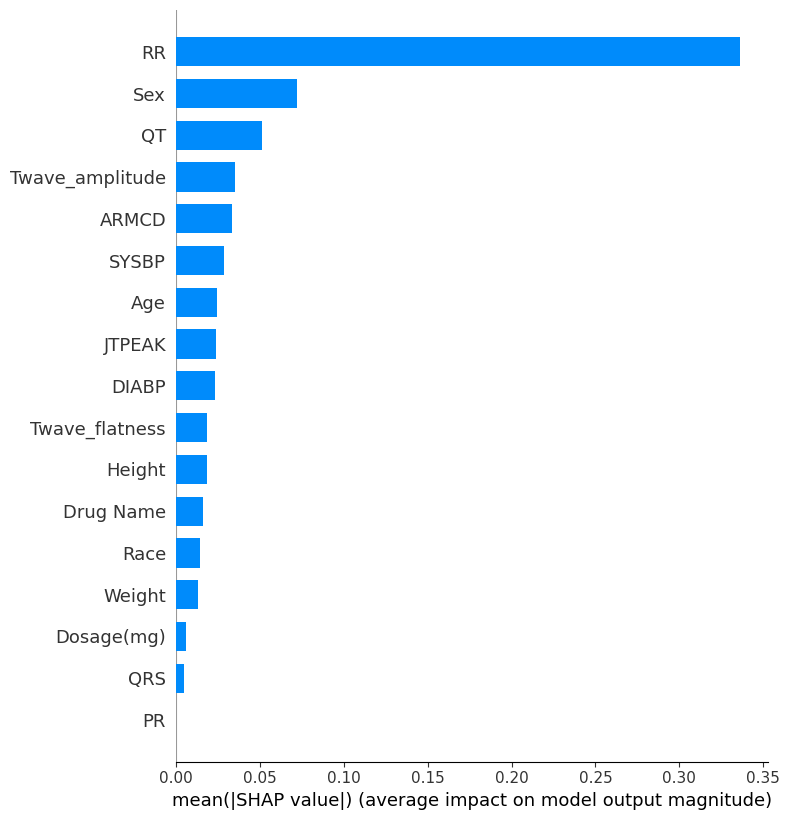

<Figure size 640x480 with 0 Axes>

In [ ]:
# Load Updated Transformer Model
transformer = tf.keras.models.load_model("results/Optimized_Transformer/optimized_transformer_17_features.h5")

# SHAP Explainer Setup
explainer = shap.Explainer(transformer, X_train[:100])  # Use 100 samples for efficiency

# SHAP Value Calculation (Using a sample for faster computation)
X_sample = X_test[:500]  # Limit test set for efficiency
shap_values = explainer(X_sample)

# **1. SHAP Summary Plot (BeeSwarm)**
plt.figure(figsize=(10, 8))
shap.summary_plot(shap_values, X_sample, feature_names=selected_features)
plt.savefig("shap_summary_plot.png")
plt.show()

# **2. SHAP Feature Importance (Bar Chart)**
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_sample, feature_names=selected_features, plot_type="bar")
plt.savefig("shap_feature_importance.png")
plt.show()


Epoch 1/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.7816 - loss: 0.4509 - val_accuracy: 0.9196 - val_loss: 0.2113
Epoch 2/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9202 - loss: 0.2058 - val_accuracy: 0.9370 - val_loss: 0.1619
Epoch 3/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9308 - loss: 0.1836 - val_accuracy: 0.9444 - val_loss: 0.1425
Epoch 4/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9401 - loss: 0.1531 - val_accuracy: 0.9484 - val_loss: 0.1385
Epoch 5/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9518 - loss: 0.1409 - val_accuracy: 0.9538 - val_loss: 0.1271
Epoch 6/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9561 - loss: 0.1288 - val_accuracy: 0.9504 - val_loss: 0.1224
Epoch 7/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9501 - loss: 0.1380 - val_accuracy: 0.9625 - val_loss: 0.1011
Epoch 8/50
94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9580 - loss: 0.1150 - val_accuracy: 0.9598 - val_los

234/234 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
59/59 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
              precision    recall  f1-score      support
0              0.976499  0.986088  0.981270  1222.000000
1              0.973059  0.954899  0.963893   643.000000
accuracy       0.975335  0.975335  0.975335     0.975335
macro avg      0.974779  0.970494  0.972582  1865.000000
weighted avg   0.975313  0.975335  0.975279  1865.000000
                   Model  Accuracy  Precision(0)  Precision(1)  Recall(0)  \
0  Transformer + XGBoost  0.975335      0.976499      0.973059   0.986088   

   Recall(1)    F1(0)     F1(1)   AUC-ROC  Training Time (s)  
0   0.954899  0.98127  0.963893  0.996922           42.42046  


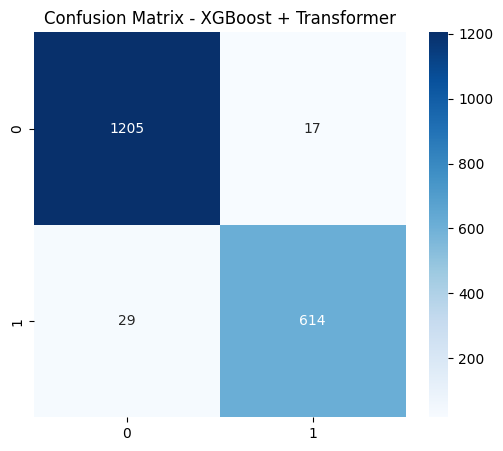

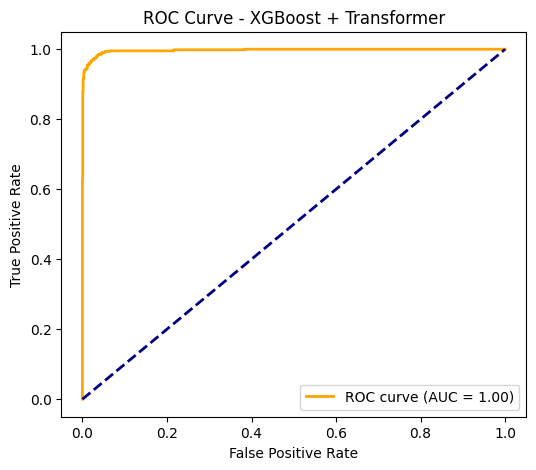

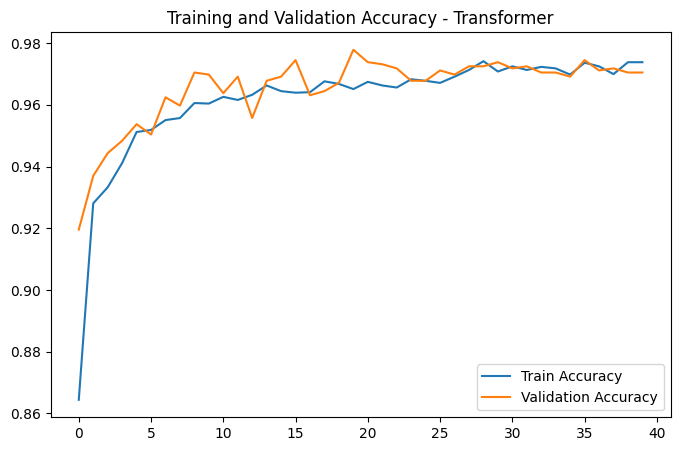

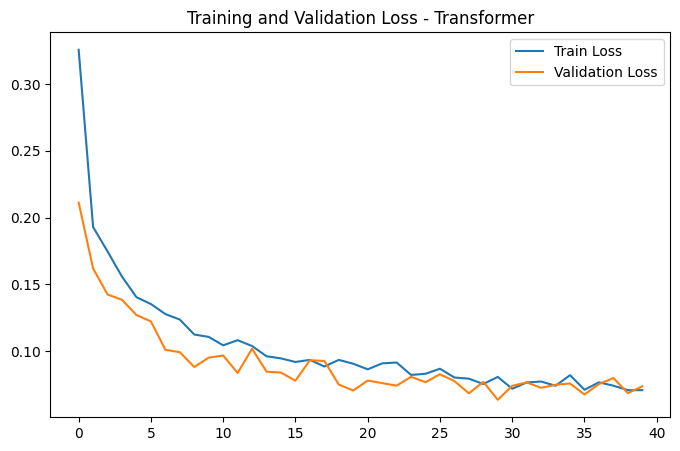

Training completed! Transformer-XGBoost model results saved to results/Transformer_XGBoost


In [ ]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import time
import xgboost as xgb
import matplotlib.pyplot as plt
import seaborn as sns

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, MultiHeadAttention, LayerNormalization, Input, Flatten, Reshape
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc

# Results Directory
results_dir = "results/Transformer_XGBoost"
os.makedirs(results_dir, exist_ok=True)

# Load & Preprocess Data
data = pd.read_csv('/content/Merged dataset Sara.csv')

# Handle Missing Values
numerical_cols = data.select_dtypes(include=["float64", "int64"]).columns
categorical_cols = data.select_dtypes(include=["object"]).columns

data[numerical_cols] = data[numerical_cols].fillna(data[numerical_cols].mean())
for col in categorical_cols:
    data[col] = data[col].fillna(data[col].mode()[0])

# Encode Categorical Data
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le

# Define ECG Anomaly Criteria
data["ECG_Anomaly"] = (
    (data["QT"] > 450) & (data["Sex"] == 1) |  # Male QT Prolongation
    (data["QT"] > 460) & (data["Sex"] == 0) |  # Female QT Prolongation
    (data["QRS"] > 120) |  # Bundle branch block
    (data["PR"] > 200) |   # 1st-degree AV block
    (data["RR"] < 600) | (data["RR"] > 1000)  # Arrhythmia
).astype(int)

# Feature Selection (Same as Transformer)
selected_features = ["RR", "SYSBP", "QT", "ARMCD", "DIABP", "Height", "Sex", "Drug Name",
                     "Twave_amplitude", "Age", "Race", "Weight", "JTPEAK", "Twave_flatness",
                     "QRS", "PR", "Dosage(mg)"]

X = data[selected_features]
y = data["ECG_Anomaly"]

# Normalize Features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# **Define Transformer Feature Extractor**
def build_transformer(input_shape):
    inputs = Input(shape=input_shape)

    # Transformer Encoder
    x = Reshape((1, input_shape[0]))(inputs)  # Ensure compatibility with MHA
    x = MultiHeadAttention(num_heads=8, key_dim=64)(x, x)
    x = LayerNormalization()(x)
    x = Flatten()(x)  # Flatten for dense layers

    # Feedforward Layers
    x = Dense(256, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(128, activation='relu')(x)
    x = Dropout(0.3)(x)
    x = Dense(64, activation='relu', name="feature_layer")(x)  # Extractable feature layer

    # Output Layer
    outputs = Dense(1, activation='sigmoid')(x)

    return Model(inputs, outputs)

# Train Transformer Model
transformer = build_transformer((X_train.shape[1],))
transformer.compile(optimizer=Adam(learning_rate=0.0005), loss='binary_crossentropy', metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

start_time = time.time()
history = transformer.fit(X_train, y_train, validation_split=0.2, epochs=50, batch_size=64, verbose=1, callbacks=[early_stopping])
training_time = time.time() - start_time

# Save Transformer Model
transformer.save(f"{results_dir}/transformer_feature_extractor.h5")

# **Step 2: Extract Deep Features from Transformer**
feature_extractor = Model(inputs=transformer.input, outputs=transformer.get_layer("feature_layer").output)

X_train_transformed = feature_extractor.predict(X_train)
X_test_transformed = feature_extractor.predict(X_test)

# **Step 3: Train XGBoost on Transformer Features**
xgb_model = xgb.XGBClassifier(n_estimators=200, learning_rate=0.05, max_depth=6, random_state=42)
xgb_model.fit(X_train_transformed, y_train)

# Predictions
y_pred_prob = xgb_model.predict_proba(X_test_transformed)[:, 1]
y_pred = (y_pred_prob > 0.5).astype(int)

# **Classification Report**
classification_report_dict = classification_report(y_test, y_pred, output_dict=True)
classification_report_df = pd.DataFrame(classification_report_dict).transpose()
classification_report_df.to_csv(f"{results_dir}/classification_report.csv", index=True)
print(classification_report_df)

# **Performance Metrics Table**
metrics_data = {
    "Model": ["Transformer + XGBoost"],
    "Accuracy": [classification_report_dict["accuracy"]],
    "Precision(0)": [classification_report_dict["0"]["precision"]],
    "Precision(1)": [classification_report_dict["1"]["precision"]],
    "Recall(0)": [classification_report_dict["0"]["recall"]],
    "Recall(1)": [classification_report_dict["1"]["recall"]],
    "F1(0)": [classification_report_dict["0"]["f1-score"]],
    "F1(1)": [classification_report_dict["1"]["f1-score"]],
    "AUC-ROC": [auc(*roc_curve(y_test, y_pred_prob)[:2])],
    "Training Time (s)": [training_time]
}

metrics_df = pd.DataFrame(metrics_data)
print(metrics_df)

# **Confusion Matrix**
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix - XGBoost + Transformer")
plt.savefig(f"{results_dir}/confusion_matrix.png")
plt.show()

# **ROC Curve**
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, color='orange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - XGBoost + Transformer')
plt.legend(loc="lower right")
plt.savefig(f"{results_dir}/roc_curve.png")
plt.show()

# **Training and Validation Accuracy**
plt.figure(figsize=(8, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy - Transformer')
plt.legend()
plt.savefig(f"{results_dir}/accuracy_plot.png")
plt.show()

# **Training and Validation Loss**
plt.figure(figsize=(8, 5))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss - Transformer')
plt.legend()
plt.savefig(f"{results_dir}/loss_plot.png")
plt.show()

print(f"Training completed! Transformer-XGBoost model results saved to {results_dir}")


PermutationExplainer explainer: 501it [04:28,  1.86it/s]


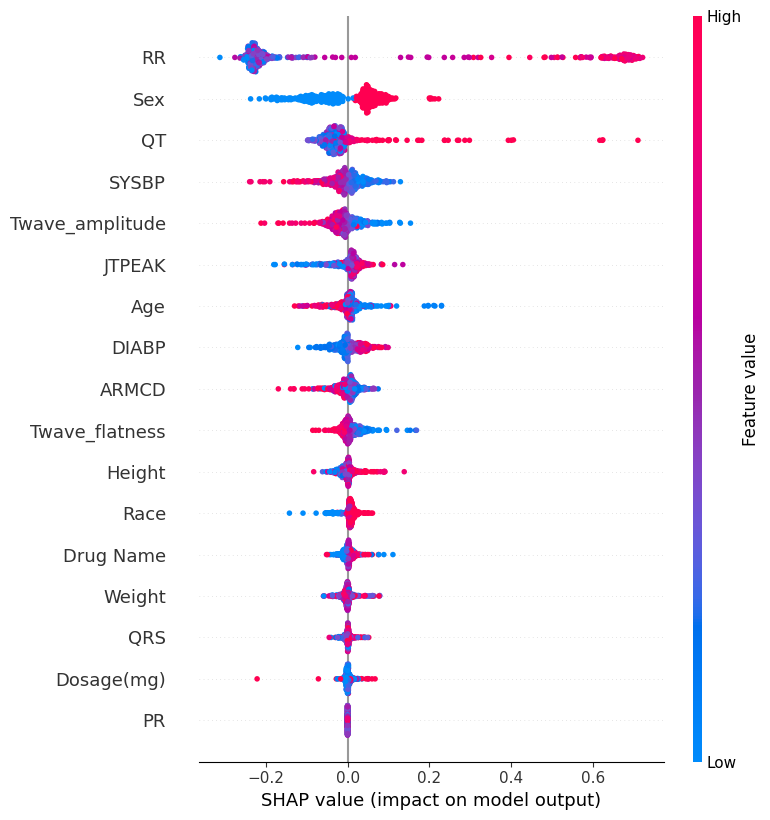

<Figure size 640x480 with 0 Axes>

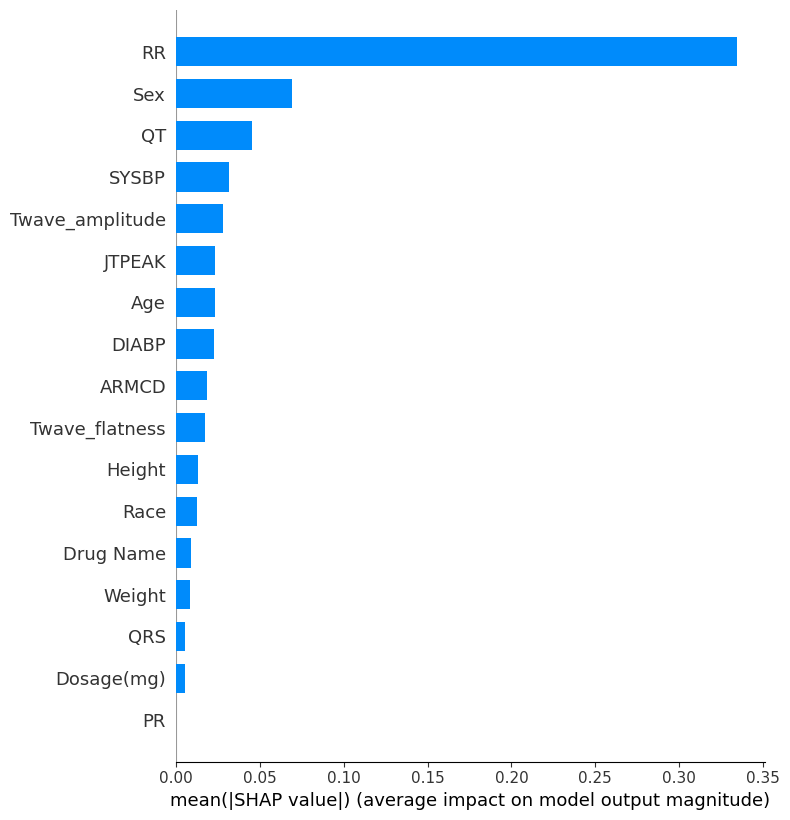

<Figure size 640x480 with 0 Axes>

In [ ]:
# Load Updated Transformer Model
transformer = tf.keras.models.load_model("results/Transformer_XGBoost/transformer_feature_extractor.h5")

# SHAP Explainer Setup
explainer = shap.Explainer(transformer, X_train[:100])  # Use 100 samples for efficiency

# SHAP Value Calculation (Using a sample for faster computation)
X_sample = X_test[:500]  # Limit test set for efficiency
shap_values = explainer(X_sample)

# **1. SHAP Summary Plot (BeeSwarm)**
plt.figure(figsize=(10, 8))
shap.summary_plot(shap_values, X_sample, feature_names=selected_features)
plt.savefig("shap_summary_plot_xgb.png")
plt.show()

# **2. SHAP Feature Importance (Bar Chart)**
plt.figure(figsize=(10, 6))
shap.summary_plot(shap_values, X_sample, feature_names=selected_features, plot_type="bar")
plt.savefig("shap_feature_importance_xgb.png")
plt.show()
